#Spatiotemporal Modeling of Water Chemistry to Predict Microbiological Events and Agricultural Yield Patterns Across New York State

---

##Project Setup and Environment

In [46]:
# === Imports ===
#Standard Library Imports
import os, re, json, math, time, textwrap, pathlib, itertools, socket, shap, zipfile
from pathlib import Path
from typing import Optional, Dict, Any, List

#HTTP and Web Utilities
import requests
from urllib.parse import quote_plus

#Numerical and Data Handling
import numpy as np
import pandas as pd

#Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Utilities
from functools import reduce
from google.colab import files

# == Machine Learning ==
#Model Selection and Metrics
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    roc_auc_score, average_precision_score, f1_score,
    auc, roc_curve, confusion_matrix
)

#Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier

#Preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import label_binarize

# === Local Data Directory Setup ===
!mkdir -p data

# === Global Configuration ===
DATA_ROOT = Path("/content/agny-SP/data").resolve()
SOCRATA_APP_TOKEN = os.getenv("NYC_OPENDATA_APP_TOKEN", None)


##Data Acquisition





###Datasets Download

In [47]:
# === Helpers ===
#Log Helper
def log(msg: str):
    print(f"[DL] {msg}")

#Save raw bytes to disk
def save_bytes(content: bytes, path: Path):
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "wb") as f:
        f.write(content)
    log(f"Saved: {path} ({len(content):,} bytes)")

#HTTP GET
def http_get(url: str, headers: Optional[Dict[str,str]] = None, params: Optional[Dict[str,Any]] = None, retries: int = 4, sleep: float = 1.0):
    last_err = None
    for i in range(retries):
        try:
            r = requests.get(url, headers=headers, params=params, timeout=60)
            r.raise_for_status()
            return r
        except Exception as e:
            last_err = e
            log(f"GET failed ({i+1}/{retries}) for {url}: {e}")
            time.sleep(sleep * (i+1))
    raise last_err

#Excel to CSV Conversion
def excel_to_csvs(xlsx_path: Path, out_dir: Path, preview_rows: int = 3):
    out_dir.mkdir(parents=True, exist_ok=True)
    xl = pd.ExcelFile(xlsx_path)
    shapes = {}
    for sheet in xl.sheet_names:
        df = xl.parse(sheet_name=sheet)
        safe_sheet = re.sub(r'[^A-Za-z0-9._-]+', '_', sheet).strip('_')
        csv_path = out_dir / f"{xlsx_path.stem}__{safe_sheet}.csv"
        df.to_csv(csv_path, index=False)
        shapes[sheet] = (df.shape[0], df.shape[1])
        log(f"  - wrote {csv_path.name}: {df.shape[0]} rows x {df.shape[1]} cols")
        if preview_rows > 0:
            with pd.option_context("display.width", 160, "display.max_columns", None):
                log(f"    Preview of '{sheet}':\n{df.head(preview_rows)}")
    return shapes

In [48]:
# === USGS ScienceBase Helpers ===

#Fetch item JSON metadata
def sciencebase_fetch(item_id: str) -> Dict[str, Any]:
    url = f"https://www.sciencebase.gov/catalog/item/{item_id}?format=json"
    r = http_get(url)
    return r.json()

#Dowmload matching Excel files
def sciencebase_download_excel(item_id: str, out_dir: Path, filename_match: Optional[str] = None):
    meta = sciencebase_fetch(item_id)
    files = meta.get("files") or []
    if not files:
        raise RuntimeError(f"No files listed for ScienceBase item {item_id}")

    downloaded = []
    for f in files:
        name = f.get("name") or ""
        url  = f.get("url")  or ""
        if not name or not url:
            continue
        if filename_match and filename_match.lower() not in name.lower():
            continue
        if not name.lower().endswith((".xlsx", ".xls")):
            continue

        out_dir.mkdir(parents=True, exist_ok=True)
        out_path = out_dir / name
        resp = http_get(url)
        save_bytes(resp.content, out_path)
        downloaded.append(out_path)
    if not downloaded:
        raise RuntimeError(f"No matching Excel files found for item {item_id} (filter={filename_match})")
    return downloaded

In [49]:
# === NYC Open Data (Socrata) Helper ===

def socrata_to_csv(resource_id: str, out_csv: Path, domain: str = "data.cityofnewyork.us", chunk: int = 50_000):
    headers = {}
    if SOCRATA_APP_TOKEN:
        headers["X-App-Token"] = SOCRATA_APP_TOKEN

    out_csv.parent.mkdir(parents=True, exist_ok=True)
    first = True
    offset = 0
    total_rows = 0

    while True:
        params = {
            "$limit": chunk,
            "$offset": offset
        }
        url = f"https://{domain}/resource/{resource_id}.json"
        resp = http_get(url, headers=headers, params=params)
        rows = resp.json()
        if not rows:
            break
        df = pd.DataFrame(rows)
        mode = "w" if first else "a"
        header = first
        df.to_csv(out_csv, index=False, mode=mode, header=header)
        total_rows += len(df)
        log(f"{resource_id}: fetched {len(df):,} rows (offset {offset:,})")
        first = False
        offset += chunk


    if total_rows > 0:
        df_head = pd.read_csv(out_csv, nrows=5)
        log(f"Wrote {total_rows:,} rows to {out_csv.name}. Preview:\n{df_head}")
    else:
        log(f"No rows found for {resource_id}")

In [50]:
# === WQP URL Builder and Downloader ===
def build_wqp_result_url(statecode: str,
                         start: str,
                         end: str,
                         profile: str,
                         providers: list,
                         characteristics: Optional[list] = None) -> str:
    base = (
        "https://www.waterqualitydata.us/data/Result/search?"
        f"statecode={quote_plus(statecode)}&"
        f"startDateLo={start}&"
        f"startDateHi={end}&"
        f"dataProfile={quote_plus(profile)}&"
        "mimeType=csv&zip=no&sorted=no"
    ) #start and end must be 'MM-DD-YYYY' because WQP is picky

    # Providers ["NWIS", "STORET"]
    for p in providers:
        base += f"&providers={quote_plus(p)}"

    return base

In [51]:
# === WQP result to CSV helper ===
def wqp_result_to_csv(cfg: Dict[str, Any], out_csv: Path):
    statecode = cfg.get("statecode", "US:36")
    start     = cfg.get("start", "2010-01-01")
    end       = cfg.get("end",   "2024-12-31")
    profile   = cfg.get("profile", "resultPhysChem")
    providers = cfg.get("providers", ["NWIS", "STORET"])

    url = build_wqp_result_url(
        statecode=statecode,
        start=start,
        end=end,
        profile=profile,
        providers=providers,
    )

    out_csv.parent.mkdir(parents=True, exist_ok=True)
    log(f"WQP: fetching {url}")

    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(out_csv, "wb") as f:
            for chunk in r.iter_content(chunk_size=1_000_000):
                if chunk:
                    f.write(chunk)

    try:
        df = pd.read_csv(out_csv, nrows=5, low_memory=False)
        log(f"Preview of {out_csv.name}:\n{df}")
    except Exception as e:
        log(f"Note: Could not parse preview as CSV yet ({e}). File still saved.")

In [52]:
# === Dataset Manifest Configuration ===
MANIFEST = {
    # --- USGS ScienceBase ---
    "USGS_LI_PineBarrens_2020": {
        "type": "sciencebase",
        "item_id": "62d9650bd34e2842e1edcf5a",
        "file_contains": "LIPineBarrens_2020_DataRelease.xlsx"
    },
    "USGS_LI_PineBarrens_2021": {
        "type": "sciencebase",
        "item_id": "63208bc8d34e71c6d67aa87e",
        "file_contains": "LIPineBarrens_2021_DataRelease.xlsx"
    },
    "USGS_LI_PineBarrens_2022": {
        "type": "sciencebase",
        "item_id": "64c7f088d34e70357a349e3b",
        "file_contains": "LIPineBarrens_2022_DataRelease.xlsx"
    },

    # --- Bronx River PFAS/pesticides/pharmaceuticals (ScienceBase) ---
    "USGS_BronxRiver_2019_PFAS_Pest_Pharma": {
        "type": "sciencebase",
        "item_id": "62d96512d34e2842e1edcf5e",
        "file_contains": "PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data.xlsx"
    },

    # --- Western NY & Mohawk River Basin Groundwater 2021 (ScienceBase) ---
    "USGS_WNY_Mohawk_2021": {
        "type": "sciencebase",
        "item_id": "65203b86d34e44db0e2e4406",
        "file_contains": ".xlsx"  # catch the main Excel
    },

    # --- Long Island shallow groundwater 2016-2018 (ScienceBase) ---
    "USGS_LI_ShallowGW_2016_2018": {
        "type": "sciencebase",
        "item_id": "5e83a6b4e4b01d50927b62a9",
        "file_contains": ".xlsx"
    },

    # --- NYC Open Data (Socrata) ---
    "NYC_DEP_Distribution_WQ": {
        "type": "socrata",
        "resource_id": "bkwf-xfky",
        "outfile": "Drinking_Water_Quality_Distribution_Monitoring_Data.csv"
    },
    "NYC_DEP_Watershed_WQ": {
        "type": "socrata",
        "resource_id": "y43c-5n92",
        "outfile": "Watershed_Water_Quality_Data.csv"
    },
     "NYC_DEP_Harbor_WQ": {
        "type": "socrata",
        "resource_id": "5uug-f49n",
        "outfile": "Harbor_Water_Quality.csv"
    },

    # --- USDA/NASS CSV ---
    "USDA_NASS_Regional_Crop_Yield": {
        "type": "direct_csv",
        "urls": [
            "https://quickstats.nass.usda.gov/data/printable/F749339A-E2BC-3A10-BFCC-91B6686691E0",
            "https://quickstats.nass.usda.gov/results/3D668DBB-3D36-3013-8052-B1F3C7580171"
        ],
        "outfile": "USDA_Regional_Crop_Yield_Data.csv"
    },
    "WQP_NY_Surface_PhysChem": {
        "type": "wqp",
        "profile": "resultPhysChem",
        "statecode": "US:36",
        "start": "01-01-2010",
        "end":   "01-01-2025",
        "providers": ["NWIS", "STORET"],
        "outfile": "WQP_NY_Surface_PhysChem.csv"
    },
    "WQP_NY_Surface_Bio": {
        "type": "wqp",
        "profile": "biological",
        "statecode": "US:36",
        "start": "01-01-2010",
        "end":   "01-01-2025",
        "providers": ["NWIS", "STORET"],
        "outfile": "WQP_NY_Surface_Bio.csv"
    },
    "WQP_NY_Surface_Sites": {
        "type": "direct_csv",
        "urls": [
            "https://www.waterqualitydata.us/data/Station/search?"
            "statecode=US%3A36&startDateLo=01-01-2010&startDateHi=01-01-2025&"
            "mimeType=csv&providers=NWIS&providers=STORET&zip=no"
        ],
        "outfile": "WQP_NY_Surface_Sites.csv"
    },
}

In [53]:
# === Manifest Run Function ===
def run_manifest(manifest: Dict[str, Dict[str, Any]], root: Path = DATA_ROOT):
    summary = {}

    for key, cfg in manifest.items():
        log(f"=== {key} ===")
        out_dir = root / key
        kind = cfg["type"]
        try:
          if kind == "sciencebase":
              item_id = cfg["item_id"]
              contains = cfg.get("file_contains")
              xls_paths = sciencebase_download_excel(item_id, out_dir, filename_match=contains)
              sheet_shapes_all = {}
              for p in xls_paths:
                  csv_dir = out_dir / "csv"
                  shapes = excel_to_csvs(p, csv_dir)
                  sheet_shapes_all[p.name] = shapes
              summary[key] = {
                  "excel_files": [str(p) for p in xls_paths],
                  "sheet_shapes": sheet_shapes_all
              }

          elif kind == "socrata":
              rid = cfg["resource_id"]
              outfile = cfg["outfile"]
              out_csv = out_dir / outfile
              socrata_to_csv(rid, out_csv)
              summary[key] = {"csv": str(out_csv)}

          elif kind == "direct_csv":
              urls = cfg["urls"]
              outfile = cfg["outfile"]
              out_csv = out_dir / outfile
              out_dir.mkdir(parents=True, exist_ok=True)
              last_err = None
              for u in urls:
                  try:
                      r = http_get(u)
                      content = r.content
                      # If linebreaks exist, save as CSV.
                      save_bytes(content, out_csv)

                      try:
                          df = pd.read_csv(out_csv, nrows=5)
                          log(f"Preview of {outfile}:\n{df}")
                      except Exception as e:
                          log(f"Note: Could not parse preview as CSV yet ({e}). File still saved.")
                      last_err = None
                      break
                  except Exception as e:
                      last_err = e
                      log(f"Direct CSV download failed for {u}: {e}")
              if last_err:
                  raise last_err
              summary[key] = {"csv": str(out_csv)}

          elif kind == "wqp":
              outfile = cfg["outfile"]
              out_csv = out_dir / cfg["outfile"]
              wqp_result_to_csv(cfg, out_csv)
              summary[key] = {"csv": str(out_csv)}

          else:
              log(f"Unknown type: {kind}")
              summary[key] = {"error": f"Unknown type: {kind}"}

        except Exception as e:
            log(f"!!! {key} FAILED: {e}")
            summary[key] = {"error": str(e)}
            continue

    return summary

###Dataset Overview

In [54]:
summary = run_manifest(MANIFEST)
log("\n=== DONE ===")
print(json.dumps(summary, indent=2)[:2000])  # trim preview
#WQP is incredibly slow, could take up to an hour

[DL] === USGS_LI_PineBarrens_2020 ===
[DL] Saved: /content/agny-SP/data/USGS_LI_PineBarrens_2020/LIPineBarrens_2020_DataRelease.xlsx (847,246 bytes)
[DL]   - wrote LIPineBarrens_2020_DataRelease__TOC.csv: 13 rows x 2 cols
[DL]     Preview of 'TOC':
  Citation: Bayraktar, B.N., Fisher, I.J., and Simonson, A.E., 2021, 2020 hydrologic data summary for the Central Pine Barrens Region, Suffolk County, New York (ver. 2.0, February 2024): U.S. Geological Survey data release, https://doi.org/10.5066/P9SLP8FX  \
0                                  Table of Contents                                                                                                                                                                                                               
1                                              Table                                                                                                                                                                                   

In [55]:
#sanity test (for Socrata)
test_out = DATA_ROOT / "_tests" / "bkwf-xfky_sample.csv"
socrata_to_csv("bkwf-xfky", test_out, chunk=10_000)  # first ~10k per page, paginates automatically
pd.read_csv(test_out, nrows=5)

[DL] bkwf-xfky: fetched 10,000 rows (offset 0)
[DL] bkwf-xfky: fetched 10,000 rows (offset 10,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 20,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 30,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 40,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 50,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 60,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 70,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 80,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 90,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 100,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 110,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 120,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 130,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 140,000)
[DL] bkwf-xfky: fetched 10,000 rows (offset 150,000)
[DL] bkwf-xfky: fetched 2,279 rows (offset 160,000)
[DL] Wrote 162,279 rows to bkwf-xfky_sample.csv. Preview:
   sample_number              sample_date   sample_time  

,sample_number,sample_date,sample_time,sample_site,sample_class,residual_free_chlorine_mg_l,turbidity_ntu,coliform_quanti_tray_mpn_100ml,e_coli_quanti_tray_mpn_100ml,fluoride_mg_l
0,202436678,2024-12-31T00:00:00.000,09:47:00.000,51050,Compliance,0.50,0.69,<1,<1,NaN
1,202436679,2024-12-31T00:00:00.000,10:28:00.000,58350,Compliance,0.46,0.82,<1,<1,NaN
2,202436680,2024-12-31T00:00:00.000,09:08:00.000,59350,Compliance,0.39,0.75,<1,<1,NaN
3,202436675,2024-12-31T00:00:00.000,08:45:00.000,78450,Compliance,0.32,0.70,<1,<1,NaN
4,202426025,2024-10-01T00:00:00.000,08:36:00.000,10750,Compliance,0.84,0.47,<1,<1,0.71


In [56]:
# === Print project data folder tree ===
def print_tree(path: Path, prefix: str = ""):
    """Recursively print the directory tree starting at 'path'."""
    if not path.exists():
        print(f"(Path does not exist): {path}")
        return

    items = sorted(path.iterdir(), key=lambda p: (p.is_file(), p.name.lower()))
    for i, item in enumerate(items):
        connector = "└── " if i == len(items) - 1 else "├── "
        print(prefix + connector + item.name)

        if item.is_dir():
            extension = "    " if i == len(items) - 1 else "│   "
            print_tree(item, prefix + extension)

print("\n=== Project Data Folder Structure ===")
print(f"Root: {DATA_ROOT}\n")
print_tree(DATA_ROOT)


=== Project Data Folder Structure ===
Root: /content/agny-SP/data

├── _tests
│   └── bkwf-xfky_sample.csv
├── NYC_DEP_Distribution_WQ
│   └── Drinking_Water_Quality_Distribution_Monitoring_Data.csv
├── NYC_DEP_Harbor_WQ
│   └── Harbor_Water_Quality.csv
├── NYC_DEP_Watershed_WQ
│   └── Watershed_Water_Quality_Data.csv
├── USDA_NASS_Regional_Crop_Yield
│   └── USDA_Regional_Crop_Yield_Data.csv
├── USGS_BronxRiver_2019_PFAS_Pest_Pharma
│   ├── csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__Constituent_List.csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__Field_Data.csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__Methods.csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__Pesticide_Data.csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__Pesticide_Spike_Data.csv
│   │   ├── PFAS_pesticides_pharmaceuticals_BronxRiver2019_NYC_NY_all_data__P

###Preprocessing Utilities

In [57]:
# === Unit conversion Utilities ===
UNIT_CONVERSIONS = {
    ("mg/L", "ug/L"): 1000.0,
    ("ug/L", "ug/L"): 1.0,
    ("ng/L", "ug/L"): 0.001,
}

def convert_unit(value, from_unit, to_unit="ug/L"):
    if pd.isna(value):
        return np.nan
    key = (str(from_unit).strip(), str(to_unit).strip())
    if key not in UNIT_CONVERSIONS:
        return np.nan
    return float(value) * UNIT_CONVERSIONS[key]

# === Non-Detect Handling (Censored Data) ===
def handle_non_detect(row, lod_col="lod", nd_flag_col="nd_flag",
                      value_col="value_converted", impute="lod/2"):
    """Two-channel ND encoding: returns value_imputed and nd_indicator."""
    nd_vals = {"nd","non-detect","non detect","<lod","<dl","<mdl","true","1","present but below dl"}
    nd = 1 if str(row.get(nd_flag_col, "")).strip().lower() in nd_vals else 0
    lod = row.get(lod_col, np.nan)
    val = row.get(value_col, np.nan)
    if nd == 1:
        if impute == "lod/2" and pd.notna(lod) and float(lod) > 0:
            out = float(lod) / 2.0
        else:
            out = 0.0
    else:
        out = val
    return pd.Series({"value_imputed": out, "nd_indicator": nd})

# === Temporal Helper: Season Labels ===
def season_key(ts):
    m = pd.to_datetime(ts).month
    if m in (12, 1, 2): return "DJF"
    if m in (3, 4, 5):  return "MAM"
    if m in (6, 7, 8):  return "JJA"
    return "SON"

# === Outlier/Spike Detection using MAD ===
def mad_spike_flags(values, thresh=3.5):
    x = pd.to_numeric(values, errors="coerce").dropna().values
    if x.size < 3: return 0
    med = np.median(x)
    mad = np.median(np.abs(x - med))
    if mad == 0: return 0
    z = np.abs(x - med) / mad
    return int((z > thresh).sum())

# === Spatial Helpers ===
#Distances
def haversine_km(lat1, lon1, lat2, lon2):
    """Vectorized haversine distance in km."""
    R = 6371.0088
    p = np.pi / 180.0
    dlat = (lat2 - lat1) * p
    dlon = (lon2 - lon1) * p
    a = np.sin(dlat/2)**2 + np.cos(lat1*p)*np.cos(lat2*p)*np.sin(dlon/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))
#Kernels
def gaussian_kernel_weights(dist_km, sigma_km=4.0, hard_cut_km=10.0):
    """Gaussian weights; zero beyond hard_cut_km."""
    d = np.array(dist_km, dtype=float)
    w = np.exp(-(d**2) / (2.0 * (sigma_km**2)))
    w[d > hard_cut_km] = 0.0
    return w

In [58]:
plt.rcParams["figure.dpi"] = 150
plt.rcParams["font.size"] = 11

## Framework 1 (Microbiology Prediction)




###Model 1 (Coliform & E. Coli in NYC Drinking Water)

####Load Dataset

In [173]:
# === Load NYC Distribution Water Quality Dataset ===
dist_path = DATA_ROOT / "NYC_DEP_Distribution_WQ" / "Drinking_Water_Quality_Distribution_Monitoring_Data.csv"
df_dist_raw = pd.read_csv(dist_path)

print("Distribution raw shape:", df_dist_raw.shape)
print(df_dist_raw.columns.tolist()[:50])  # peek columns
df_dist_raw.head()

Distribution raw shape: (162279, 10)
['sample_number', 'sample_date', 'sample_time', 'sample_site', 'sample_class', 'residual_free_chlorine_mg_l', 'turbidity_ntu', 'coliform_quanti_tray_mpn_100ml', 'e_coli_quanti_tray_mpn_100ml', 'fluoride_mg_l']


/tmp/ipython-input-105433506.py:3: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df_dist_raw = pd.read_csv(dist_path)


,sample_number,sample_date,sample_time,sample_site,sample_class,residual_free_chlorine_mg_l,turbidity_ntu,coliform_quanti_tray_mpn_100ml,e_coli_quanti_tray_mpn_100ml,fluoride_mg_l
0,202436678,2024-12-31T00:00:00.000,09:47:00.000,51050,Compliance,0.50,0.69,<1,<1,NaN
1,202436679,2024-12-31T00:00:00.000,10:28:00.000,58350,Compliance,0.46,0.82,<1,<1,NaN
2,202436680,2024-12-31T00:00:00.000,09:08:00.000,59350,Compliance,0.39,0.75,<1,<1,NaN
3,202436675,2024-12-31T00:00:00.000,08:45:00.000,78450,Compliance,0.32,0.70,<1,<1,NaN
4,202426025,2024-10-01T00:00:00.000,08:36:00.000,10750,Compliance,0.84,0.47,<1,<1,0.71


In [174]:
# === Fetch and Inspect NYC Site Metadata ===
#Accessing Distribution Sites LCR Monitoring Results (maps site IDs to to names / addresses / boroughs.)
meta_sites = requests.get(
    "https://data.cityofnewyork.us/api/views/g63j-swsd.json"
).json()

print(meta_sites.keys())                  # sanity check
print(meta_sites.get("metadata", {}).keys())

# Try both possible locations
attachments = meta_sites.get("attachments")
if not attachments:
    attachments = meta_sites.get("metadata", {}).get("attachments", [])

print("Found", len(attachments), "attachments")
for att in attachments:
    print(att.get("name"), "->", att.get("assetUrl"))

dict_keys(['id', 'name', 'assetType', 'attribution', 'averageRating', 'category', 'createdAt', 'description', 'diciBackend', 'displayType', 'downloadCount', 'hideFromCatalog', 'hideFromDataJson', 'indexUpdatedAt', 'locked', 'newBackend', 'numberOfComments', 'oid', 'provenance', 'publicationAppendEnabled', 'publicationDate', 'publicationGroup', 'publicationStage', 'rowClass', 'rowsUpdatedAt', 'rowsUpdatedBy', 'tableId', 'totalTimesRated', 'viewCount', 'viewLastModified', 'viewType', 'approvals', 'clientContext', 'columns', 'grants', 'metadata', 'owner', 'query', 'rights', 'tableAuthor', 'flags'])
dict_keys(['rdfSubject', 'rdfClass', 'jsonQuery', 'attachments', 'custom_fields', 'rowLabel', 'availableDisplayTypes', 'renderTypeConfig'])
Found 2 attachments
Distribution Water Quality Sampling Sites for OpenData.xlsx -> None
Data_Dictionary_LCR_data_101817.xlsx -> None


In [175]:
# === Search for Relevant NYC OpenData Views (Exploratory) ===
#Looking through codes
search_url = "https://data.cityofnewyork.us/api/search/views?q=distribution%20water%20site"
res = requests.get(search_url).json()

print(res.keys())  # -> dict_keys(['count', 'results'])

for item in res.get("results", []):
    view = item.get("view", {})
    print(view.get("name"), view.get("id"))

dict_keys(['count', 'results'])
Dewatered Solids and Biosolids Allocations per Biosolids Management Practice Site 95kh-h6zc
NYC Building Energy and Water Data Disclosure for Local Law 84 2023 to Present (Data for Calendar Year 2022-Present) 5zyy-y8am
Energy and Water Data Disclosure for Local Law 84 2022 (Data for Calendar Year 2021) 7x5e-2fxh
Energy and Water Data Disclosure for Local Law 84 2011 (Data for Calendar Year 2010) kswi-37bp
Energy and Water Data Disclosure for Local Law 84 2012 (Data for Calendar Year 2011) k7nh-aufb
Energy and Water Data Disclosure for Local Law 84 2014 (Data for Calendar Year 2013) yr5p-wjer
Energy and Water Data Disclosure for Local Law 84 2015 (Data for Calendar Year 2014) nbun-wekj
Energy and Water Data Disclosure for Local Law 84 2016 (Data for Calendar Year 2015) 77q4-nkfh
Energy and Water Data Disclosure for Local Law 84 2017 (Data for Calendar Year 2016) utpj-74fz
Energy and Water Data Disclosure for Local Law 84 2018 (Data for Calendar Year 2017)

In [176]:
# === Download and Load Site Lookup Table ===
#Grab the blobId
meta_sites = requests.get(
    "https://data.cityofnewyork.us/api/views/g63j-swsd.json"
).json()

attachments = meta_sites.get("metadata", {}).get("attachments", [])
print("Found", len(attachments), "attachments\n")

for att in attachments:
    print(att)  # see full structure

sites_asset_id = "2dbab8ac-f603-4725-bb7f-d684dc27dfa3"
sites_url = f"https://data.cityofnewyork.us/api/views/g63j-swsd/files/{sites_asset_id}?download=true"

df_sites = pd.read_excel(sites_url)

print(df_sites.columns)
df_sites.head()

Found 2 attachments

{'filename': 'Distribution Water Quality Sampling Sites for OpenData.xlsx', 'assetId': '2dbab8ac-f603-4725-bb7f-d684dc27dfa3', 'name': 'Distribution Water Quality Sampling Sites for OpenData.xlsx'}
{'filename': 'Data_Dictionary_LCR_data_101817.xlsx', 'assetId': '3cd5b125-fbd3-469f-80d7-4babd556449a', 'name': 'Data_Dictionary_LCR_data_101817.xlsx'}
Index(['Site', 'Sample Station (SS) - LOCATION DESCRIPTION', 'X - Coordinate',
       'Y - Coordinate'],
      dtype='object')


,Site,Sample Station (SS) - LOCATION DESCRIPTION,X - Coordinate,Y - Coordinate
0,1S03,SS - Shaft 3 of City Tunnel No.1 - E/S Goulden...,1024950,264277
1,1S04,SS - Shaft 4 of City Tunnel No.1 - IFO 2780 Re...,1012568,256577
2,1S03A,SS - Shaft 3A of City Tunnel No.2 - S/S E 233r...,1024721,264392
3,1S07,SS - Shaft 7 of City Tunnel No.1 - NE/S W 167t...,1004013,245233
4,1S03B,SS - Shaft 3B of City Tunnel No.3 - W/S Jerome...,1014949,260688


In [177]:
# === Check Overlap between Sample Site Codes and Metadata Sites ===

df_dist_raw['sample_site_str'] = df_dist_raw['sample_site'].astype(str)
df_sites['Site_str'] = df_sites['Site'].astype(str)

# Number of site codes are in common
common_sites = set(df_dist_raw['sample_site_str']) & set(df_sites['Site_str'])
print("Number of shared site codes:", len(common_sites))

print(list(common_sites)[:20])

Number of shared site codes: 394
['50050', '25950', '18750', '77150', '33950', '22700', '40150', '24650', '34200', '24450', '1SCH4', '58600', '38300', '48700', '21550', '50850', '76950', '28550', '21400', '36100']


In [178]:
# Normalize column names and types
df_dist = df_dist_raw.copy()
df_dist['sample_site'] = df_dist['sample_site'].astype(str)
df_sites['Site'] = df_sites['Site'].astype(str)

# Rename the description column so it’s easier to use later
df_sites_renamed = df_sites.rename(columns={
    'Site': 'sample_site',
    'Sample Station (SS) - LOCATION DESCRIPTION': 'site_description'
})

# Merge
df_dist_enriched = df_dist.merge(
    df_sites_renamed,
    on='sample_site',
    how='left'
)

# Inspect a few rows
df_dist_enriched[
    ['sample_number', 'sample_date', 'sample_time',
     'sample_site', 'site_description']
].head()

,sample_number,sample_date,sample_time,sample_site,site_description
0,202436678,2024-12-31T00:00:00.000,09:47:00.000,51050,"SS - IFO 163 E/S Tysens La, 2nd SS N/O Coverly..."
1,202436679,2024-12-31T00:00:00.000,10:28:00.000,58350,"SS - IFO 139 NE/S W""ester Ave, 2nd SS N/O Hyla..."
2,202436680,2024-12-31T00:00:00.000,09:08:00.000,59350,"SS - IFO 1824 S/S Victory Blvd, BTW Raymond Av..."
3,202436675,2024-12-31T00:00:00.000,08:45:00.000,78450,"SS - IFO 88-18 W/S Hollis Court Blvd, 2nd SS S..."
4,202426025,2024-10-01T00:00:00.000,08:36:00.000,10750,"SS - N/S Bartow Ave, 2nd SS W/O Co-op City Blv..."


####Feature Engineering

In [179]:
# === Column Normalization Map (Model 1) ===
DIST_COLS = {
    "date": [
        "sample_date"
    ],
    "site": [
        "sample_site",
        "STATION_ID",
        "Location"
    ],
    "site_description": [
        "site_description",
        "Sample Station (SS) - LOCATION DESCRIPTION"
    ],
    "total_coliform": [
        "coliform_quanti_tray_mpn_100ml",
        "total_coliform_mpn_100ml",
        "TOTAL_COLIFORM",
        "total_coliform"
    ],
    "e_coli": [
        "e_coli_quanti_tray_mpn_100ml",
        "e_coli_mpn_100ml",
        "E_COLI",
        "ecoli"
    ],
    "residual_chlorine": [
        "residual_free_chlorine_mg_l",
        "FREE_CHLORINE_RESIDUAL",
        "chlorine"
    ],
    "turbidity": [
        "turbidity_ntu",
        "TURBIDITY",
        "turbidity"
    ],
    "fluoride": [
        "fluoride_mg_l",
        "FLUORIDE"
    ],
    "temperature": [
        "temperature_c",
        "TEMP_C",
        "Temperature"
    ],
    "ph": [
        "ph",
        "PH"
    ]
}

def normalize_columns(df, colmap, verbose=True):
    df = df.copy()

    # Lowercase raw columns for matching
    original_cols = df.columns.tolist()
    lowered = {c.lower(): c for c in original_cols}

    df_norm = pd.DataFrame()

    for unified_name, variants in colmap.items():
        # Normalize the variants to lowercase
        variants_lower = [v.lower() for v in variants]

        # Find first matching variant in the dataframe
        match = None
        for variant in variants_lower:
            if variant in lowered:
                match = lowered[variant]
                break

        if match is None:
            if verbose:
                print(f"[WARN] No column found for '{unified_name}' from candidates {variants}")
            df_norm[unified_name] = None
        else:
            df_norm[unified_name] = df[match]
            if verbose:
                print(f"[OK]   '{match}' → '{unified_name}'")

    return df_norm


In [180]:
# === Apply Column Normalization to Distribution Data ===
df_dist = normalize_columns(df_dist_enriched, DIST_COLS, verbose=True)
df_dist.head()

[OK]   'sample_date' → 'date'
[OK]   'sample_site' → 'site'
[OK]   'site_description' → 'site_description'
[OK]   'coliform_quanti_tray_mpn_100ml' → 'total_coliform'
[OK]   'e_coli_quanti_tray_mpn_100ml' → 'e_coli'
[OK]   'residual_free_chlorine_mg_l' → 'residual_chlorine'
[OK]   'turbidity_ntu' → 'turbidity'
[OK]   'fluoride_mg_l' → 'fluoride'
[WARN] No column found for 'temperature' from candidates ['temperature_c', 'TEMP_C', 'Temperature']
[WARN] No column found for 'ph' from candidates ['ph', 'PH']


,date,site,site_description,total_coliform,e_coli,residual_chlorine,turbidity,fluoride,temperature,ph
0,2024-12-31T00:00:00.000,51050,"SS - IFO 163 E/S Tysens La, 2nd SS N/O Coverly...",<1,<1,0.50,0.69,NaN,None,None
1,2024-12-31T00:00:00.000,58350,"SS - IFO 139 NE/S W""ester Ave, 2nd SS N/O Hyla...",<1,<1,0.46,0.82,NaN,None,None
2,2024-12-31T00:00:00.000,59350,"SS - IFO 1824 S/S Victory Blvd, BTW Raymond Av...",<1,<1,0.39,0.75,NaN,None,None
3,2024-12-31T00:00:00.000,78450,"SS - IFO 88-18 W/S Hollis Court Blvd, 2nd SS S...",<1,<1,0.32,0.70,NaN,None,None
4,2024-10-01T00:00:00.000,10750,"SS - N/S Bartow Ave, 2nd SS W/O Co-op City Blv...",<1,<1,0.84,0.47,0.71,None,None


In [181]:
df_dist[
    ["total_coliform", "e_coli"]
].sample(20)


,total_coliform,e_coli
34505,<1,<1
129858,<1,<1
48329,<1,<1
121580,<1,<1
113358,<1,<1
111716,<1,<1
140611,<1,<1
40059,<1,<1
34937,<1,<1
140092,<1,<1


In [182]:
# === Clean Microbiology Columns and Build Binary Labels ===
# Clean microbiology columns (total_coliform, e_coli)
def clean_mpn(x):
    if pd.isna(x):
        return np.nan

    x = str(x).strip()

    # Anything starting with "<" is nondetect, treat as 0
    if x.startswith("<"):
        return 0

    # Other nondetect words
    if x.lower() in ["nd", "non-detect", "non detect", "absent", "negative", "none"]:
        return 0

    try:
        return float(x)
    except:
        return np.nan


# Apply to normalized microbiology columns
df_dist["total_coliform"] = df_dist["total_coliform"].apply(clean_mpn)
df_dist["e_coli"] = df_dist["e_coli"].apply(clean_mpn)

df_dist["date"] = pd.to_datetime(df_dist["date"])
df_dist["year_month"] = df_dist["date"].dt.to_period("M").astype(str)


# Sample-level micro event (per row)
df_dist["micro_event"] = (
    (df_dist["total_coliform"].fillna(0) > 0) |
    (df_dist["e_coli"].fillna(0) > 0)
).astype(int)

print("Sample-level micro_event value counts:")
print(df_dist["micro_event"].value_counts(dropna=False))

Sample-level micro_event value counts:
micro_event
0    161925
1       708
Name: count, dtype: int64


In [183]:
# === Prepare Numeric Feature Columns for Aggregation ===
dist_feature_cols = ["residual_chlorine", "turbidity", "fluoride", "temperature", "ph"]

# Checking these columns exist (temperature/pH are missing)
for c in dist_feature_cols:
    if c not in df_dist.columns:
        df_dist[c] = np.nan

def clean_numeric_feature(s: pd.Series) -> pd.Series:
    s = s.copy()

    # Only operate on object / string dtypes
    if s.dtype != "object":
        return pd.to_numeric(s, errors="coerce")

    # Convert to string and strip
    s = s.astype(str).str.strip()

    lt_mask = s.str.match(r"^<\s*[0-9.]+$")
    s.loc[lt_mask] = "0"

    s = s.str.extract(r"([0-9.]+)", expand=False)

    # Final numeric cast
    return pd.to_numeric(s, errors="coerce")

# Apply cleaning to each feature column
for c in dist_feature_cols:
    df_dist[c] = clean_numeric_feature(df_dist[c])

# Aggregation dict: mean/std/median for features, max for label
agg_dict = {}
for c in dist_feature_cols:
    agg_dict[c] = ["mean", "std", "median"]

agg_dict["micro_event"] = ["max"]  # any event in that site×month

dist_monthly = (
    df_dist
    .groupby(["site", "year_month"])
    .agg(agg_dict)
)

# Flatten MultiIndex columns: e.g., residual_chlorine_mean
dist_monthly.columns = ["_".join(col).strip() for col in dist_monthly.columns.values]
dist_monthly = dist_monthly.reset_index()

# Target
dist_monthly["y"] = dist_monthly["micro_event_max"].astype(int)

# Feature columns (all aggregated predictors)
feature_cols_dist = [
    c for c in dist_monthly.columns
    if any(c.startswith(f) for f in dist_feature_cols)
]

# Drop rows where ALL features are NaN
dist_monthly = dist_monthly.dropna(subset=feature_cols_dist, how="all")

print("Dist monthly shape:", dist_monthly.shape)
dist_monthly.head()

Dist monthly shape: (47886, 19)


,site,year_month,residual_chlorine_mean,residual_chlorine_std,residual_chlorine_median,turbidity_mean,turbidity_std,turbidity_median,fluoride_mean,fluoride_std,fluoride_median,temperature_mean,temperature_std,temperature_median,ph_mean,ph_std,ph_median,micro_event_max,y
0,1000,2023-01,0.600000,0.070711,0.600,0.790000,0.042426,0.79,0.705000,0.007071,0.705,NaN,NaN,NaN,NaN,NaN,NaN,0,0
1,1000,2023-03,0.683871,0.078302,0.670,0.363226,0.261781,0.18,0.686129,0.031377,0.680,NaN,NaN,NaN,NaN,NaN,NaN,0,0
2,10150,2015-01,0.505000,0.077782,0.505,0.980000,0.113137,0.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
3,10150,2015-02,0.476667,0.170978,0.560,1.023333,0.116762,1.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
4,10150,2015-03,0.573333,0.023094,0.560,1.123333,0.235443,1.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


In [184]:
pos_idx = df_dist[df_dist["e_coli"] >= 1.0].sample(5, random_state=0).index

df_dist_raw.loc[pos_idx, ["coliform_quanti_tray_mpn_100ml", "e_coli_quanti_tray_mpn_100ml"]]
df_dist.loc[pos_idx, ["total_coliform", "e_coli", "micro_event"]]


,total_coliform,e_coli,micro_event
137602,1.0,1.0,1
95820,1.0,1.0,1
91337,1.0,1.0,1
101217,1.0,1.0,1
15415,59.1,2.0,1


#### Modeling Architecture

In [185]:
#Inspect daily labels
df_dist["micro_event_sample"] = (
    (df_dist["total_coliform"] > 0) |
    (df_dist["e_coli"] > 0)
).astype(int)

<Axes: xlabel='date'>

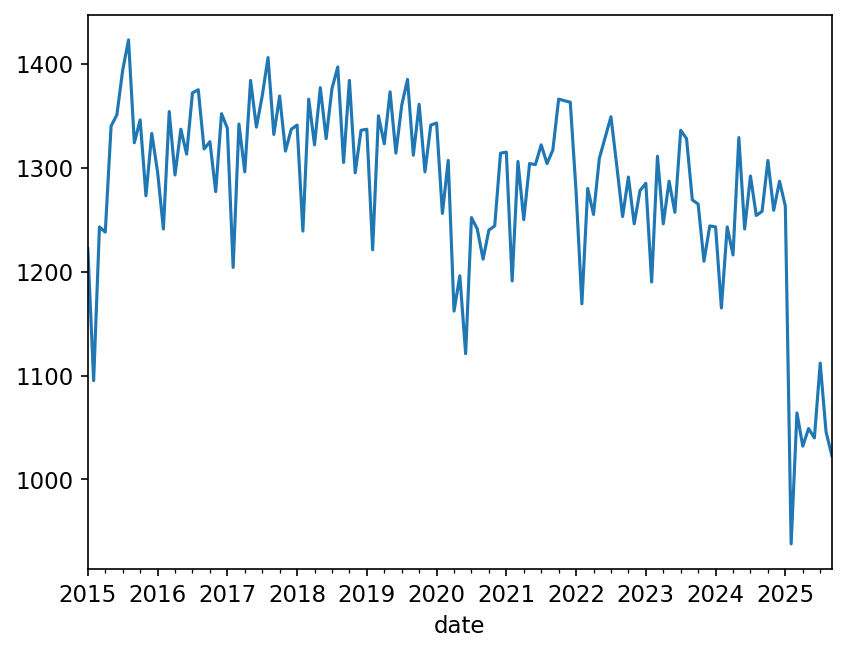

In [186]:
#How many water samples were taken each day across all sites
df_dist["date"].dt.to_period("M").value_counts().sort_index().plot()

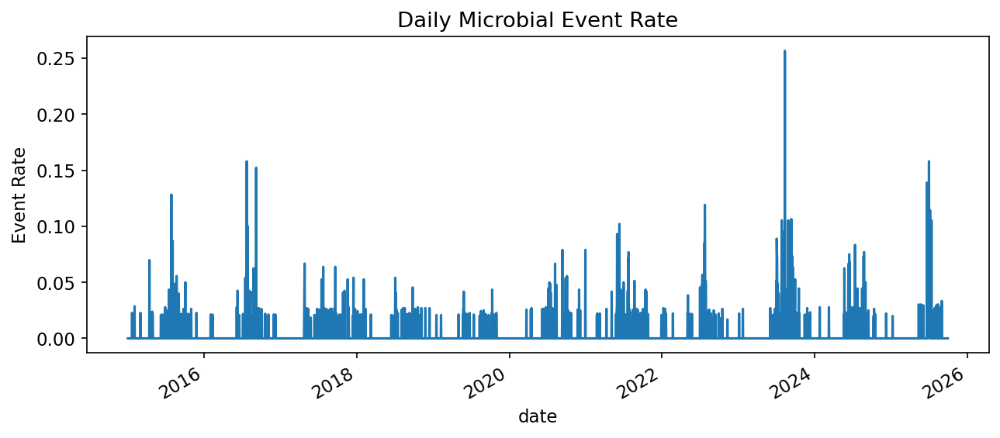

In [187]:
daily_event_rate = (
    df_dist
    .groupby("date")["micro_event_sample"]
    .mean()    # because 0/1 => mean = proportion positive
    .sort_index()
)

daily_event_rate.plot(figsize=(10,4))
plt.title("Daily Microbial Event Rate")
plt.ylabel("Event Rate")
plt.show()

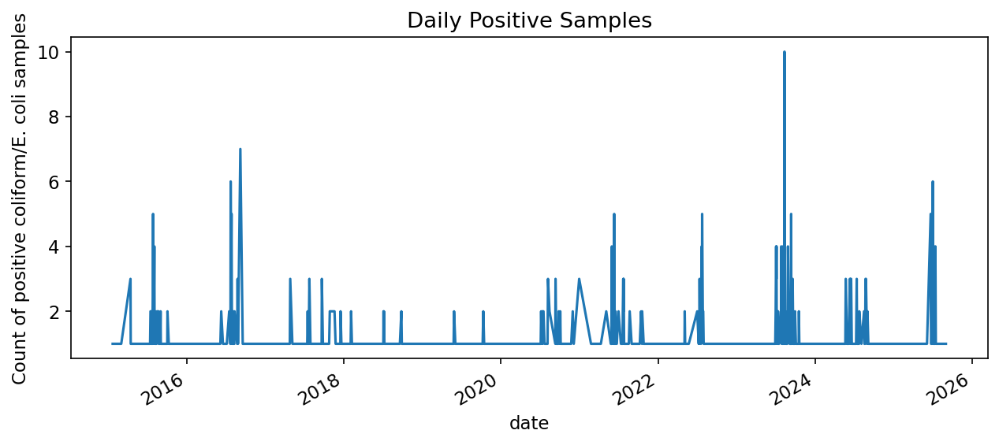

In [188]:
daily_pos = (
    df_dist[df_dist["micro_event_sample"] == 1]
    .groupby("date")
    .size()
)

daily_pos.plot(figsize=(10,4))
plt.title("Daily Positive Samples")
plt.ylabel("Count of positive coliform/E. coli samples")
plt.show()

In [189]:
#Make a datetime axis
dm = dist_monthly.copy()

# Convert year_month ("YYYY-MM") to a datetime - first of month (for histograms)
dm["year_month_dt"] = pd.to_datetime(dm["year_month"] + "-01")

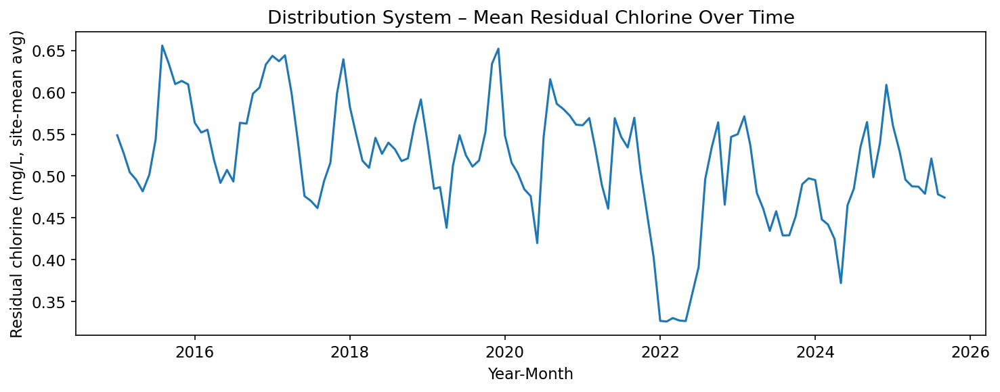

In [190]:
monthly_global = (
    dm
    .groupby("year_month_dt")["residual_chlorine_mean"]
    .mean()
    .sort_index()
)

plt.figure(figsize=(10, 4))
plt.plot(monthly_global.index, monthly_global.values)
plt.xlabel("Year-Month")
plt.ylabel("Residual chlorine (mg/L, site-mean avg)")
plt.title("Distribution System – Mean Residual Chlorine Over Time")
plt.tight_layout()
plt.show()


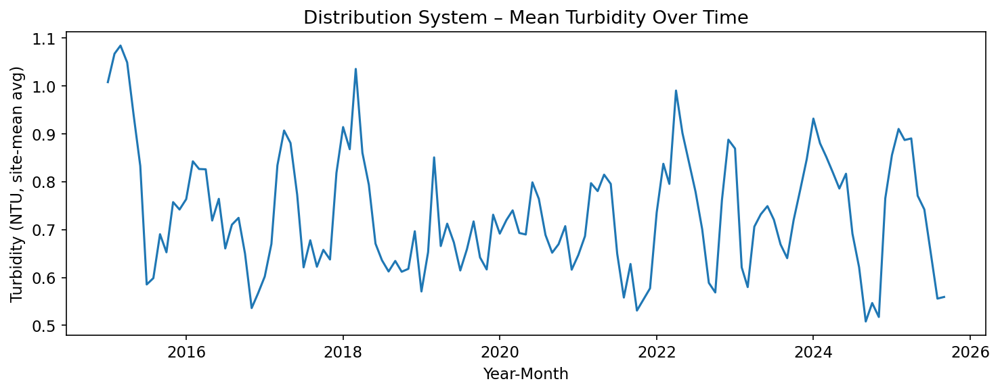

In [191]:
monthly_turb = (
    dm
    .groupby("year_month_dt")["turbidity_mean"]
    .mean()
    .sort_index()
)

plt.figure(figsize=(10, 4))
plt.plot(monthly_turb.index, monthly_turb.values)
plt.xlabel("Year-Month")
plt.ylabel("Turbidity (NTU, site-mean avg)")
plt.title("Distribution System – Mean Turbidity Over Time")
plt.tight_layout()
plt.show()


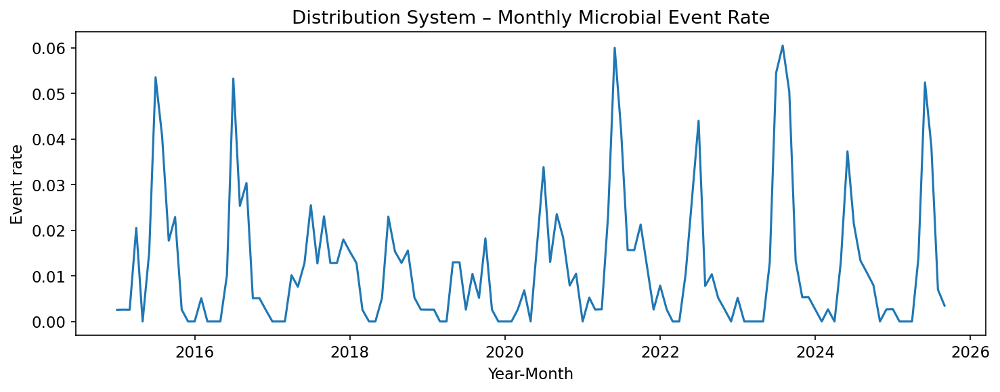

In [192]:
# Micro event rate per month (fraction of site×months with event)
monthly_event_rate = (
    dm
    .groupby("year_month_dt")["y"]
    .mean()  # because y is 0/1, mean = rate
    .sort_index()
)

plt.figure(figsize=(10, 4))
plt.plot(monthly_event_rate.index, monthly_event_rate.values)
plt.xlabel("Year-Month")
plt.ylabel("Event rate")
plt.title("Distribution System – Monthly Microbial Event Rate")
plt.tight_layout()
plt.show()


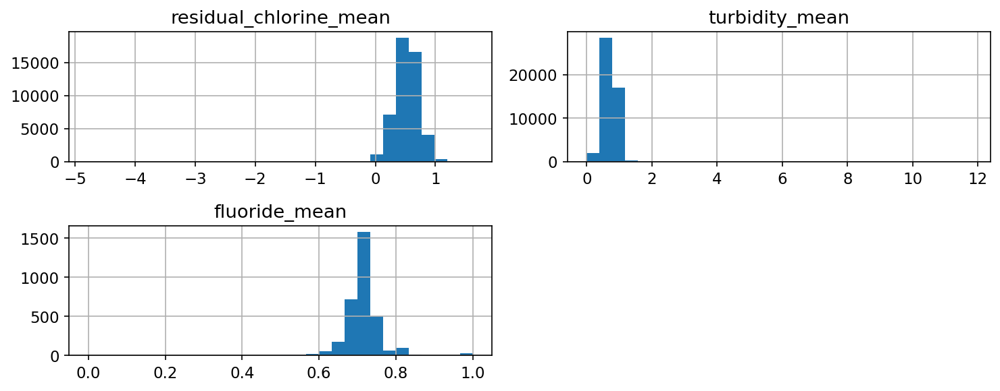

In [193]:
feature_cols_dist = ["residual_chlorine_mean",
                     "turbidity_mean",
                     "fluoride_mean"]

dm[feature_cols_dist].hist(bins=30, figsize=(10, 4))
plt.tight_layout()
plt.show()

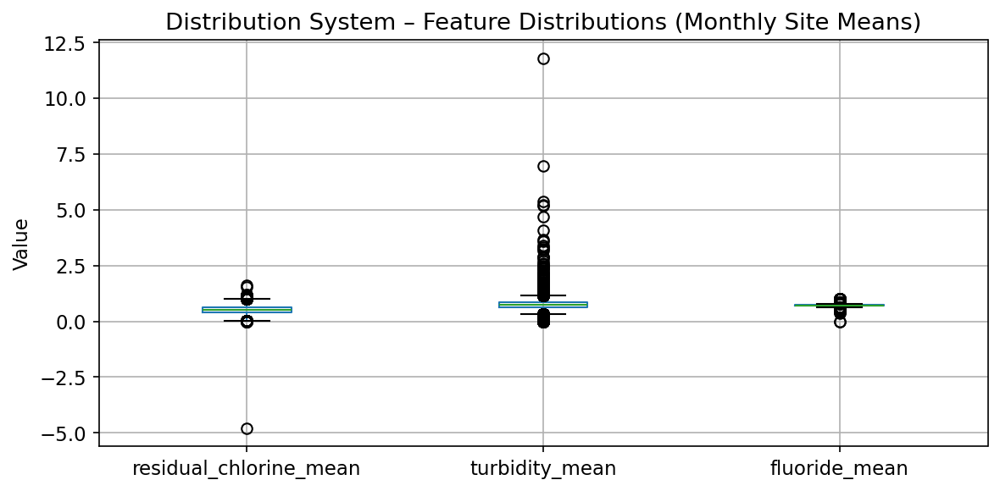

In [194]:
plt.figure(figsize=(8, 4))
dm[feature_cols_dist].boxplot()
plt.ylabel("Value")
plt.title("Distribution System – Feature Distributions (Monthly Site Means)")
plt.tight_layout()
plt.show()

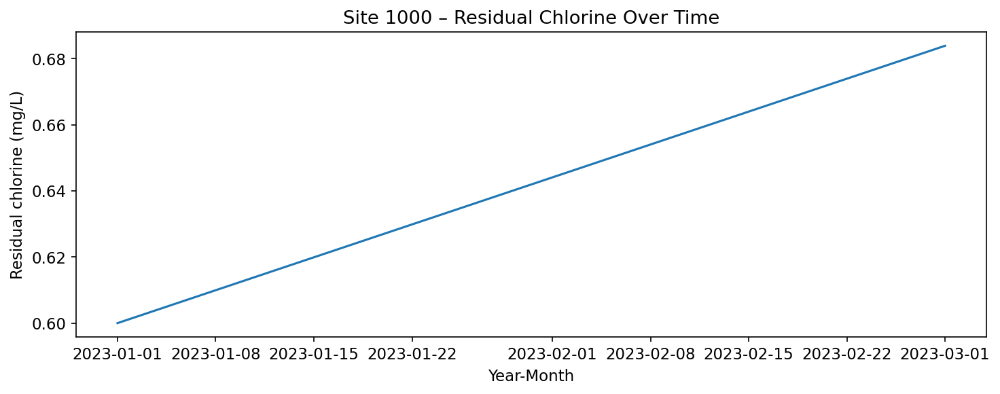

In [195]:
site_id = "1000"

site_df = dm[dm["site"] == site_id].copy()
site_df = site_df.sort_values("year_month_dt")

plt.figure(figsize=(10, 4))
plt.plot(site_df["year_month_dt"], site_df["residual_chlorine_mean"])
plt.xlabel("Year-Month")
plt.ylabel("Residual chlorine (mg/L)")
plt.title(f"Site {site_id} – Residual Chlorine Over Time")
plt.tight_layout()
plt.show()


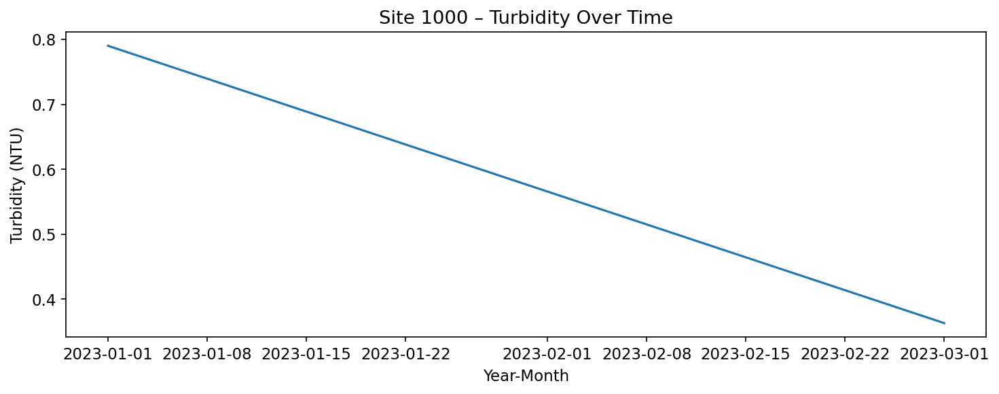

In [196]:
plt.figure(figsize=(10, 4))
plt.plot(site_df["year_month_dt"], site_df["turbidity_mean"])
plt.xlabel("Year-Month")
plt.ylabel("Turbidity (NTU)")
plt.title(f"Site {site_id} – Turbidity Over Time")
plt.tight_layout()
plt.show()


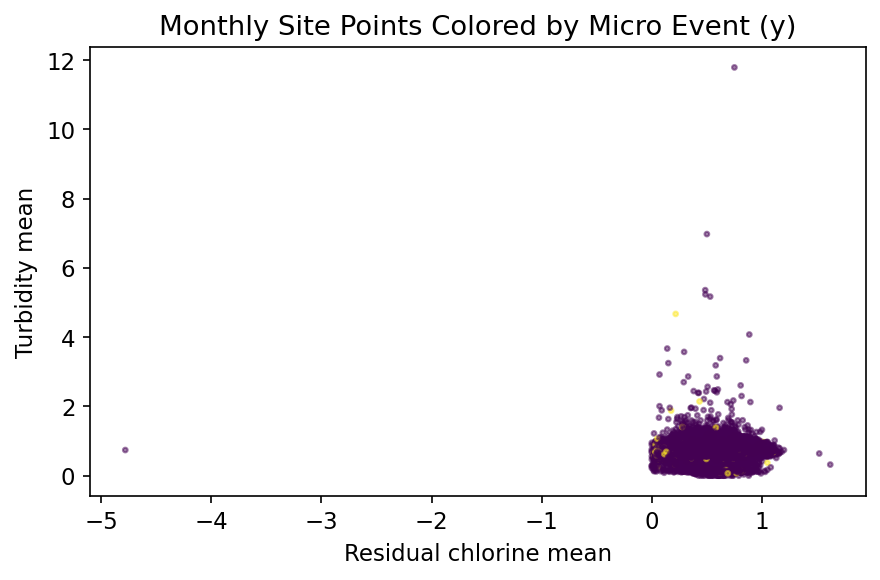

In [197]:
plt.figure(figsize=(6, 4))
plt.scatter(dm["residual_chlorine_mean"], dm["turbidity_mean"],
            s=5, alpha=0.5, c=dm["y"])
plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Monthly Site Points Colored by Micro Event (y)")
plt.tight_layout()
plt.show()

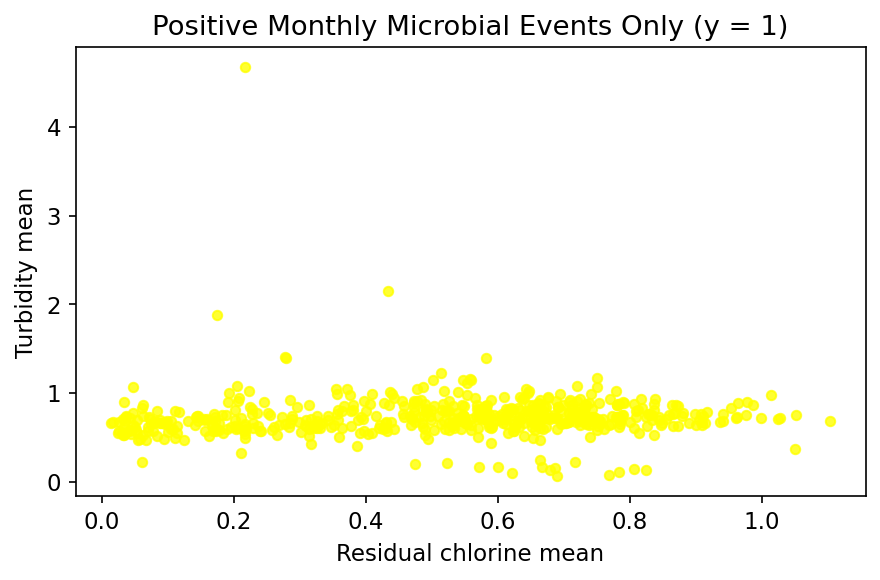

In [198]:
# Filter to only positive microbial events
dm_pos = dm[dm["y"] == 1]

plt.figure(figsize=(6, 4))
plt.scatter(
    dm_pos["residual_chlorine_mean"],
    dm_pos["turbidity_mean"],
    s=20,
    alpha=0.8,
    color="yellow"  # or any color you like
)
plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Positive Monthly Microbial Events Only (y = 1)")
plt.tight_layout()
plt.show()


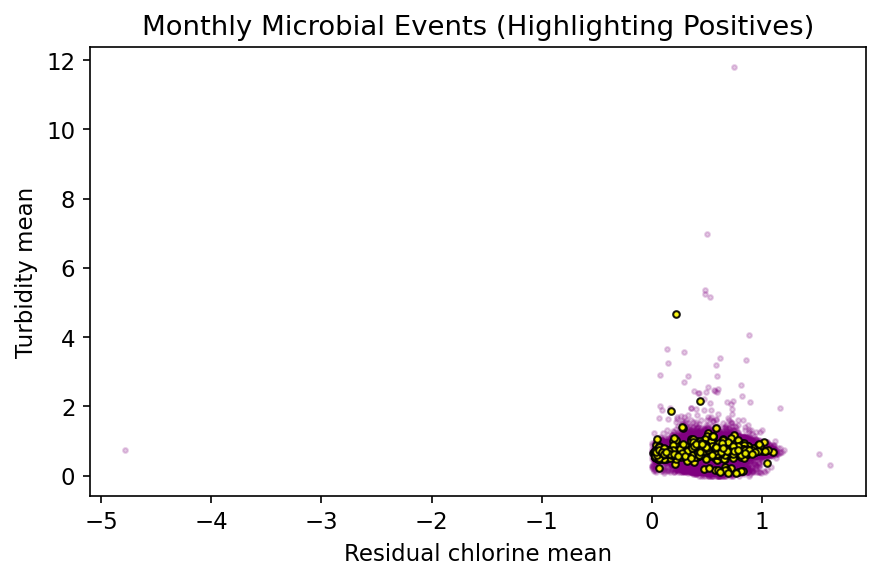

In [199]:
plt.figure(figsize=(6, 4))

# Background: all months
plt.scatter(dm["residual_chlorine_mean"], dm["turbidity_mean"],
            s=5, alpha=0.2, color="purple")

# Foreground: positives only
plt.scatter(dm_pos["residual_chlorine_mean"], dm_pos["turbidity_mean"],
            s=10, alpha=0.9, color="yellow", edgecolors="black")

plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Monthly Microbial Events (Highlighting Positives)")
plt.tight_layout()
plt.show()

####Model Training

In [200]:
EXPORT_DIR = Path("framework1_model1_exports")
EXPORT_DIR.mkdir(exist_ok=True)
print("Export dir:", EXPORT_DIR)

Export dir: framework1_model1_exports


In [201]:
def run_unified_cv(
    df,
    feature_cols,
    label_col="y",
    name="Model",
    n_splits=5,
    random_state=42,
):
    """
    Runs StratifiedKFold cross-validation with:
    - RandomForestClassifier
    - Dummy classifier (majority class baseline)
    and prints ROC AUC and PR AUC.
    """
    # Drop rows where label or all features are missing
    use_df = df.dropna(subset=[label_col] + feature_cols, how="any").copy()

    X = use_df[feature_cols].values
    y = use_df[label_col].astype(int).values

    print(f"\n=== {name} ===")
    print(f"Data shape: {use_df.shape}")
    print(f"Positive rate (prevalence): {y.mean():.6f}")

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced_subsample",
        n_jobs=-1,
        random_state=random_state,
    )

    aucs_rf, prs_rf = [], []
    aucs_dummy, prs_dummy = [], []

    fold = 0
    for train_idx, test_idx in skf.split(X, y):
        fold += 1
        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]

        # Dummy baseline (always predict majority class of train set)
        dummy = DummyClassifier(strategy="most_frequent")
        dummy.fit(X_tr, y_tr)
        y_dummy_proba = dummy.predict_proba(X_te)[:, 1]

        auc_dummy = roc_auc_score(y_te, y_dummy_proba)
        pr_dummy = average_precision_score(y_te, y_dummy_proba)
        aucs_dummy.append(auc_dummy)
        prs_dummy.append(pr_dummy)

        # --- RandomForest model ---
        rf.fit(X_tr, y_tr)
        y_rf_proba = rf.predict_proba(X_te)[:, 1]

        auc_rf = roc_auc_score(y_te, y_rf_proba)
        pr_rf = average_precision_score(y_te, y_rf_proba)
        aucs_rf.append(auc_rf)
        prs_rf.append(pr_rf)

        print(
            f"Fold {fold}: "
            f"RF AUC={auc_rf:.3f}, PR={pr_rf:.5f}  |  "
            f"Dummy AUC={auc_dummy:.3f}, PR={pr_dummy:.5f}"
        )

    print("\n--- Cross-validated performance ---")
    print(f"RF  ROC AUC: {np.mean(aucs_rf):.3f} ± {np.std(aucs_rf):.3f}")
    print(f"RF  PR  AUC: {np.mean(prs_rf):.5f} ± {np.std(prs_rf):.5f}")
    print(f"Dum ROC AUC: {np.mean(aucs_dummy):.3f} ± {np.std(aucs_dummy):.3f}")
    print(f"Dum PR  AUC: {np.mean(prs_dummy):.5f} ± {np.std(prs_dummy):.5f}")

    return {
        "rf_auc_mean": float(np.mean(aucs_rf)),
        "rf_pr_mean": float(np.mean(prs_rf)),
        "dummy_auc_mean": float(np.mean(aucs_dummy)),
        "dummy_pr_mean": float(np.mean(prs_dummy)),
        "prevalence": float(y.mean()),
    }

In [202]:
summary_1a = run_unified_cv(
    df=dm,
    feature_cols=feature_cols_dist,
    label_col="y",
    name="1A – NYC Distribution (microbial events)",
    n_splits=5,
)
print("\nSummary 1A:", summary_1a)


=== 1A – NYC Distribution (microbial events) ===
Data shape: (3280, 20)
Positive rate (prevalence): 0.035366
Fold 1: RF AUC=0.763, PR=0.10776  |  Dummy AUC=0.500, PR=0.03506
Fold 2: RF AUC=0.712, PR=0.07599  |  Dummy AUC=0.500, PR=0.03506
Fold 3: RF AUC=0.735, PR=0.07296  |  Dummy AUC=0.500, PR=0.03506
Fold 4: RF AUC=0.746, PR=0.07475  |  Dummy AUC=0.500, PR=0.03506
Fold 5: RF AUC=0.725, PR=0.06744  |  Dummy AUC=0.500, PR=0.03659

--- Cross-validated performance ---
RF  ROC AUC: 0.736 ± 0.017
RF  PR  AUC: 0.07978 ± 0.01429
Dum ROC AUC: 0.500 ± 0.000
Dum PR  AUC: 0.03537 ± 0.00061

Summary 1A: {'rf_auc_mean': 0.73597400847577, 'rf_pr_mean': 0.07977760965102174, 'dummy_auc_mean': 0.5, 'dummy_pr_mean': 0.03536585365853659, 'prevalence': 0.03536585365853658}


In [203]:
results_table = pd.DataFrame(
    {
        "Metric": [
            "ROC AUC",
            "PR AUC",
            "Positive class prevalence",
        ],
        "Random Forest": [
            summary_1a["rf_auc_mean"],
            summary_1a["rf_pr_mean"],
            summary_1a["prevalence"],
        ],
        "Dummy baseline": [
            summary_1a["dummy_auc_mean"],
            summary_1a["dummy_pr_mean"],
            None,
        ],
    }
)

# Nice rounding for display
results_table_rounded = results_table.copy()
results_table_rounded[["Random Forest", "Dummy baseline"]] = (
    results_table_rounded[["Random Forest", "Dummy baseline"]]
    .applymap(lambda x: None if x is None else round(x, 3))
)

results_table_rounded


/tmp/ipython-input-2070207442.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  .applymap(lambda x: None if x is None else round(x, 3))


,Metric,Random Forest,Dummy baseline
0,ROC AUC,0.736,0.500
1,PR AUC,0.080,0.035
2,Positive class prevalence,0.035,NaN


In [204]:
results_table.to_csv(EXPORT_DIR / "model1_training_results_table.csv", index=False)

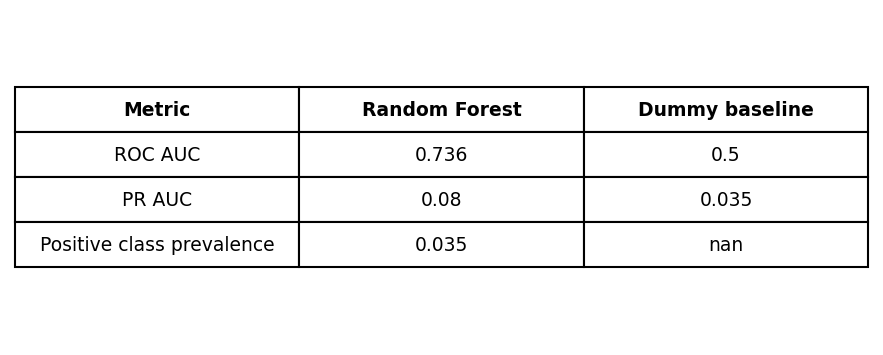

In [205]:
fig, ax = plt.subplots(figsize=(6, 2.5))  # tweak size as you like
ax.axis("off")

# Use the rounded values for nice formatting
table_data = [results_table_rounded.columns.tolist()] + results_table_rounded.values.tolist()

table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)

table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.6)  # make cells bigger / taller

# Optional: bold header row
for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(EXPORT_DIR / "model1_training_results_table.png", dpi=300, bbox_inches="tight")
plt.show()


####Exports

In [206]:
def plot_binary_roc_all_folds_and_full(
    df,
    feature_cols,
    label_col,
    model_name="Framework 1 – Model",
    n_splits=5,
    random_state=42,
):
    use_df = df.dropna(subset=[label_col] + feature_cols, how="any").copy()
    X = use_df[feature_cols].values
    y = use_df[label_col].astype(int).values

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    fold_aucs = []
    color_cycle = plt.cm.tab10(np.linspace(0, 1, n_splits))

    plt.figure(figsize=(7, 6))

    # --- 1. ROC curves for each fold ---
    fold_idx = 0
    for (train_idx, test_idx), color in zip(skf.split(X, y), color_cycle):
        fold_idx += 1

        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]

        rf = RandomForestClassifier(
            n_estimators=300,
            max_depth=None,
            min_samples_leaf=1,
            class_weight="balanced_subsample",
            n_jobs=-1,
            random_state=random_state,
        )
        rf.fit(X_tr, y_tr)
        y_proba_te = rf.predict_proba(X_te)[:, 1]

        fpr, tpr, _ = roc_curve(y_te, y_proba_te)
        auc_fold = auc(fpr, tpr)
        fold_aucs.append(auc_fold)

        plt.plot(
            fpr, tpr,
            color=color,
            linewidth=2,
            label=f"Fold {fold_idx} (AUC = {auc_fold:.3f})"
        )

    # --- 2. Full refit on entire dataset ---
    rf_full = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced_subsample",
        n_jobs=-1,
        random_state=random_state,
    )
    rf_full.fit(X, y)
    y_proba_full = rf_full.predict_proba(X)[:, 1]

    fpr_full, tpr_full, _ = roc_curve(y, y_proba_full)
    auc_full = auc(fpr_full, tpr_full)

    plt.plot(
        fpr_full,
        tpr_full,
        linestyle="--",
        color="black",
        linewidth=2.5,
        label=f"Full Refit (AUC = {auc_full:.3f})"
    )

    # --- Baseline diagonal ---
    plt.plot([0, 1], [0, 1], "k:", label="Random baseline")

    # --- Labels and style ---
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{model_name}\nROC Curves for All Folds + Full Model")
    plt.legend(loc="lower right", fontsize=9)
    plt.tight_layout()
    plt.show()

    # Print fold AUCs
    print("AUC by Fold:", [round(a, 3) for a in fold_aucs])
    print("Full Refit AUC:", round(auc_full, 3))


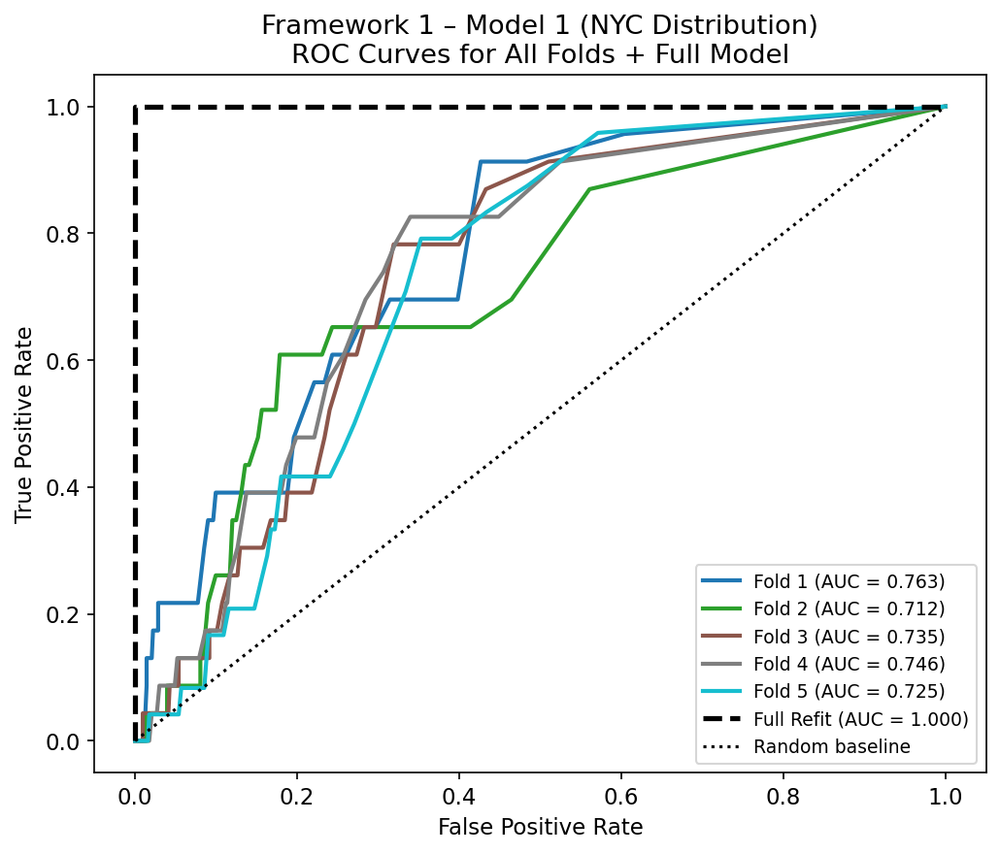

AUC by Fold: [np.float64(0.763), np.float64(0.712), np.float64(0.735), np.float64(0.746), np.float64(0.725)]
Full Refit AUC: 1.0


In [207]:
plot_binary_roc_all_folds_and_full(
    df=dm,
    feature_cols=feature_cols_dist,
    label_col="y",
    model_name="Framework 1 – Model 1 (NYC Distribution)",
)

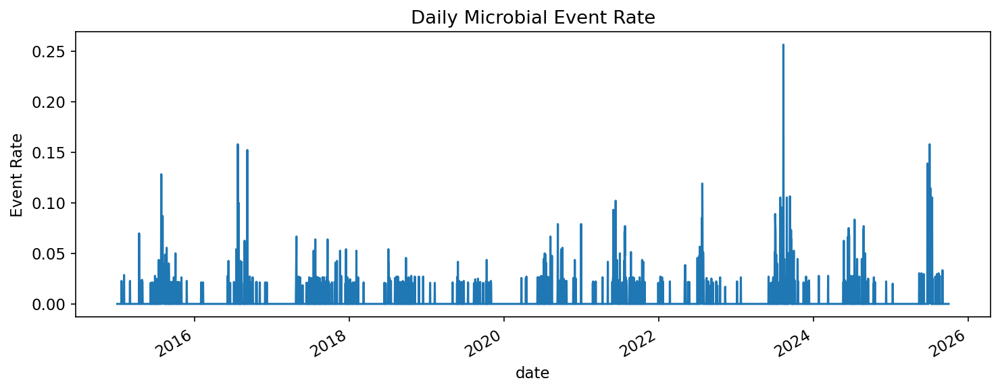

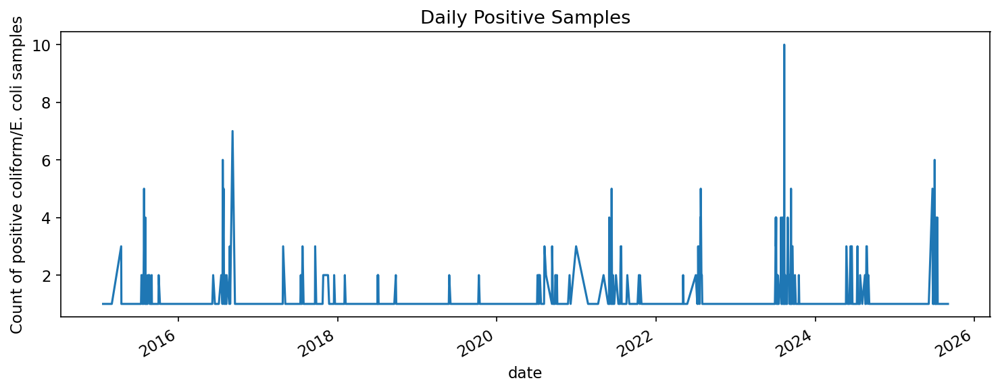

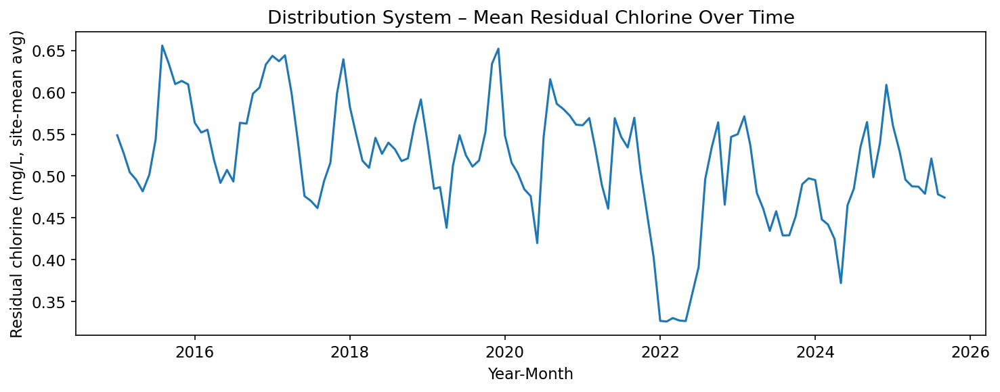

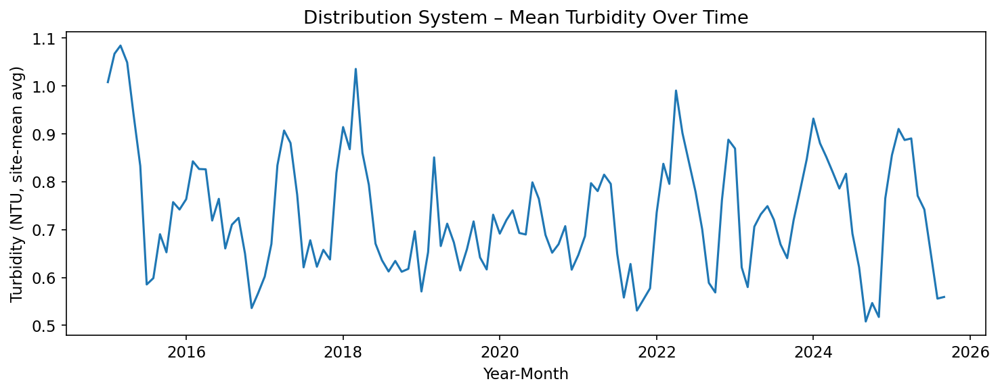

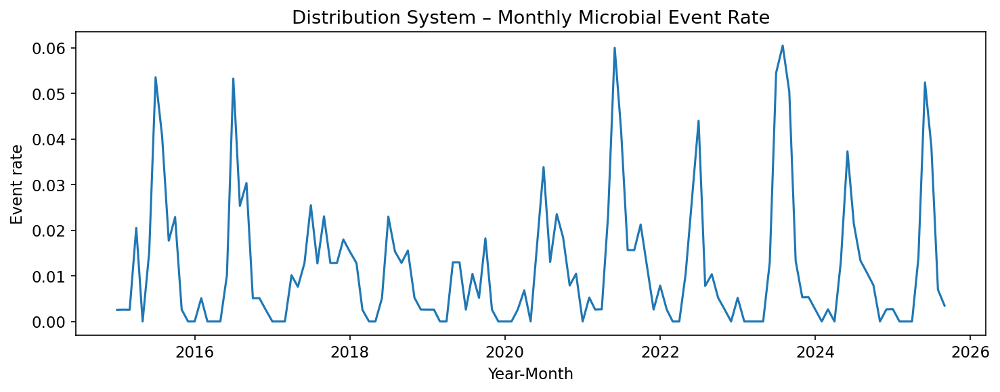

Feature columns found in dm: ['residual_chlorine_mean', 'turbidity_mean', 'fluoride_mean']


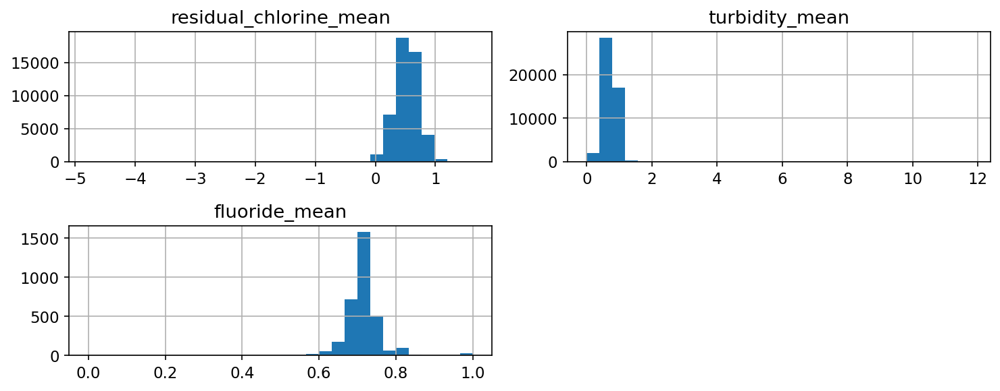

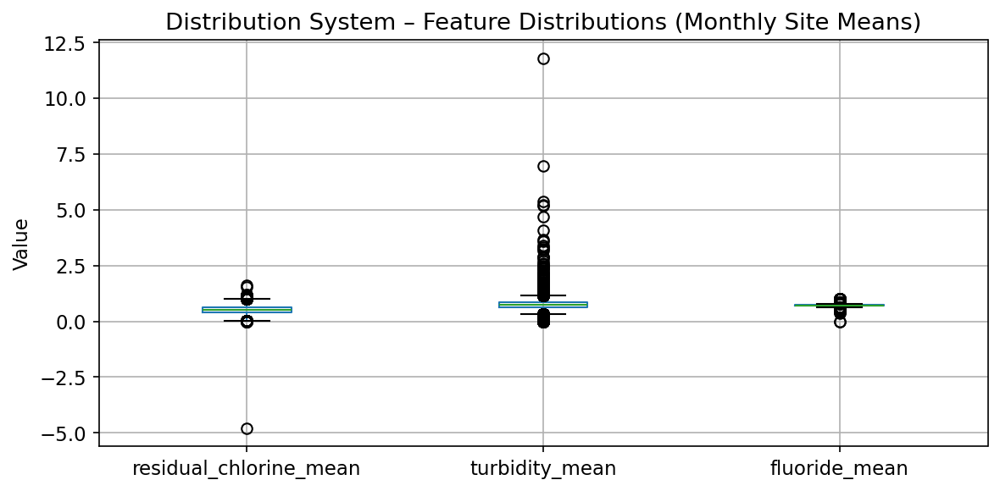

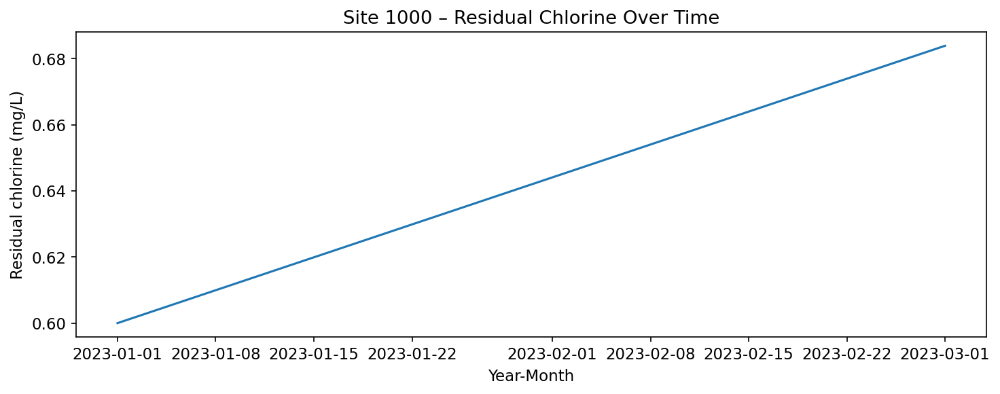

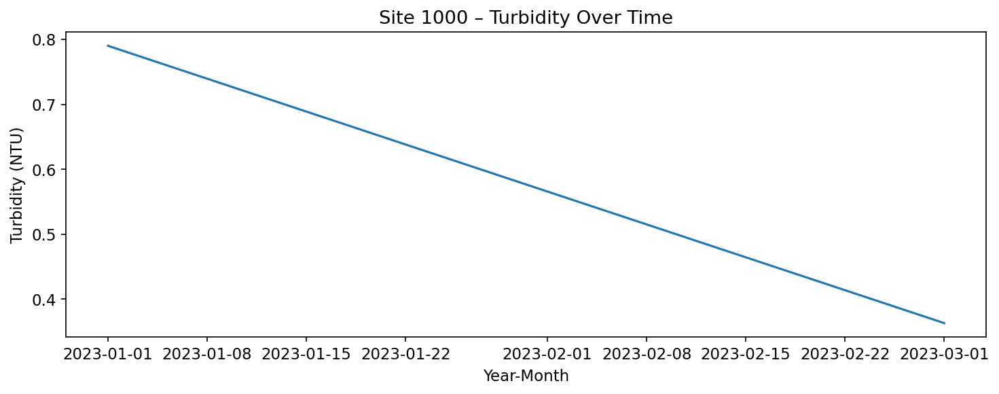

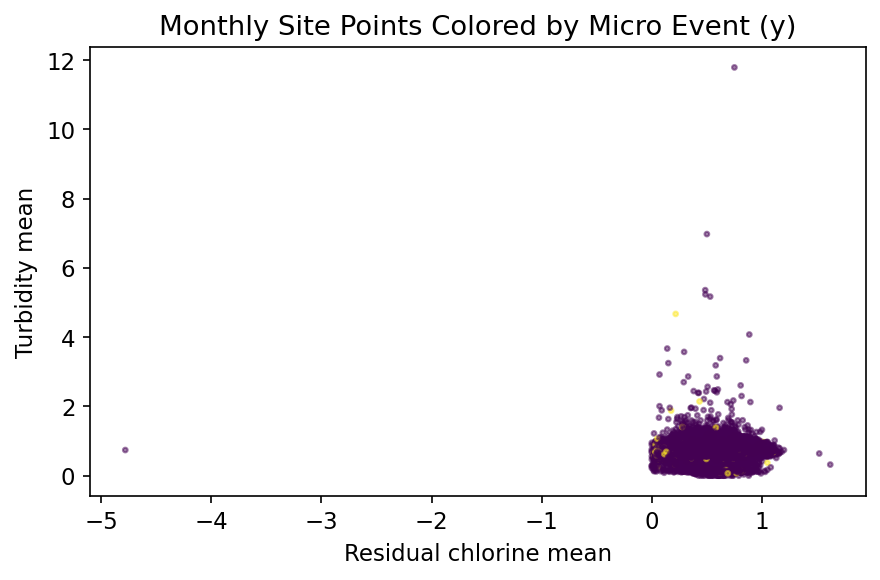

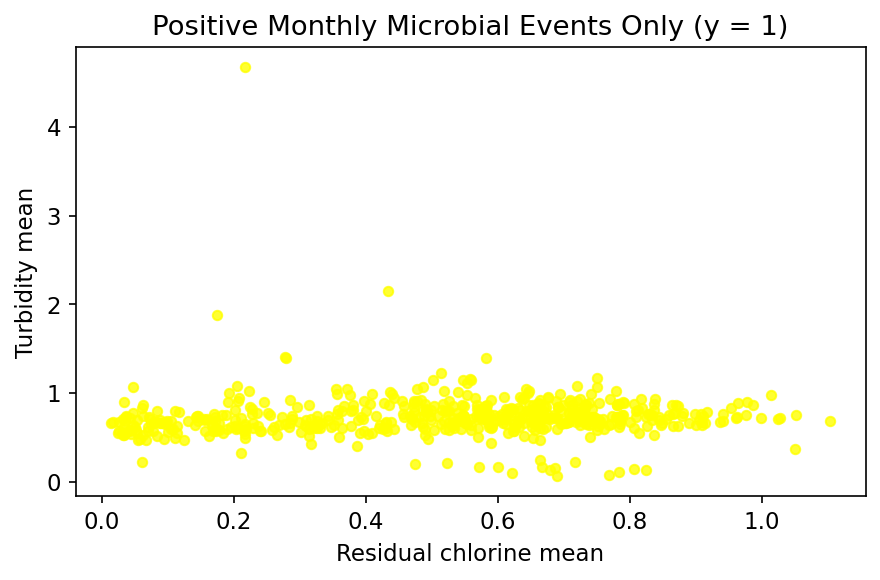

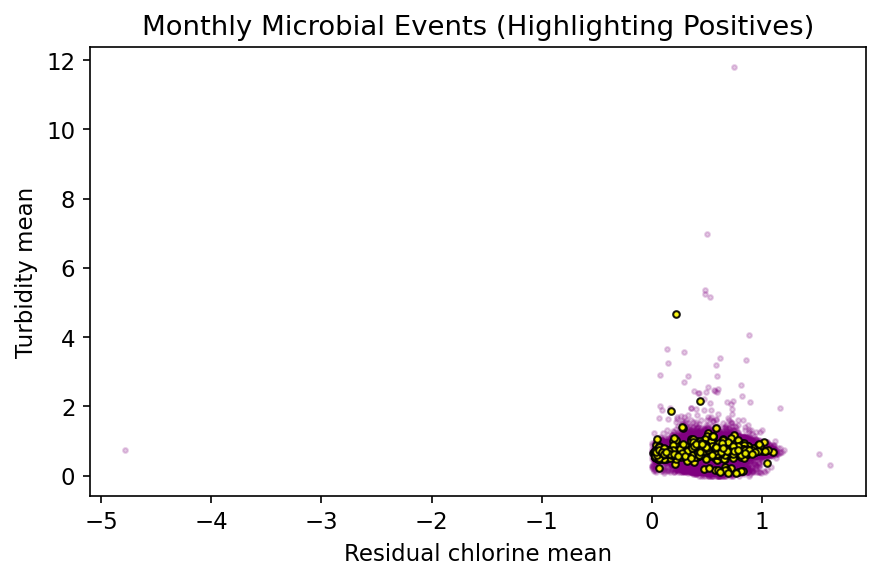

/tmp/ipython-input-3905677739.py:219: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  .applymap(lambda x: None if x is None else round(x, 3))


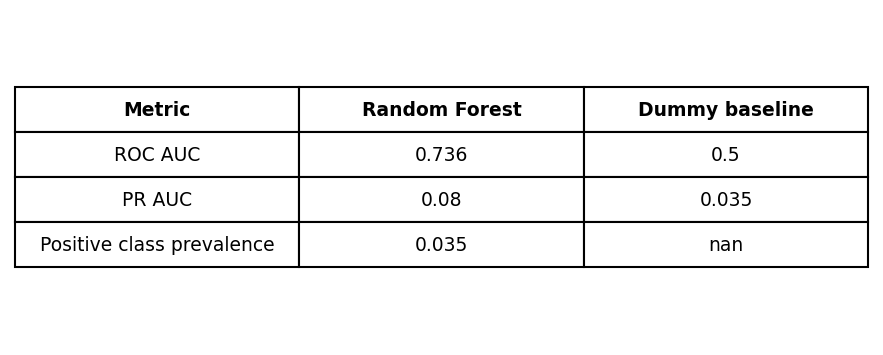

Created zip: framework1_model1_bundle.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [208]:
from google.colab import files


# ===== 3. Recompute key series for plots (in case not in scope) =====

# Daily label
df_dist["micro_event_sample"] = (
    (df_dist["total_coliform"] > 0) |
    (df_dist["e_coli"] > 0)
).astype(int)

daily_event_rate = (
    df_dist
    .groupby("date")["micro_event_sample"]
    .mean()
    .sort_index()
)

daily_pos = (
    df_dist[df_dist["micro_event_sample"] == 1]
    .groupby("date")
    .size()
)

# Monthly aggregates
dm = dist_monthly.copy()
dm["year_month_dt"] = pd.to_datetime(dm["year_month"] + "-01")

monthly_global = (
    dm
    .groupby("year_month_dt")["residual_chlorine_mean"]
    .mean()
    .sort_index()
)

monthly_turb = (
    dm
    .groupby("year_month_dt")["turbidity_mean"]
    .mean()
    .sort_index()
)

monthly_event_rate = (
    dm
    .groupby("year_month_dt")["y"]
    .mean()
    .sort_index()
)

# For scatter plots
dm_pos = dm[dm["y"] == 1].copy()

# Example site
site_id = "1000"
site_df = (
    dm[dm["site"] == site_id]
    .copy()
    .sort_values("year_month_dt")
)


# ===== 4. Save PNGs =====

# 4.1 Daily event rate
plt.figure(figsize=(10, 4))
daily_event_rate.plot()
plt.title("Daily Microbial Event Rate")
plt.ylabel("Event Rate")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "daily_microbial_event_rate.png", dpi=300)
plt.show()

# 4.2 Daily positive samples
plt.figure(figsize=(10, 4))
daily_pos.plot()
plt.title("Daily Positive Samples")
plt.ylabel("Count of positive coliform/E. coli samples")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "daily_positive_samples.png", dpi=300)
plt.show()

# 4.3 Monthly residual chlorine
plt.figure(figsize=(10, 4))
plt.plot(monthly_global.index, monthly_global.values)
plt.xlabel("Year-Month")
plt.ylabel("Residual chlorine (mg/L, site-mean avg)")
plt.title("Distribution System – Mean Residual Chlorine Over Time")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_mean_residual_chlorine.png", dpi=300)
plt.show()

# 4.4 Monthly turbidity
plt.figure(figsize=(10, 4))
plt.plot(monthly_turb.index, monthly_turb.values)
plt.xlabel("Year-Month")
plt.ylabel("Turbidity (NTU, site-mean avg)")
plt.title("Distribution System – Mean Turbidity Over Time")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_mean_turbidity.png", dpi=300)
plt.show()

# 4.5 Monthly microbial event rate
plt.figure(figsize=(10, 4))
plt.plot(monthly_event_rate.index, monthly_event_rate.values)
plt.xlabel("Year-Month")
plt.ylabel("Event rate")
plt.title("Distribution System – Monthly Microbial Event Rate")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_microbial_event_rate.png", dpi=300)
plt.show()

# 4.6 Feature histograms / boxplots (if columns exist)
feature_cols_dist = ["residual_chlorine_mean", "turbidity_mean", "fluoride_mean"]
cols_present = [c for c in feature_cols_dist if c in dm.columns]
print("Feature columns found in dm:", cols_present)

if cols_present:
    dm[cols_present].hist(bins=30, figsize=(10, 4))
    plt.tight_layout()
    plt.savefig(EXPORT_DIR / "feature_histograms.png", dpi=300)
    plt.show()

    plt.figure(figsize=(8, 4))
    dm[cols_present].boxplot()
    plt.ylabel("Value")
    plt.title("Distribution System – Feature Distributions (Monthly Site Means)")
    plt.tight_layout()
    plt.savefig(EXPORT_DIR / "feature_boxplot.png", dpi=300)
    plt.show()

# 4.7 Site-level time series
plt.figure(figsize=(10, 4))
plt.plot(site_df["year_month_dt"], site_df["residual_chlorine_mean"])
plt.xlabel("Year-Month")
plt.ylabel("Residual chlorine (mg/L)")
plt.title(f"Site {site_id} – Residual Chlorine Over Time")
plt.tight_layout()
plt.savefig(EXPORT_DIR / f"site_{site_id}_residual_chlorine.png", dpi=300)
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(site_df["year_month_dt"], site_df["turbidity_mean"])
plt.xlabel("Year-Month")
plt.ylabel("Turbidity (NTU)")
plt.title(f"Site {site_id} – Turbidity Over Time")
plt.tight_layout()
plt.savefig(EXPORT_DIR / f"site_{site_id}_turbidity.png", dpi=300)
plt.show()

# 4.8 Scatter plots
plt.figure(figsize=(6, 4))
plt.scatter(dm["residual_chlorine_mean"], dm["turbidity_mean"],
            s=5, alpha=0.5, c=dm["y"])
plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Monthly Site Points Colored by Micro Event (y)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_all_points_colored_by_y.png", dpi=300)
plt.show()

plt.figure(figsize=(6, 4))
plt.scatter(
    dm_pos["residual_chlorine_mean"],
    dm_pos["turbidity_mean"],
    s=20,
    alpha=0.8,
    color="yellow"
)
plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Positive Monthly Microbial Events Only (y = 1)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_positive_events_only.png", dpi=300)
plt.show()

plt.figure(figsize=(6, 4))
plt.scatter(dm["residual_chlorine_mean"], dm["turbidity_mean"],
            s=5, alpha=0.2, color="purple")
plt.scatter(dm_pos["residual_chlorine_mean"], dm_pos["turbidity_mean"],
            s=10, alpha=0.9, color="yellow", edgecolors="black")
plt.xlabel("Residual chlorine mean")
plt.ylabel("Turbidity mean")
plt.title("Monthly Microbial Events (Highlighting Positives)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_highlight_positives.png", dpi=300)
plt.show()


# ===== 5. Training results: CSV + pretty PNG table + JSON =====

# summary_1a should already exist from run_unified_cv(...)
results_df = pd.DataFrame([summary_1a])
results_df.to_csv(EXPORT_DIR / "model1_training_results_raw.csv", index=False)

# Table-style CSV (for human reading)
results_table = pd.DataFrame(
    {
        "Metric": [
            "ROC AUC",
            "PR AUC",
            "Positive class prevalence",
        ],
        "Random Forest": [
            summary_1a["rf_auc_mean"],
            summary_1a["rf_pr_mean"],
            summary_1a["prevalence"],
        ],
        "Dummy baseline": [
            summary_1a["dummy_auc_mean"],
            summary_1a["dummy_pr_mean"],
            None,
        ],
    }
)

results_table_rounded = results_table.copy()
results_table_rounded[["Random Forest", "Dummy baseline"]] = (
    results_table_rounded[["Random Forest", "Dummy baseline"]]
    .applymap(lambda x: None if x is None else round(x, 3))
)

results_table_rounded.to_csv(
    EXPORT_DIR / "model1_training_results_table.csv",
    index=False
)

# PNG table
fig, ax = plt.subplots(figsize=(6, 2.5))
ax.axis("off")
table_data = [results_table_rounded.columns.tolist()] + results_table_rounded.values.tolist()
table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.6)

for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(EXPORT_DIR / "model1_training_results_table.png", dpi=300, bbox_inches="tight")
plt.show()

# JSON of training summary
with open(EXPORT_DIR / "model1_training_results.json", "w") as f:
    json.dump(summary_1a, f, indent=2)


# ===== 6. Graph data JSON (for recreating plots, not images) =====

graphs_json = {}

graphs_json["daily_event_rate"] = {
    "date": daily_event_rate.index.astype(str).tolist(),
    "event_rate": daily_event_rate.values.tolist(),
    "title": "Daily Microbial Event Rate",
    "y_label": "Event Rate",
}

graphs_json["daily_positive_samples"] = {
    "date": daily_pos.index.astype(str).tolist(),
    "count_positive": daily_pos.values.tolist(),
    "title": "Daily Positive Samples",
    "y_label": "Count of positive coliform/E. coli samples",
}

graphs_json["monthly_residual_chlorine"] = {
    "year_month": monthly_global.index.astype(str).tolist(),
    "residual_chlorine_mean": monthly_global.values.tolist(),
    "title": "Distribution System – Mean Residual Chlorine Over Time",
    "y_label": "Residual chlorine (mg/L, site-mean avg)",
}

graphs_json["monthly_turbidity"] = {
    "year_month": monthly_turb.index.astype(str).tolist(),
    "turbidity_mean": monthly_turb.values.tolist(),
    "title": "Distribution System – Mean Turbidity Over Time",
    "y_label": "Turbidity (NTU)",
}

graphs_json["monthly_micro_event_rate"] = {
    "year_month": monthly_event_rate.index.astype(str).tolist(),
    "event_rate": monthly_event_rate.values.tolist(),
    "title": "Distribution System – Monthly Microbial Event Rate",
    "y_label": "Event rate",
}

with open(EXPORT_DIR / "framework1_model1_graph_data.json", "w") as f:
    json.dump(graphs_json, f, indent=2)


# ===== 7. Create ZIP (⚠️ don't shadow `files`) =====

zip_path = "framework1_model1_bundle.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    for root, dirs, filenames in os.walk(EXPORT_DIR):  # <- use `filenames`, not `files`
        for fname in filenames:
            full_path = Path(root) / fname
            # store paths inside the zip relative to EXPORT_DIR
            rel_path = full_path.relative_to(EXPORT_DIR)
            zf.write(full_path, arcname=rel_path)

print("Created zip:", zip_path)

# ===== 8. Download ZIP (now `files` is the google.colab module) =====
files.download(zip_path)

###Model 2

####Load Dataset

In [98]:
#WQP
wqp_phys_path  = DATA_ROOT / "WQP_NY_Surface_PhysChem" / "WQP_NY_Surface_PhysChem.csv"
wqp_bio_path   = DATA_ROOT / "WQP_NY_Surface_Bio"      / "WQP_NY_Surface_Bio.csv"
wqp_sites_path = DATA_ROOT / "WQP_NY_Surface_Sites"    / "WQP_NY_Surface_Sites.csv"

wqp_phys  = pd.read_csv(wqp_phys_path,  low_memory=False)
wqp_bio   = pd.read_csv(wqp_bio_path,   low_memory=False)
wqp_sites = pd.read_csv(wqp_sites_path, low_memory=False)

SITE_COL = "MonitoringLocationIdentifier"   # typical WQP column
CHAR_COL = "CharacteristicName"
VALUE_COL = "ResultMeasureValue"
DATE_COL = "ActivityStartDate"
for df in [wqp_phys, wqp_bio]:
    df["sample_date"] = pd.to_datetime(df[DATE_COL])
    df["month"] = df["sample_date"].dt.to_period("M")

site_meta_cols = [
    SITE_COL,
    "MonitoringLocationName",
    "MonitoringLocationTypeName",
]
site_meta_cols = [c for c in site_meta_cols if c in wqp_sites.columns]

wqp_sites_small = (
    wqp_sites[site_meta_cols]
    .drop_duplicates(subset=[SITE_COL])
    .rename(columns={
        "MonitoringLocationName": "site_name",
        "MonitoringLocationTypeName": "site_type",
    })
)

print("WQP site metadata shape:", wqp_sites_small.shape)
wqp_sites_small.head()


WQP site metadata shape: (8485, 3)


,MonitoringLocationIdentifier,site_name,site_type
0,USGS-01376790,HACKENSACK R DIV AT WEST NYACK NY,Facility: Diversion
1,USGS-01299000,BLIND BROOK NEAR PURCHASE NY,Stream
2,USGS-01299200,UNNAMED TRIBUTARY AT LINCOLN AVE NEAR PURCHASE NY,Stream
3,USGS-01301500,HUTCHINSON RIVER AT PELHAM NY,Stream
4,USGS-01301900,KENSICO RESERVOIR AT VALHALLA NY,"Lake, Reservoir, Impoundment"


In [99]:
print("WQP Physical Chemistry shape:", wqp_phys.shape)
print("WQP Biological shape:", wqp_bio.shape)
print("WQP Sites shape:", wqp_sites.shape)

WQP Physical Chemistry shape: (3534036, 83)
WQP Biological shape: (3534036, 158)
WQP Sites shape: (8485, 37)


In [100]:
PHYS_VARS = {
    "temp_C":          ["Temperature, water", "Water temperature"],
    "turbidity_ntu":   ["Turbidity"],
    "ph":              ["pH"],
    "cond_uscm":       ["Specific conductance", "Specific conductance, unfiltered"],
    "nitrate_mgL":     ["Nitrate", "Nitrate-nitrogen", "Nitrite plus nitrate"],
    "phosphorus_mgL":  ["Phosphorus", "Orthophosphate", "Phosphate"],
}

BIO_VARS = {
    "fecal_coliform_cfu": ["Fecal coliform", "Fecal coliform, water"],
    "enterococcus_cfu":   ["Enterococcus", "Enterococci", "Enterococci (fecal)"],
}

def _invert_map(char_map):
    inv = {}
    for canonical, names in char_map.items():
        for n in names:
            inv[n] = canonical
    return inv

PHYS_INV = _invert_map(PHYS_VARS)
BIO_INV  = _invert_map(BIO_VARS)

# --- Monthly physchem: site × month means ---

def build_monthly_physchem(df, site_col=SITE_COL, char_col=CHAR_COL, value_col=VALUE_COL):
    mask = df[char_col].isin(PHYS_INV.keys())
    sub = df.loc[mask, [site_col, "month", char_col, value_col]].copy()
    sub[value_col] = pd.to_numeric(sub[value_col], errors="coerce")

    sub["var"] = sub[char_col].map(PHYS_INV)

    agg = (
        sub.groupby([site_col, "month", "var"])[value_col]
        .mean()
        .reset_index()
    )

    # Pivot means to wide format
    wide = agg.pivot(index=[site_col, "month"], columns="var", values=value_col)
    wide.columns = [f"{c}_mean" for c in wide.columns]
    return wide.reset_index()

wqp_phys_monthly = build_monthly_physchem(wqp_phys)
print("WQP physchem monthly shape:", wqp_phys_monthly.shape)
wqp_phys_monthly.head()

WQP physchem monthly shape: (47407, 8)


,MonitoringLocationIdentifier,month,cond_uscm_mean,nitrate_mgL_mean,ph_mean,phosphorus_mgL_mean,temp_C_mean,turbidity_ntu_mean
0,1083919_WQX-BR-GS-1,2017-06,NaN,NaN,8.09,NaN,27.0,NaN
1,1083919_WQX-BR-GS-1,2017-10,NaN,NaN,7.13,NaN,12.8,NaN
2,1083919_WQX-BxR-009,2017-05,NaN,NaN,5.50,NaN,26.0,NaN
3,1083919_WQX-SWS-01,2017-05,NaN,NaN,5.00,NaN,25.0,NaN
4,1083919_WQX-SWS-02,2017-06,NaN,NaN,8.00,NaN,24.0,NaN


In [101]:
def build_monthly_bio_labels(df,
                             site_col=SITE_COL,
                             char_col=CHAR_COL,
                             value_col=VALUE_COL,
                             fecal_thresh=200.0,   # CFU/100 mL
                             ent_thresh=104.0):   # CFU/100 mL

    """
    Build a site×month table with fecal_coliform_cfu, enterococcus_cfu and binary event labels.
    """
    mask = df[char_col].isin(BIO_INV.keys())
    sub = df.loc[mask, [site_col, "month", char_col, value_col]].copy()
    sub[value_col] = pd.to_numeric(sub[value_col], errors="coerce")

    sub["var"] = sub[char_col].map(BIO_INV)


    # Use monthly max per site×month as contamination indicator
    agg = (
        sub.groupby([site_col, "month", "var"])[value_col]
        .max()
        .reset_index()
    )

    pivot = agg.pivot(index=[site_col, "month"], columns="var", values=value_col)

    pivot.columns.name = None

    target_cols = ["fecal_coliform_cfu", "enterococcus_cfu"]
    pivot = pivot.reindex(columns=target_cols, fill_value=np.nan)

    pivot = pivot.reset_index()

    pivot["fecal_event"] = (pivot["fecal_coliform_cfu"] >= fecal_thresh).astype(int)
    pivot["ent_event"]   = (pivot["enterococcus_cfu"]   >= ent_thresh).astype(int)

    pivot["y_surface"] = ((pivot["fecal_event"] == 1) | (pivot["ent_event"] == 1)).astype(int)

    return pivot

wqp_bio_monthly = build_monthly_bio_labels(wqp_bio)
print("WQP bio monthly shape:", wqp_bio_monthly.shape)
wqp_bio_monthly.head()


WQP bio monthly shape: (28468, 7)


,MonitoringLocationIdentifier,month,fecal_coliform_cfu,enterococcus_cfu,fecal_event,ent_event,y_surface
0,1083919_WQX-26.1W,2017-06,NaN,63.0,0,0,0
1,1083919_WQX-26.1W,2017-07,NaN,199.0,0,1,1
2,1083919_WQX-26.1W,2017-08,NaN,609.0,0,1,1
3,1083919_WQX-26.1W,2017-09,NaN,75.0,0,0,0
4,1083919_WQX-26.1W,2017-10,NaN,209.0,0,1,1


In [102]:
#Merge PhysChem and Bio on SitexMonth
wqp_surface_monthly = (
    wqp_bio_monthly
    .merge(
        wqp_phys_monthly,
        on=[SITE_COL, "month"],
        how="left"
    )
)

print("WQP surface (bio + physchem) monthly:", wqp_surface_monthly.shape)
wqp_surface_monthly.head()

WQP surface (bio + physchem) monthly: (28468, 13)


,MonitoringLocationIdentifier,month,fecal_coliform_cfu,enterococcus_cfu,fecal_event,ent_event,y_surface,cond_uscm_mean,nitrate_mgL_mean,ph_mean,phosphorus_mgL_mean,temp_C_mean,turbidity_ntu_mean
0,1083919_WQX-26.1W,2017-06,NaN,63.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,1083919_WQX-26.1W,2017-07,NaN,199.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN
2,1083919_WQX-26.1W,2017-08,NaN,609.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN
3,1083919_WQX-26.1W,2017-09,NaN,75.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,1083919_WQX-26.1W,2017-10,NaN,209.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
#Add Site Metadata
wqp_surface_monthly = (
    wqp_surface_monthly
    .merge(
        wqp_sites_small,
        on=SITE_COL,
        how="left"
    )
)

# Convert Period("YYYY-MM") → Timestamp (month start)
wqp_surface_monthly["month_start"] = wqp_surface_monthly["month"].dt.to_timestamp()

# For clarity, add a domain tag
wqp_surface_monthly["domain"] = "WQP"

print("WQP surface monthly + site meta:", wqp_surface_monthly.shape)
wqp_surface_monthly.head()

WQP surface monthly + site meta: (28468, 17)


,MonitoringLocationIdentifier,month,fecal_coliform_cfu,enterococcus_cfu,fecal_event,ent_event,y_surface,cond_uscm_mean,nitrate_mgL_mean,ph_mean,phosphorus_mgL_mean,temp_C_mean,turbidity_ntu_mean,site_name,site_type,month_start,domain
0,1083919_WQX-26.1W,2017-06,NaN,63.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Piermont Pier,River/Stream,2017-06-01,WQP
1,1083919_WQX-26.1W,2017-07,NaN,199.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,Piermont Pier,River/Stream,2017-07-01,WQP
2,1083919_WQX-26.1W,2017-08,NaN,609.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,Piermont Pier,River/Stream,2017-08-01,WQP
3,1083919_WQX-26.1W,2017-09,NaN,75.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Piermont Pier,River/Stream,2017-09-01,WQP
4,1083919_WQX-26.1W,2017-10,NaN,209.0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,Piermont Pier,River/Stream,2017-10-01,WQP


In [104]:
#Join NYC_DEP_Harbor_WQ
harbor_path = DATA_ROOT / "NYC_DEP_Harbor_WQ" / "Harbor_Water_Quality.csv"
harbor_raw = pd.read_csv(harbor_path, low_memory=False)
print(harbor_raw.shape)
harbor_raw.head()

(95933, 95)


,sampling_location,sample_date,sample_time,weather_condition_dry_or_wet,top_sample_temperature_c,bottom_sample_temperature_c,site_actual_depth_ft,top_sample_depth_ft,bottom_sample_depth_ft,top_salinity_psu,...,top_bottom_coliform_cells_100_ml,top_pcb_plate_count_thous_ml,bottom_pcb_plate_count_thous_ml,top_total_organic_carbon_mg_l,duplicate_sample,top_sample_depth_ysi_ft,top_coliform_log_no_ml,bottom_coliform_log_no_ml,top_bacteria_per_c_c_1909,bottom_bacteria_per_c_c_1909
0,BB2,2006-08-09T00:00:00.000,1:53 PM,D,26.47,26.36,11,5,11,24.46,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BB2,2006-09-12T00:00:00.000,1:10 PM,D,21.88,21.43,16,5,15,25.67,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BB4,2006-08-09T00:00:00.000,2:02 PM,D,27.37,25.76,17,3,15,24.38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BB4,2006-09-12T00:00:00.000,1:17 PM,D,21.51,20.96,23,6,21,25.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,E10,2006-10-23T00:00:00.000,10:46 AM,D,16.01,16.14,98,4,94,25.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
harbor_raw.columns.tolist()

['sampling_location',
 'sample_date',
 'sample_time',
 'weather_condition_dry_or_wet',
 'top_sample_temperature_c',
 'bottom_sample_temperature_c',
 'site_actual_depth_ft',
 'top_sample_depth_ft',
 'bottom_sample_depth_ft',
 'top_salinity_psu',
 'bottom_salinity_psu',
 'top_conductivity_s_m',
 'bottom_conductivity_s_m',
 'ctd_conductivity_temperature_depth_profiler_top_dissolved_oxygen_mg_l',
 'ctd_conductivity_temperature_depth_profiler_bottom_dissolved_oxygen_mg_l',
 'percentage_o2_saturation_top_sample',
 'percentage_o2_saturation_bottom_sample',
 'top_sigma_t_kg_m3',
 'bottom_sigma_t_kg_m3',
 'oxidation_reduction_potential_mv_top_sample',
 'oxidation_reduction_potential_mv_bottom_sample',
 'current_speed_knot',
 'current_direction_current_direction',
 'wind_speed_mph',
 'wind_direction_wind_direction',
 'sea_state',
 'winkler_method_top_dissolved_oxygen_mg_l',
 'winkler_method_bottom_dissolved_oxygen_mg_l',
 'secchi_depth_ft',
 'top_ph',
 'bottom_ph',
 'top_fecal_coliform_bacteria_

In [106]:
HARBOR_COLS = {
    # core IDs
    "site_id":     "sampling_location",
    "sample_date": "sample_date",

    # site meta
    "lat":       "lat",
    "lon":       "long",
    "site_type": "type",

    # physchem (surface / top)
    "temp_C":           "top_sample_temperature_c",
    "turbidity_ntu":    "top_turbidity_nephelometric_turbidity_units",
    "ph":               "top_ph",
    "cond_s_m":         "top_conductivity_s_m",
    "nitrate_mgL":      "top_nitrate_nitrite_mg_l",
    "phosphorus_mgL":   "top_ortho_phosphorus_mg_l",

    # microbiology
    "fecal_coliform_cfu": "top_fecal_coliform_bacteria_cells_100ml",
    "enterococcus_cfu":   "top_enterococci_bacteria_cells_100ml",

    #later
    # "total_coliform_cfu":   "top_total_coliform_cells_100_ml",
    # "combo_coliform_cfu":   "top_bottom_coliform_cells_100_ml",
}


In [107]:
def build_harbor_monthly(df,
                         colmap,
                         fecal_thresh=200.0,
                         ent_thresh=104.0):
    """
    Build a Harbor monthly table with the same feature + label names
    as the WQP monthly table.
    """

    rename_map = {v: k for k, v in colmap.items() if v in df.columns}
    df = df.rename(columns=rename_map)

    # Derive conductivity in µS/cm if we have S/m
    if "cond_s_m" in df.columns and "cond_uscm" not in df.columns:
        # 1 S/m = 10,000 µS/cm
        df["cond_uscm"] = pd.to_numeric(df["cond_s_m"], errors="coerce") * 1.0e4

    # Parse date + month
    df["sample_date"] = pd.to_datetime(df["sample_date"])
    df["month"] = df["sample_date"].dt.to_period("M")

    # Physchem monthly means
    phys_cols = ["temp_C", "turbidity_ntu", "ph", "cond_uscm",
                 "nitrate_mgL", "phosphorus_mgL"]
    phys_cols_present = [c for c in phys_cols if c in df.columns]

    if phys_cols_present:
        phys = df[["site_id", "month"] + phys_cols_present].copy()
        phys[phys_cols_present] = phys[phys_cols_present].apply(
            pd.to_numeric, errors="coerce"
        )

        phys_monthly = (
            phys
            .groupby(["site_id", "month"])[phys_cols_present]
            .mean()
            .add_suffix("_mean")
            .reset_index()
        )
    else:
        phys_monthly = (
            df[["site_id", "month"]]
            .drop_duplicates()
            .copy()
        )

    #Bio monthly max
    bio_cols = []
    if "fecal_coliform_cfu" in df.columns:
        bio_cols.append("fecal_coliform_cfu")
    if "enterococcus_cfu" in df.columns:
        bio_cols.append("enterococcus_cfu")

    if bio_cols:
        bio = df[["site_id", "month"] + bio_cols].copy()
        bio[bio_cols] = bio[bio_cols].apply(pd.to_numeric, errors="coerce")

        bio_monthly = (
            bio
            .groupby(["site_id", "month"])[bio_cols]
            .max()
            .reset_index()
        )
    else:
        bio_monthly = (
            df[["site_id", "month"]]
            .drop_duplicates()
            .copy()
        )

    # Ensure both bio columns exist
    if "fecal_coliform_cfu" not in bio_monthly.columns:
        bio_monthly["fecal_coliform_cfu"] = np.nan
    if "enterococcus_cfu" not in bio_monthly.columns:
        bio_monthly["enterococcus_cfu"] = np.nan

    bio_monthly["fecal_event"] = (bio_monthly["fecal_coliform_cfu"] >= fecal_thresh).astype(int)
    bio_monthly["ent_event"]   = (bio_monthly["enterococcus_cfu"]   >= ent_thresh).astype(int)
    bio_monthly["y_surface"]   = ((bio_monthly["fecal_event"] == 1) |
                                  (bio_monthly["ent_event"] == 1)).astype(int)

    # Merge physchem + bio
    harbor_monthly = bio_monthly.merge(
        phys_monthly,
        on=["site_id", "month"],
        how="left"
    )

    # Site metadata
    meta_cols = [c for c in ["site_id", "site_name", "site_type"]
                 if c in df.columns]

    if meta_cols:
        meta = df[meta_cols].drop_duplicates(subset=["site_id"])
        harbor_monthly = harbor_monthly.merge(
            meta,
            on="site_id",
            how="left"
        )
    else:
        harbor_monthly["site_name"] = harbor_monthly["site_id"]

    harbor_monthly["month_start"] = harbor_monthly["month"].dt.to_timestamp()
    harbor_monthly["domain"] = "Harbor"

    return harbor_monthly

harbor_surface_monthly = build_harbor_monthly(harbor_raw, HARBOR_COLS)
print("Harbor surface monthly:", harbor_surface_monthly.shape)
harbor_surface_monthly.head()

Harbor surface monthly: (39676, 16)


,site_id,month,fecal_coliform_cfu,enterococcus_cfu,fecal_event,ent_event,y_surface,temp_C_mean,turbidity_ntu_mean,ph_mean,cond_uscm_mean,nitrate_mgL_mean,phosphorus_mgL_mean,site_type,month_start,domain
0,AC1,2009-04,70.0,30.0,0,0,0,NaN,13.600,7.880000,NaN,0.268000,0.037000,Permanent,2009-04-01,Harbor
1,AC1,2009-05,4000.0,580.0,1,1,1,NaN,114.900,7.345000,NaN,2.270000,0.077500,Permanent,2009-05-01,Harbor
2,AC1,2009-06,29000.0,320.0,1,1,1,NaN,30.300,7.198333,NaN,1.029667,0.084333,Permanent,2009-06-01,Harbor
3,AC1,2009-07,8000.0,84.0,1,0,1,NaN,19.325,7.252500,NaN,1.008750,0.119500,Permanent,2009-07-01,Harbor
4,AC1,2009-08,8950.0,450.0,1,1,1,NaN,29.140,7.066000,NaN,0.946800,0.186800,Permanent,2009-08-01,Harbor


In [108]:
#Join WQP and Harbor
wqp_for_union = wqp_surface_monthly.rename(columns={SITE_COL: "site_id"})

common_cols = sorted(
    set(wqp_for_union.columns) & set(harbor_surface_monthly.columns)
)

surface_unified_monthly = pd.concat(
    [
        wqp_for_union[common_cols].assign(domain="WQP"),
        harbor_surface_monthly[common_cols].assign(domain="Harbor"),
    ],
    ignore_index=True
)

print("Unified surface (WQP + Harbor) monthly:", surface_unified_monthly.shape)
surface_unified_monthly.head()


Unified surface (WQP + Harbor) monthly: (68144, 16)


,cond_uscm_mean,domain,ent_event,enterococcus_cfu,fecal_coliform_cfu,fecal_event,month,month_start,nitrate_mgL_mean,ph_mean,phosphorus_mgL_mean,site_id,site_type,temp_C_mean,turbidity_ntu_mean,y_surface
0,NaN,WQP,0,63.0,NaN,0,2017-06,2017-06-01,NaN,NaN,NaN,1083919_WQX-26.1W,River/Stream,NaN,NaN,0
1,NaN,WQP,1,199.0,NaN,0,2017-07,2017-07-01,NaN,NaN,NaN,1083919_WQX-26.1W,River/Stream,NaN,NaN,1
2,NaN,WQP,1,609.0,NaN,0,2017-08,2017-08-01,NaN,NaN,NaN,1083919_WQX-26.1W,River/Stream,NaN,NaN,1
3,NaN,WQP,0,75.0,NaN,0,2017-09,2017-09-01,NaN,NaN,NaN,1083919_WQX-26.1W,River/Stream,NaN,NaN,0
4,NaN,WQP,1,209.0,NaN,0,2017-10,2017-10-01,NaN,NaN,NaN,1083919_WQX-26.1W,River/Stream,NaN,NaN,1


####Feature Engineering

In [109]:
#Drop all-NaN feature rows
dm = surface_unified_monthly.copy()

# Useful numeric features (some may be all-NaN for WQP rows)
feature_cols = [
    "temp_C_mean",
    "turbidity_ntu_mean",
    "ph_mean",
    "cond_uscm_mean",
    "nitrate_mgL_mean",
    "phosphorus_mgL_mean",
]

# Remove rows where all physchem features are NaN
dm = dm.dropna(subset=feature_cols, how="all")
print(dm.shape)
dm.head()

(38588, 16)


,cond_uscm_mean,domain,ent_event,enterococcus_cfu,fecal_coliform_cfu,fecal_event,month,month_start,nitrate_mgL_mean,ph_mean,phosphorus_mgL_mean,site_id,site_type,temp_C_mean,turbidity_ntu_mean,y_surface
18,NaN,WQP,1,473.0,NaN,0,2017-06,2017-06-01,NaN,8.09,NaN,1083919_WQX-BR-GS-1,River/Stream,27.0,NaN,1
22,NaN,WQP,1,504.0,NaN,0,2017-10,2017-10-01,NaN,7.13,NaN,1083919_WQX-BR-GS-1,River/Stream,12.8,NaN,1
304,NaN,WQP,0,74.0,NaN,0,2017-06,2017-06-01,NaN,8.00,NaN,1083919_WQX-SWS-02,River/Stream,24.0,NaN,0
317,NaN,WQP,0,96.0,NaN,0,2017-06,2017-06-01,NaN,NaN,NaN,1083919_WQX-SWS-14N,River/Stream,20.0,NaN,0
325,NaN,WQP,0,51.0,NaN,0,2017-06,2017-06-01,NaN,8.00,NaN,1083919_WQX-SWS-21,River/Stream,23.0,NaN,0


####Model Architecture

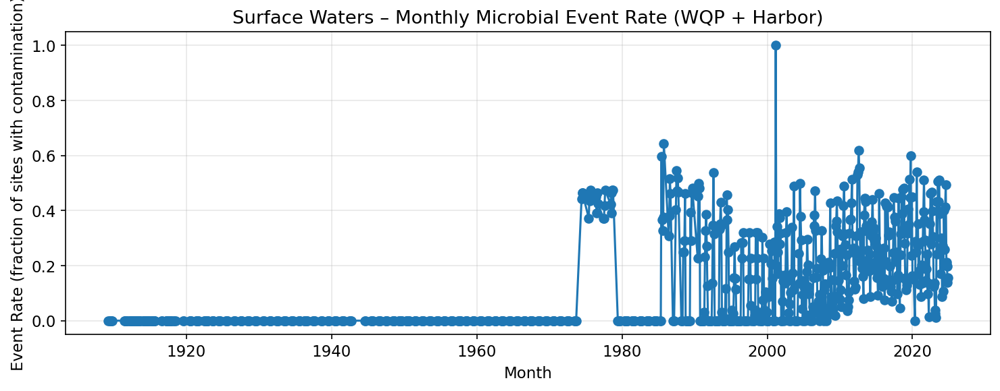

In [110]:
#monthly event rate (global)
monthly = (
    dm.groupby("month_start")["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

plt.figure(figsize=(10,4))
plt.plot(monthly["month_start"], monthly["event_rate"], marker="o")
plt.title("Surface Waters – Monthly Microbial Event Rate (WQP + Harbor)")
plt.xlabel("Month")
plt.ylabel("Event Rate (fraction of sites with contamination)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [111]:
dm_1970 = dm[dm["month_start"] >= pd.Timestamp("1970-01-01")].copy()
print(dm_1970["month_start"].min(), dm_1970["month_start"].max())

1970-06-01 00:00:00 2024-12-01 00:00:00


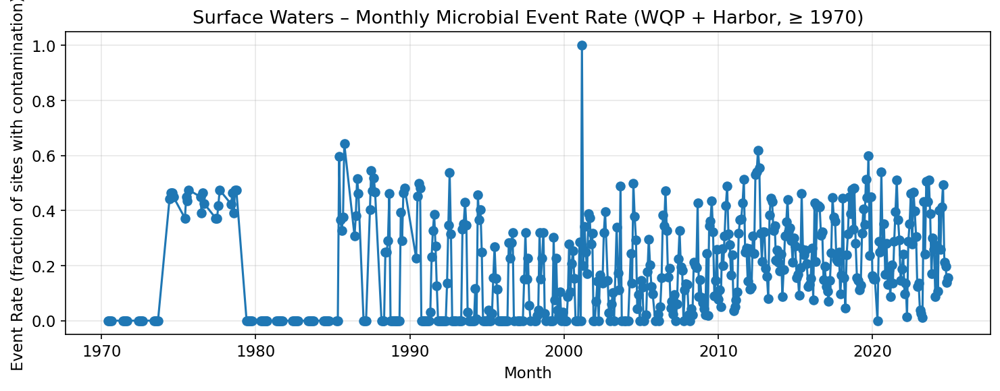

In [112]:
monthly_1970 = (
    dm_1970
    .groupby("month_start")["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

plt.figure(figsize=(10, 4))
plt.plot(monthly_1970["month_start"], monthly_1970["event_rate"], marker="o")
plt.title("Surface Waters – Monthly Microbial Event Rate (WQP + Harbor, ≥ 1970)")
plt.xlabel("Month")
plt.ylabel("Event Rate (fraction of sites with contamination)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

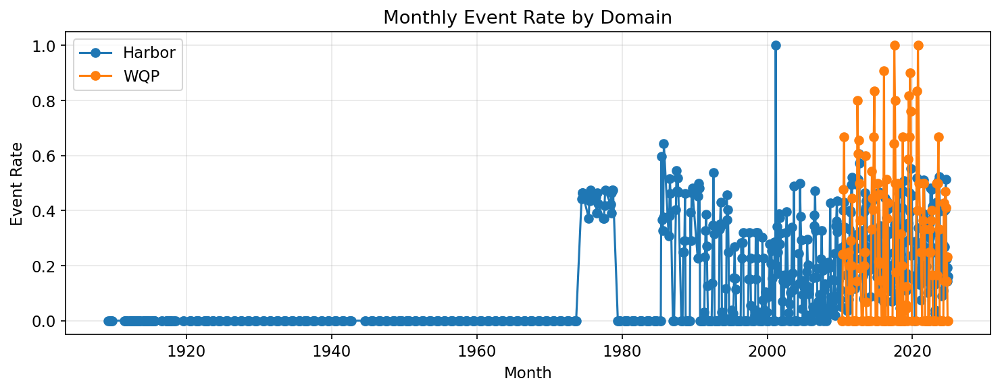

In [113]:
#Monthly event rate - WQP vs Harbor
monthly_dom = (
    dm.groupby(["month_start", "domain"])["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

plt.figure(figsize=(10,4))
for dom, sub in monthly_dom.groupby("domain"):
    plt.plot(sub["month_start"], sub["event_rate"], marker="o", label=dom)

plt.title("Monthly Event Rate by Domain")
plt.xlabel("Month")
plt.ylabel("Event Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

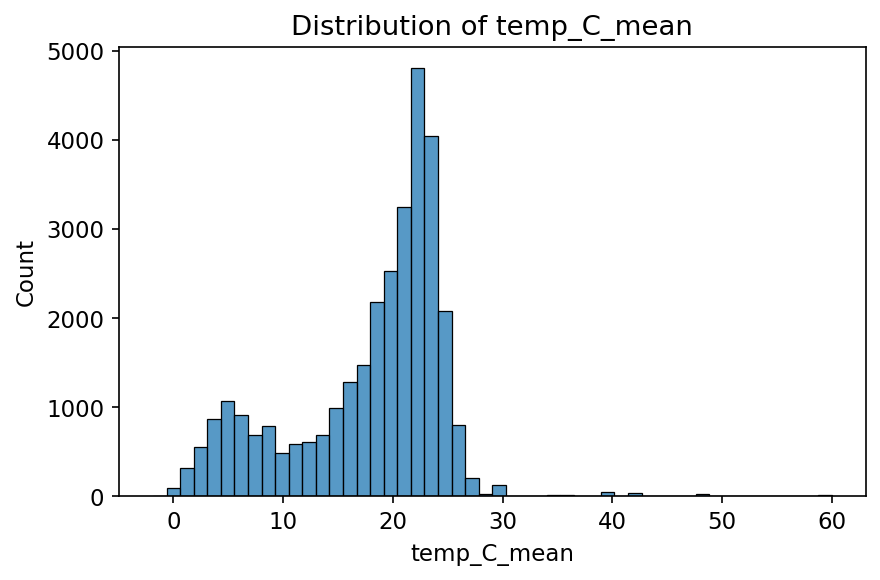

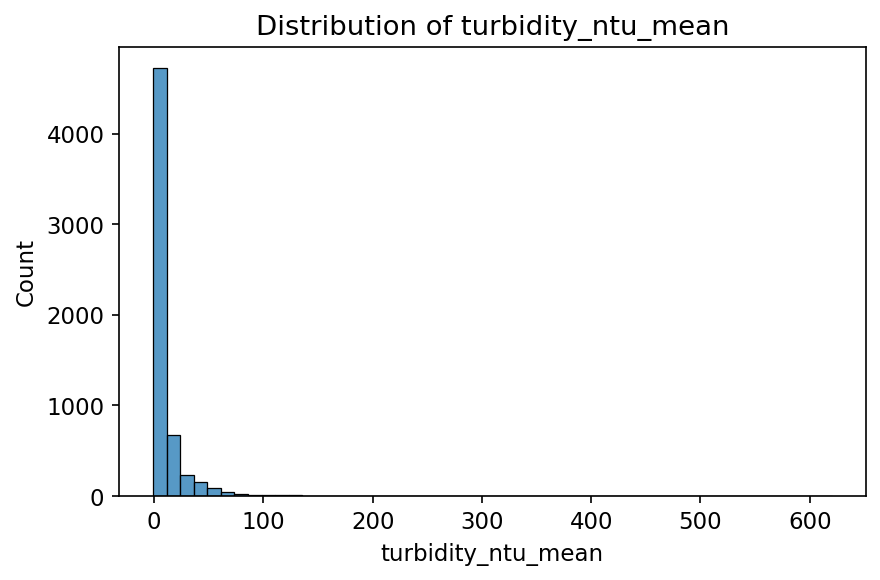

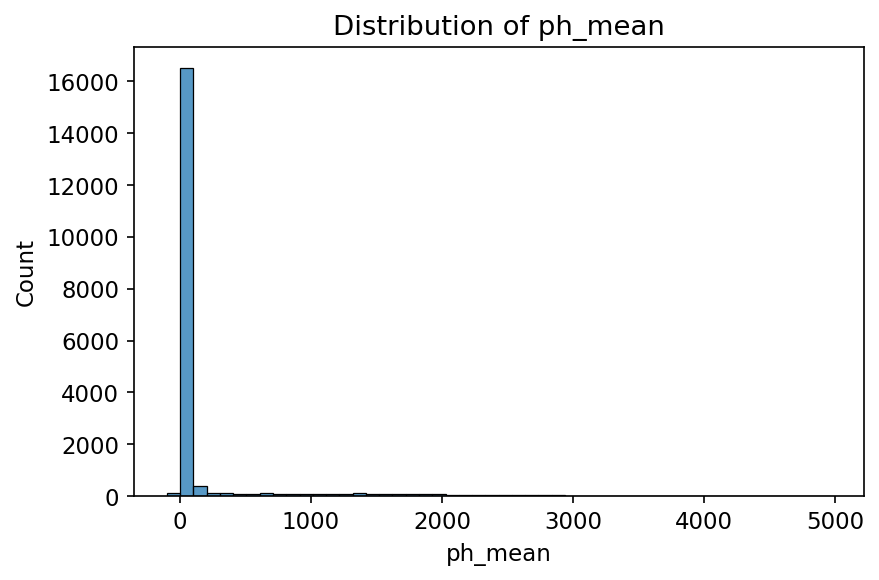

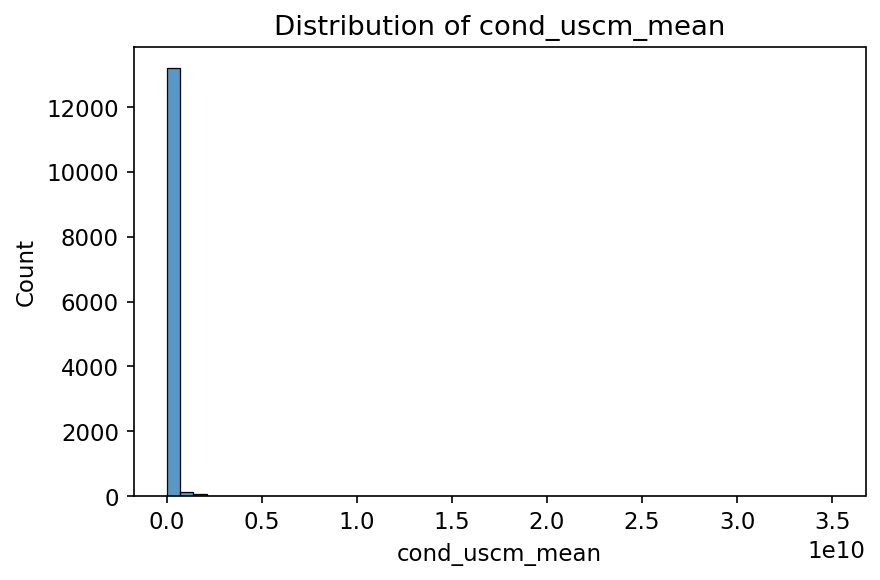

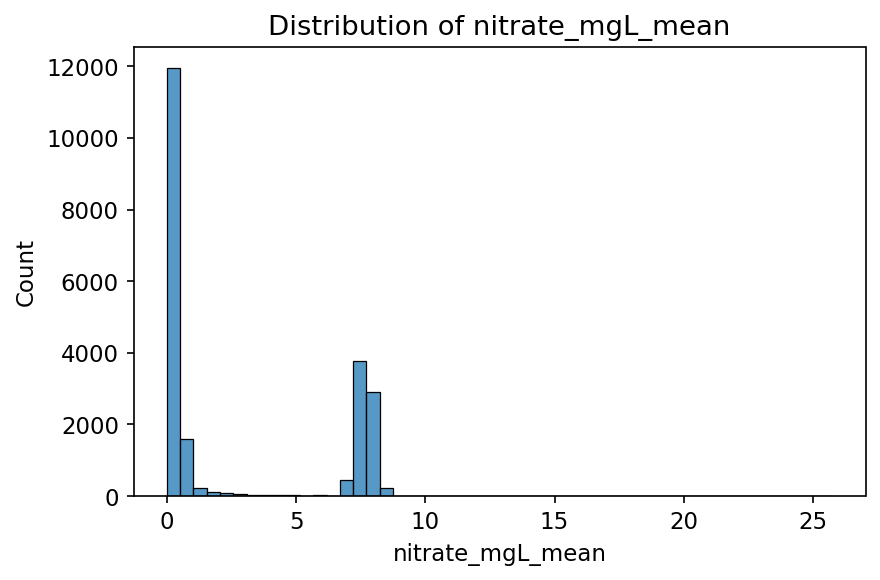

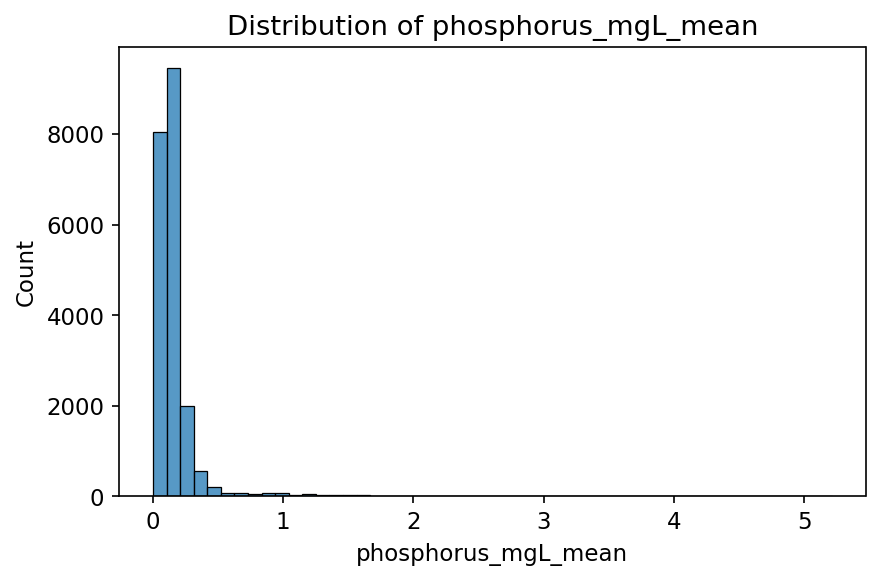

In [114]:
for col in feature_cols:
    if col not in dm.columns:
        continue
    plt.figure(figsize=(6,4))
    sns.histplot(dm[col], bins=50, kde=False)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

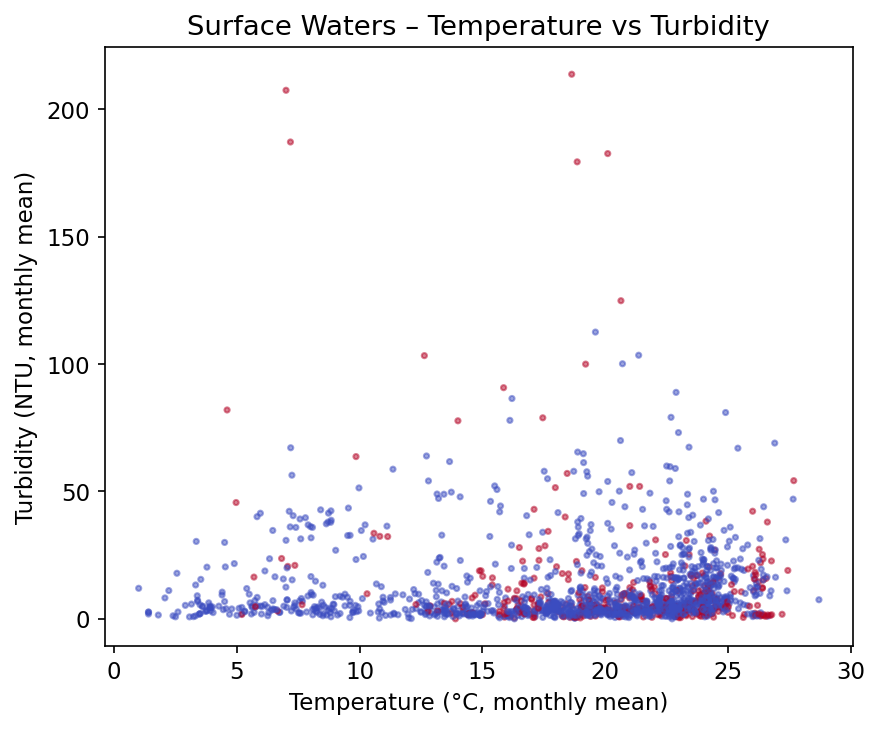

In [115]:
plt.figure(figsize=(6,5))
plt.scatter(
    dm["temp_C_mean"],
    dm["turbidity_ntu_mean"],
    c=dm["y_surface"],
    s=6,
    alpha=0.5,
    cmap="coolwarm"
)
plt.xlabel("Temperature (°C, monthly mean)")
plt.ylabel("Turbidity (NTU, monthly mean)")
plt.title("Surface Waters – Temperature vs Turbidity")
plt.tight_layout()
plt.show()


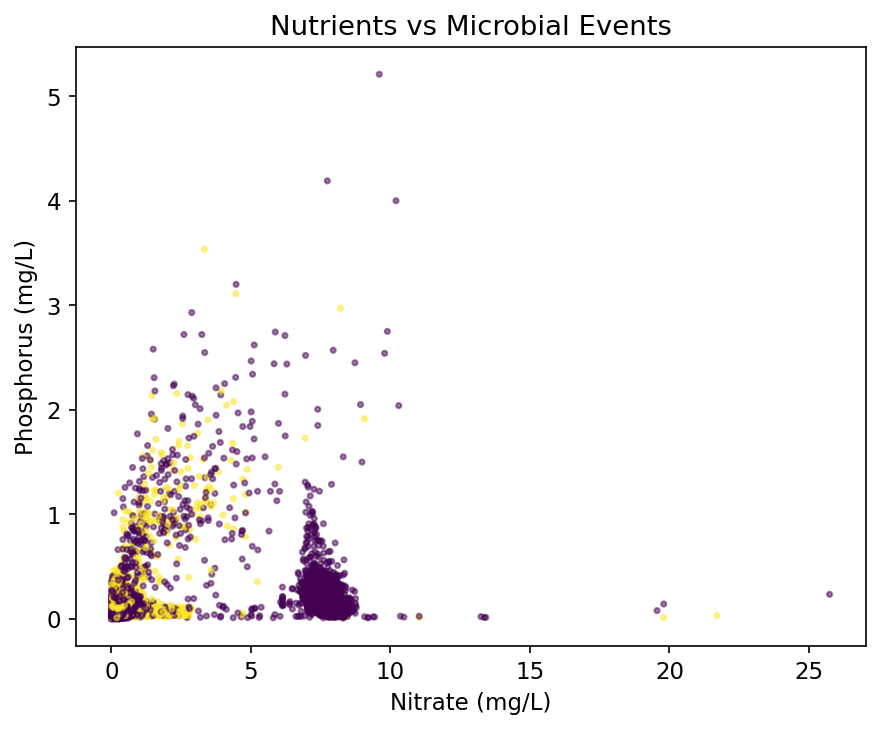

In [116]:
plt.figure(figsize=(6,5))
plt.scatter(
    dm["nitrate_mgL_mean"],
    dm["phosphorus_mgL_mean"],
    c=dm["y_surface"],
    s=6,
    alpha=0.5
)
plt.xlabel("Nitrate (mg/L)")
plt.ylabel("Phosphorus (mg/L)")
plt.title("Nutrients vs Microbial Events")
plt.tight_layout()
plt.show()

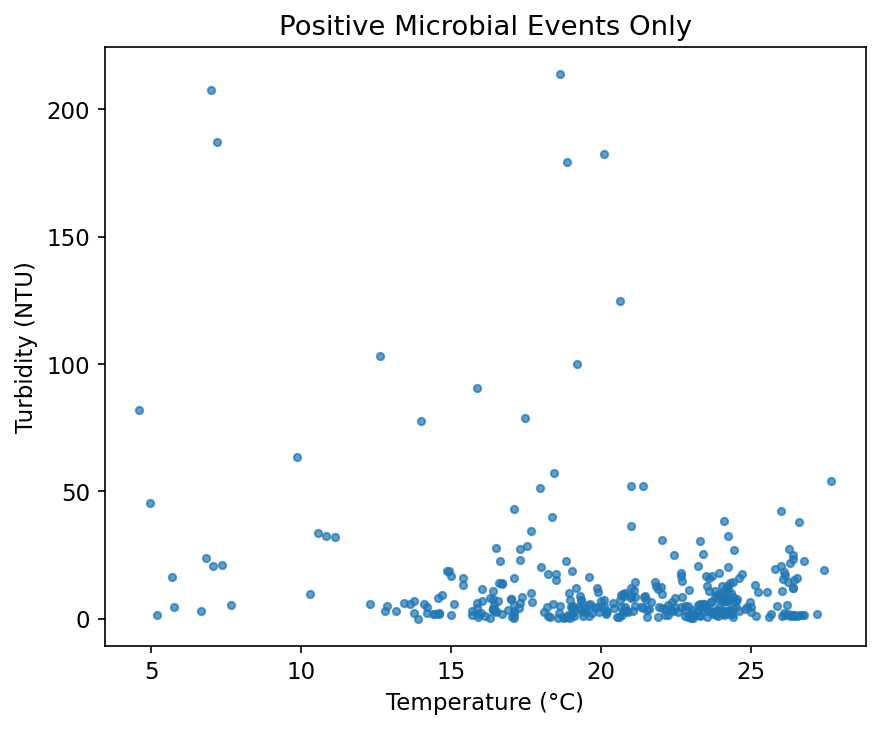

In [117]:
pos = dm[dm["y_surface"] == 1]

plt.figure(figsize=(6,5))
plt.scatter(
    pos["temp_C_mean"],
    pos["turbidity_ntu_mean"],
    s=12,
    alpha=0.7
)
plt.xlabel("Temperature (°C)")
plt.ylabel("Turbidity (NTU)")
plt.title("Positive Microbial Events Only")
plt.tight_layout()
plt.show()

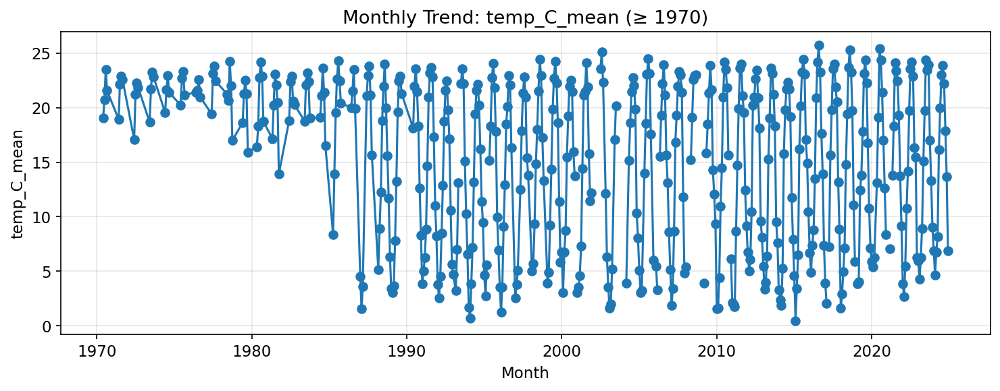

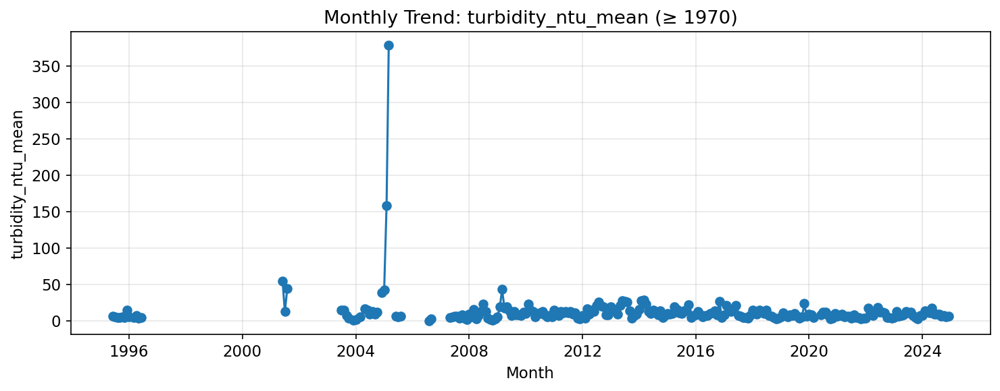

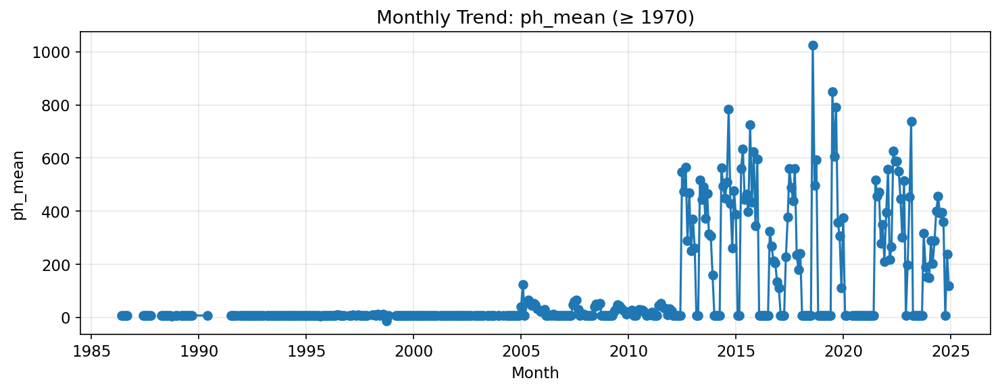

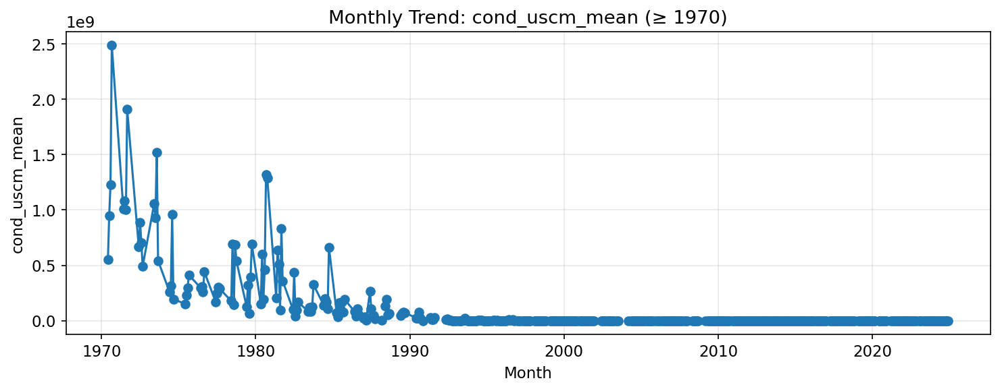

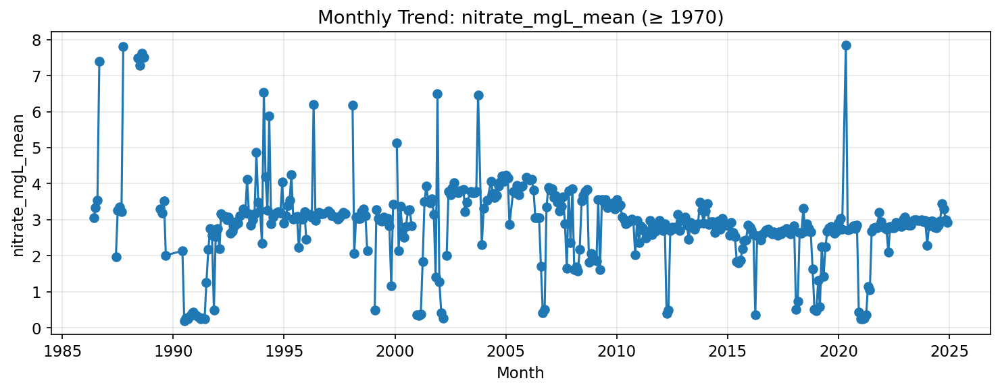

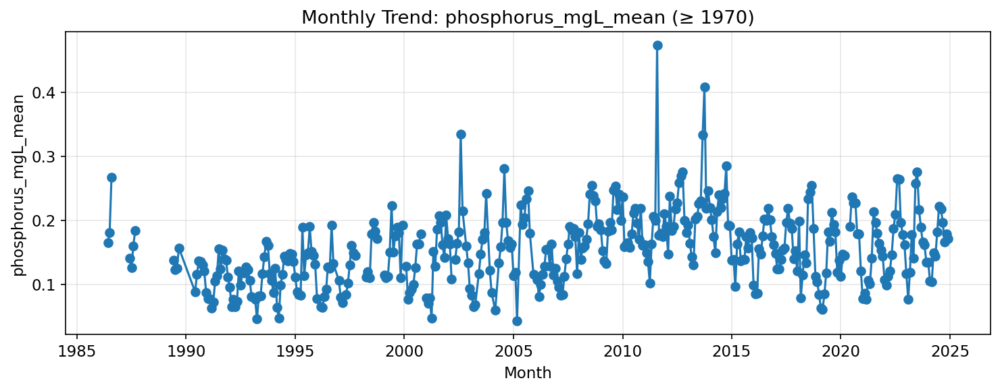

In [118]:
monthly_features = (
    dm_1970.groupby("month_start")[feature_cols]
    .mean()
    .reset_index()
)

monthly_features.head()
for col in feature_cols:
    plt.figure(figsize=(10, 4))
    plt.plot(monthly_features["month_start"], monthly_features[col], marker="o")
    plt.title(f"Monthly Trend: {col} (≥ 1970)")
    plt.xlabel("Month")
    plt.ylabel(col)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

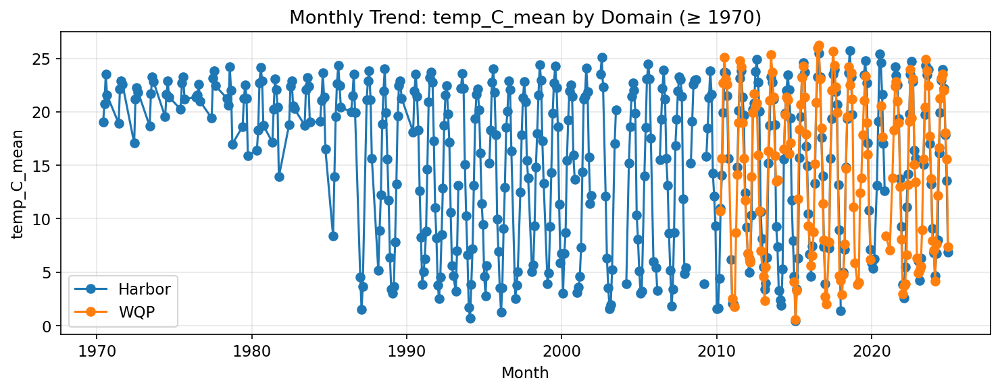

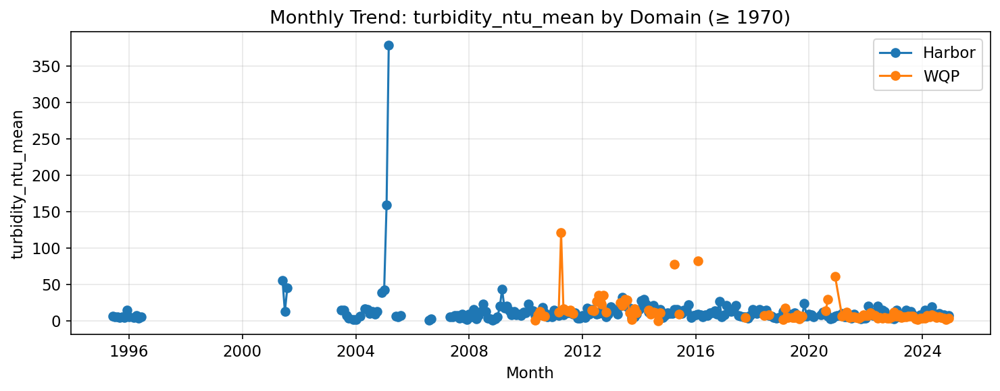

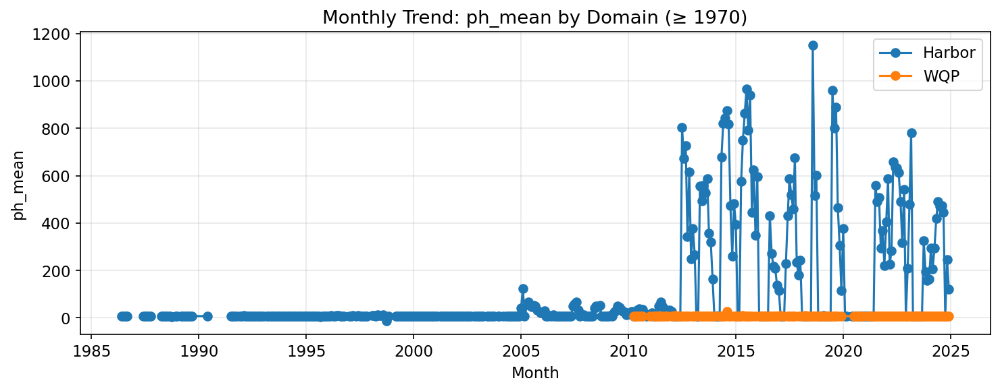

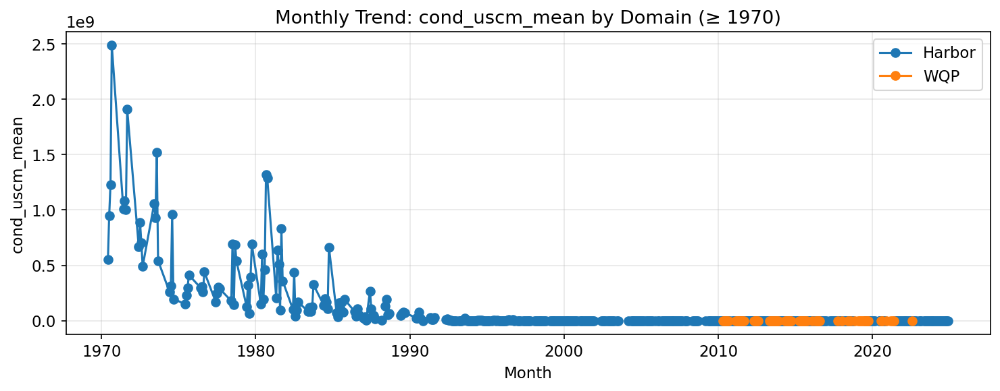

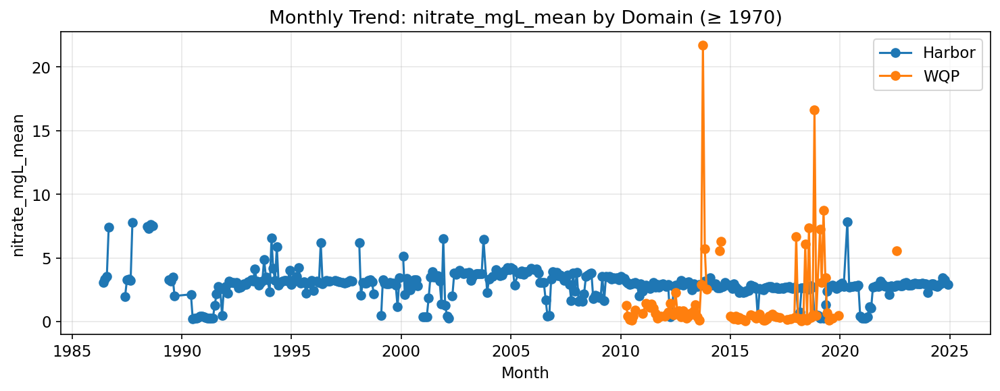

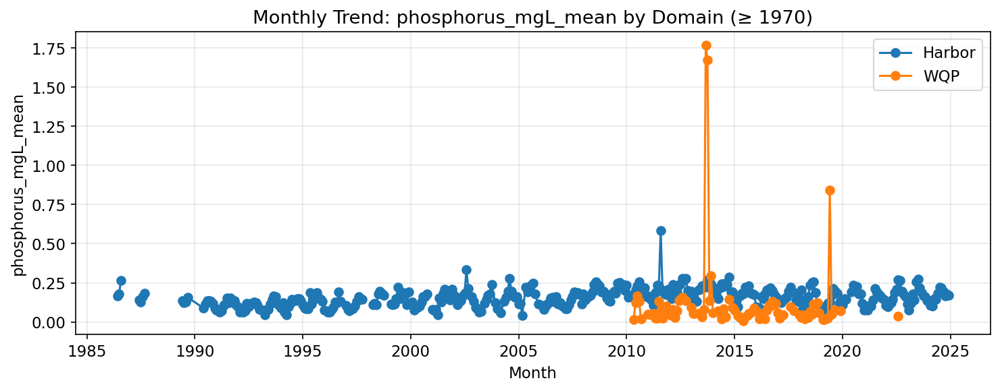

In [119]:
for col in feature_cols:
    monthly_dom_feat = (
        dm_1970.groupby(["month_start", "domain"])[col]
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10,4))
    for dom, sub in monthly_dom_feat.groupby("domain"):
        plt.plot(sub["month_start"], sub[col], marker="o", label=dom)

    plt.title(f"Monthly Trend: {col} by Domain (≥ 1970)")
    plt.xlabel("Month")
    plt.ylabel(col)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

####Model Training

In [120]:
model_df = dm_1970.copy()

# input features
X = model_df[feature_cols]

# target
y = model_df["y_surface"]

model_idx = X.dropna(how="all").index
X = X.loc[model_idx]
y = y.loc[model_idx]

print("Final modeling dataset shape:", X.shape)

Final modeling dataset shape: (28699, 6)


In [121]:
imputer = SimpleImputer(strategy="median")
X_imp = imputer.fit_transform(X)

In [122]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

auc_scores = []
pr_scores = []

for train_idx, test_idx in skf.split(X_imp, y):
    X_train, X_test = X_imp[train_idx], X_imp[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        random_state=42,
        class_weight="balanced"   # helps with imbalance
    )

    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]

    auc_scores.append(roc_auc_score(y_test, y_prob))
    pr_scores.append(average_precision_score(y_test, y_prob))

print("Mean AUC:", np.mean(auc_scores))
print("Mean PR-AUC:", np.mean(pr_scores))

Mean AUC: 0.8966121296489085
Mean PR-AUC: 0.6742242000570796


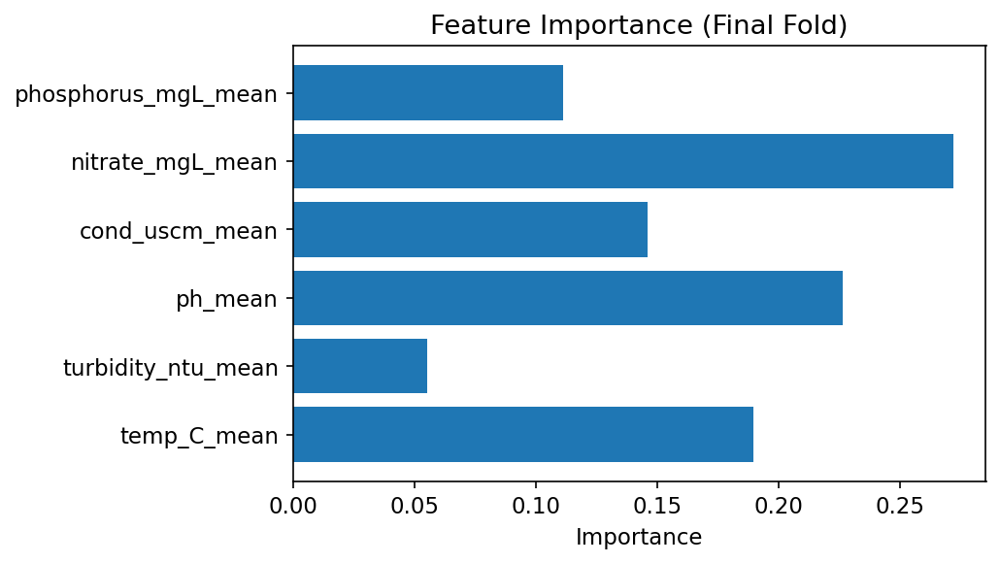

In [123]:
#feature importance plot
importances = model.feature_importances_

plt.figure(figsize=(7,4))
plt.barh(feature_cols, importances)
plt.title("Feature Importance (Final Fold)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

####Export

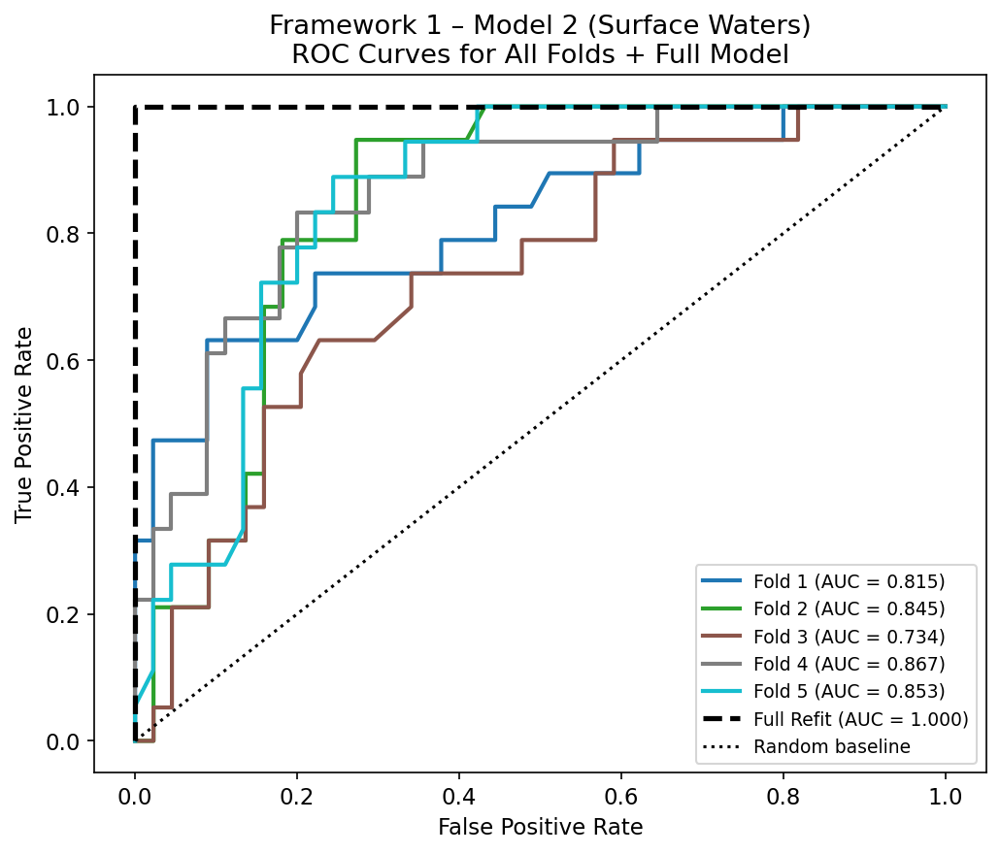

AUC by Fold: [np.float64(0.815), np.float64(0.845), np.float64(0.734), np.float64(0.867), np.float64(0.853)]
Full Refit AUC: 1.0


In [124]:
plot_binary_roc_all_folds_and_full(
    df=surface_unified_monthly,
    feature_cols=[
        "temp_C_mean", "turbidity_ntu_mean", "ph_mean",
        "cond_uscm_mean", "nitrate_mgL_mean", "phosphorus_mgL_mean"
    ],
    label_col="y_surface",
    model_name="Framework 1 – Model 2 (Surface Waters)",
)

In [125]:
from google.colab import files  # for download


# ===== 2. Rebuild Model 2 dataset & features =====

# Starting from unified surface table
dm = surface_unified_monthly.copy()

feature_cols = [
    "temp_C_mean",
    "turbidity_ntu_mean",
    "ph_mean",
    "cond_uscm_mean",
    "nitrate_mgL_mean",
    "phosphorus_mgL_mean",
]

# Drop rows where all physchem features are NaN
dm = dm.dropna(subset=feature_cols, how="all").copy()

# Make sure month_start exists and is datetime
if "month_start" not in dm.columns:
    dm["month_start"] = dm["month"].dt.to_timestamp()

# Restrict to >= 1970 for main modeling, as in your code
dm_1970 = dm[dm["month_start"] >= pd.Timestamp("1970-01-01")].copy()

# Global monthly microbial event rate
monthly_all = (
    dm.groupby("month_start")["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

# Monthly event rate >=1970
monthly_1970 = (
    dm_1970.groupby("month_start")["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

# Monthly event rate by domain
monthly_dom = (
    dm.groupby(["month_start", "domain"])["y_surface"]
    .mean()
    .reset_index(name="event_rate")
)

# Monthly feature means (≥1970)
monthly_features = (
    dm_1970.groupby("month_start")[feature_cols]
    .mean()
    .reset_index()
)

# Monthly feature means by domain (≥1970) – will use for JSON only
monthly_dom_features = {}
for col in feature_cols:
    monthly_dom_feat = (
        dm_1970.groupby(["month_start", "domain"])[col]
        .mean()
        .reset_index()
    )
    monthly_dom_features[col] = monthly_dom_feat


# ===== 3. Export directory =====
EXPORT_DIR = Path("framework2_model2_exports")
EXPORT_DIR.mkdir(exist_ok=True)
print("Export dir:", EXPORT_DIR)


# ===== 4. PNG plots =====

# 4.1 Surface Waters – Monthly microbial event rate (all years)
plt.figure(figsize=(10,4))
plt.plot(monthly_all["month_start"], monthly_all["event_rate"], marker="o")
plt.title("Surface Waters – Monthly Microbial Event Rate (WQP + Harbor)")
plt.xlabel("Month")
plt.ylabel("Event Rate (fraction of sites with contamination)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_event_rate_all_years.png", dpi=300)
plt.show()

# 4.2 Same but ≥1970
plt.figure(figsize=(10,4))
plt.plot(monthly_1970["month_start"], monthly_1970["event_rate"], marker="o")
plt.title("Surface Waters – Monthly Microbial Event Rate (WQP + Harbor, ≥ 1970)")
plt.xlabel("Month")
plt.ylabel("Event Rate (fraction of sites with contamination)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_event_rate_1970_plus.png", dpi=300)
plt.show()

# 4.3 Monthly event rate by domain
plt.figure(figsize=(10,4))
for dom, sub in monthly_dom.groupby("domain"):
    plt.plot(sub["month_start"], sub["event_rate"], marker="o", label=dom)
plt.title("Surface Waters – Monthly Microbial Event Rate by Domain")
plt.xlabel("Month")
plt.ylabel("Event Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(EXPORT_DIR / "monthly_event_rate_by_domain.png", dpi=300)
plt.show()

# 4.4 Histograms for each physchem feature
for col in feature_cols:
    if col not in dm.columns:
        continue
    plt.figure(figsize=(6,4))
    sns.histplot(dm[col], bins=50, kde=False)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.savefig(EXPORT_DIR / f"hist_{col}.png", dpi=300)
    plt.show()

# 4.5 Scatter: temp vs turbidity colored by y_surface
plt.figure(figsize=(6,5))
plt.scatter(
    dm["temp_C_mean"],
    dm["turbidity_ntu_mean"],
    c=dm["y_surface"],
    s=6,
    alpha=0.5,
    cmap="coolwarm"
)
plt.xlabel("Temperature (°C, monthly mean)")
plt.ylabel("Turbidity (NTU, monthly mean)")
plt.title("Surface Waters – Temperature vs Turbidity (colored by y_surface)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_temp_vs_turbidity_colored_by_y_surface.png", dpi=300)
plt.show()

# 4.6 Scatter: nitrate vs phosphorus colored by y_surface
plt.figure(figsize=(6,5))
plt.scatter(
    dm["nitrate_mgL_mean"],
    dm["phosphorus_mgL_mean"],
    c=dm["y_surface"],
    s=6,
    alpha=0.5
)
plt.xlabel("Nitrate (mg/L)")
plt.ylabel("Phosphorus (mg/L)")
plt.title("Surface Waters – Nutrients vs Microbial Events")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_nutrients_vs_events.png", dpi=300)
plt.show()

# 4.7 Scatter: positive events only (temp vs turbidity)
pos = dm[dm["y_surface"] == 1].copy()

plt.figure(figsize=(6,5))
plt.scatter(
    pos["temp_C_mean"],
    pos["turbidity_ntu_mean"],
    s=12,
    alpha=0.7
)
plt.xlabel("Temperature (°C)")
plt.ylabel("Turbidity (NTU)")
plt.title("Surface Waters – Positive Microbial Events Only")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_positive_events_only.png", dpi=300)
plt.show()

# 4.8 Monthly trends of each feature (≥1970)
for col in feature_cols:
    plt.figure(figsize=(10,4))
    plt.plot(monthly_features["month_start"], monthly_features[col], marker="o")
    plt.title(f"Monthly Trend: {col} (≥ 1970)")
    plt.xlabel("Month")
    plt.ylabel(col)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(EXPORT_DIR / f"trend_{col}_1970_plus.png", dpi=300)
    plt.show()

# 4.9 Monthly trends of each feature by domain (≥1970)
for col in feature_cols:
    monthly_dom_feat = monthly_dom_features[col]
    plt.figure(figsize=(10,4))
    for dom, sub in monthly_dom_feat.groupby("domain"):
        plt.plot(sub["month_start"], sub[col], marker="o", label=dom)
    plt.title(f"Monthly Trend: {col} by Domain (≥ 1970)")
    plt.xlabel("Month")
    plt.ylabel(col)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(EXPORT_DIR / f"trend_{col}_by_domain_1970_plus.png", dpi=300)
    plt.show()


# ===== 5. Model training (re-run RF CV for clean summary) =====

model_df = dm_1970.copy()

X = model_df[feature_cols]
y = model_df["y_surface"]

# keep rows where not all features are NaN
model_idx = X.dropna(how="all").index
X = X.loc[model_idx]
y = y.loc[model_idx]

print("Final modeling dataset shape:", X.shape)

imputer = SimpleImputer(strategy="median")
X_imp = imputer.fit_transform(X)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

auc_scores = []
pr_scores = []

for train_idx, test_idx in skf.split(X_imp, y):
    X_train, X_test = X_imp[train_idx], X_imp[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        random_state=42,
        class_weight="balanced",
    )

    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]

    auc_scores.append(roc_auc_score(y_test, y_prob))
    pr_scores.append(average_precision_score(y_test, y_prob))

mean_auc = float(np.mean(auc_scores))
std_auc  = float(np.std(auc_scores))
mean_pr  = float(np.mean(pr_scores))
std_pr   = float(np.std(pr_scores))

print("Mean AUC:", mean_auc)
print("Mean PR-AUC:", mean_pr)

summary_2 = {
    "rf_auc_mean": mean_auc,
    "rf_auc_std": std_auc,
    "rf_pr_mean": mean_pr,
    "rf_pr_std": std_pr,
    "n_splits": 5,
    "n_samples": int(X_imp.shape[0]),
    "pos_prevalence": float(y.mean()),
}

# Feature importances (final model from last fold)
importances = model.feature_importances_
plt.figure(figsize=(7,4))
plt.barh(feature_cols, importances)
plt.title("Framework 2 – Feature Importance (Final Fold)")
plt.xlabel("Importance")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "feature_importance_model2.png", dpi=300)
plt.show()


# ===== 6. Training results table: CSV + PNG + JSON =====

# Simple table (only RF, no dummy baseline in this model)
results_table = pd.DataFrame(
    {
        "Metric": [
            "ROC AUC (mean ± std)",
            "PR AUC (mean ± std)",
            "Positive class prevalence",
        ],
        "Random Forest": [
            f"{mean_auc:.3f} ± {std_auc:.3f}",
            f"{mean_pr:.3f} ± {std_pr:.3f}",
            round(summary_2["pos_prevalence"], 5),
        ],
    }
)

results_table.to_csv(EXPORT_DIR / "model2_training_results_table.csv", index=False)

# PNG table
fig, ax = plt.subplots(figsize=(6, 2.5))
ax.axis("off")

table_data = [results_table.columns.tolist()] + results_table.values.tolist()
table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.6)

for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(EXPORT_DIR / "model2_training_results_table.png", dpi=300, bbox_inches="tight")
plt.show()

# Raw numeric JSON summary
with open(EXPORT_DIR / "model2_training_results.json", "w") as f:
    json.dump(summary_2, f, indent=2)


# ===== 7. Graph data JSON (for recreating line plots) =====

graphs_json = {}

# Event rate (all years)
graphs_json["monthly_event_rate_all"] = {
    "month_start": monthly_all["month_start"].astype(str).tolist(),
    "event_rate": monthly_all["event_rate"].tolist(),
    "title": "Surface Waters – Monthly Microbial Event Rate (WQP + Harbor)",
    "y_label": "Event Rate",
}

# Event rate (≥1970)
graphs_json["monthly_event_rate_1970_plus"] = {
    "month_start": monthly_1970["month_start"].astype(str).tolist(),
    "event_rate": monthly_1970["event_rate"].tolist(),
    "title": "Surface Waters – Monthly Microbial Event Rate (WQP + Harbor, ≥ 1970)",
    "y_label": "Event Rate",
}

# Event rate by domain
graphs_json["monthly_event_rate_by_domain"] = {
    "month_start": monthly_dom["month_start"].astype(str).tolist(),
    "domain": monthly_dom["domain"].tolist(),
    "event_rate": monthly_dom["event_rate"].tolist(),
    "title": "Surface Waters – Monthly Event Rate by Domain",
    "y_label": "Event Rate",
}

# Monthly feature trends (≥1970)
graphs_json["monthly_feature_trends_1970_plus"] = {
    "month_start": monthly_features["month_start"].astype(str).tolist(),
    "features": {
        col: monthly_features[col].tolist()
        for col in feature_cols
    },
    "title": "Surface Waters – Monthly PhysChem Trends (≥ 1970)",
}

# Monthly feature trends by domain (≥1970)
graphs_json["monthly_feature_trends_by_domain_1970_plus"] = {}
for col in feature_cols:
    df_feat = monthly_dom_features[col]
    graphs_json["monthly_feature_trends_by_domain_1970_plus"][col] = {
        "month_start": df_feat["month_start"].astype(str).tolist(),
        "domain": df_feat["domain"].tolist(),
        "value": df_feat[col].tolist(),
        "y_label": col,
    }

with open(EXPORT_DIR / "framework2_model2_graph_data.json", "w") as f:
    json.dump(graphs_json, f, indent=2)


# ===== 8. Zip everything & download =====

zip_path = "framework2_model2_bundle.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    for root, dirs, filenames in os.walk(EXPORT_DIR):
        for fname in filenames:
            full_path = Path(root) / fname
            rel_path = full_path.relative_to(EXPORT_DIR)
            zf.write(full_path, arcname=rel_path)

print("Created zip:", zip_path)
files.download(zip_path)

Output hidden; open in https://colab.research.google.com to view.

## Framework 2 (Crop Yield Prediction)




###Model 1

####Feature Engineering

In [126]:
usda_path = DATA_ROOT / "USDA_NASS_Regional_Crop_Yield" / "USDA_Regional_Crop_Yield_Data.csv"

# Parse HTML table(s) from the saved file
usda_tables = pd.read_html(usda_path, header=0)  # header=0 uses first row as header
df_usda_raw = usda_tables[0]

print("USDA raw shape:", df_usda_raw.shape)
print(df_usda_raw.columns.tolist())
df_usda_raw.head()

USDA raw shape: (38683, 21)
['Program', 'Year', 'Period', 'Week Ending', 'Geo Level', 'State', 'State ANSI', 'Ag District', 'Ag District Code', 'County', 'County ANSI', 'Zip Code', 'Region', 'watershed_code', 'Watershed', 'Commodity', 'Data Item', 'Domain', 'Domain Category', 'Value', 'CV (%)']


,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,CENSUS,2022,YEAR,NaN,COUNTY,NEW YORK,36,CENTRAL,50,CAYUGA,...,NaN,NaN,0,NaN,ARTICHOKES,ARTICHOKES - ACRES HARVESTED,TOTAL,NOT SPECIFIED,(D),(D)
1,CENSUS,2022,YEAR,NaN,COUNTY,NEW YORK,36,CENTRAL,50,CAYUGA,...,NaN,NaN,0,NaN,ARTICHOKES,ARTICHOKES - OPERATIONS WITH AREA HARVESTED,TOTAL,NOT SPECIFIED,1,(L)
2,CENSUS,2022,YEAR,NaN,COUNTY,NEW YORK,36,CENTRAL,50,CAYUGA,...,NaN,NaN,0,NaN,ARTICHOKES,"ARTICHOKES, PROCESSING - ACRES HARVESTED",TOTAL,NOT SPECIFIED,(D),(D)
3,CENSUS,2022,YEAR,NaN,COUNTY,NEW YORK,36,CENTRAL,50,CAYUGA,...,NaN,NaN,0,NaN,ARTICHOKES,"ARTICHOKES, PROCESSING - OPERATIONS WITH AREA ...",TOTAL,NOT SPECIFIED,1,(L)
4,CENSUS,2022,YEAR,NaN,COUNTY,NEW YORK,36,CENTRAL,50,CAYUGA,...,NaN,NaN,0,NaN,ASPARAGUS,ASPARAGUS - ACRES HARVESTED,TOTAL,NOT SPECIFIED,4,5.5


In [127]:
### Clean USDA NASS data (NY counties, crop yields)

df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "CORN"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()


Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

,YEAR,COUNTY_NAME,COMMODITY,YIELD
31578,2024,CAYUGA,CORN,182.2
31581,2024,CAYUGA,CORN,21.0
31589,2024,CHENANGO,CORN,132.8
31592,2024,CHENANGO,CORN,19.0
31599,2024,CORTLAND,CORN,20.0


In [128]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "BARLEY"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()


Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

DATA_ITEM_SIMPLE,YEAR,COUNTY_NAME,COMMODITY,YIELD
0,2012,ALLEGANY,BARLEY,41.878505
1,2012,CAYUGA,BARLEY,42.354887
2,2012,CORTLAND,BARLEY,53.613636
3,2012,FRANKLIN,BARLEY,36.333333
4,2012,HERKIMER,BARLEY,33.429134


In [129]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "BEANS"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

,YEAR,COUNTY_NAME,COMMODITY,YIELD
37302,2012,STEUBEN,BEANS,2190.0
38657,2010,STEUBEN,BEANS,2230.0


In [130]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "BUCKWHEAT"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

DATA_ITEM_SIMPLE,YEAR,COUNTY_NAME,COMMODITY,YIELD
0,2012,CAYUGA,BUCKWHEAT,21.737160
1,2012,CHAUTAUQUA,BUCKWHEAT,34.962963
2,2012,CLINTON,BUCKWHEAT,14.857143
3,2012,MADISON,BUCKWHEAT,16.731707
4,2012,STEUBEN,BUCKWHEAT,23.868613


In [131]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "HAY"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

,YEAR,COUNTY_NAME,COMMODITY,YIELD
33589,2018,CHENANGO,HAY,2.85
33603,2018,CORTLAND,HAY,3.10
33647,2018,ONONDAGA,HAY,3.30
33661,2018,OSWEGO,HAY,1.80
33675,2018,OTHER (COMBINED) COUNTIES,HAY,2.70


In [132]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "HEMP"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

DATA_ITEM_SIMPLE,YEAR,COUNTY_NAME,COMMODITY,YIELD
0,2022,DELAWARE,HEMP,98.000000
1,2022,DUTCHESS,HEMP,442.571429
2,2022,ORANGE,HEMP,0.200000
7,2022,WASHINGTON,HEMP,67.302326


In [133]:
df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# 3) Pick a commodity
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])

# >>> CHANGE THIS to something that actually appears, e.g. "CORN", "SOYBEANS", "BARLEY"
target_commodity = "HERBS"

if target_commodity in df_y["COMMODITY"].unique():
    df_y = df_y[df_y["COMMODITY"] == target_commodity].copy()
    print(f"After COMMODITY='{target_commodity}' filter:", df_y.shape)
else:
    print(f"WARNING: '{target_commodity}' not found in COMMODITY; using all commodities")

# 4) Build yield values

df_y["YEAR"] = pd.to_numeric(df_y["YEAR"], errors="coerce")
df_y = df_y.dropna(subset=["YEAR"]).copy()
df_y["YEAR"] = df_y["YEAR"].astype(int)

# Try to use direct YIELD rows if they exist
has_yield_rows = df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False).any()
print("Any DATA ITEM rows with 'YIELD'?", has_yield_rows)

if has_yield_rows:
    yield_rows = df_y[df_y["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
    yield_rows["COUNTY_NAME"] = (
        yield_rows["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )
    panel = (
        yield_rows[["YEAR", "COUNTY_NAME", "COMMODITY", "VALUE_NUM"]]
        .rename(columns={"VALUE_NUM": "YIELD"})
        .drop_duplicates()
        .copy()
    )
else:
    # Compute yield = PRODUCTION / ACRES HARVESTED
    sub = df_y[df_y["DATA ITEM"].str.contains("ACRES HARVESTED|PRODUCTION", case=False, na=False)].copy()

    def simplify_item(s):
        s = str(s).upper()
        if "ACRES HARVESTED" in s:
            return "ACRES"
        if "PRODUCTION" in s:
            return "PRODUCTION"
        return None

    sub["DATA_ITEM_SIMPLE"] = sub["DATA ITEM"].apply(simplify_item)
    sub = sub[sub["DATA_ITEM_SIMPLE"].notna()].copy()

    pivot = sub.pivot_table(
        index=["YEAR", "COUNTY", "COMMODITY"],
        columns="DATA_ITEM_SIMPLE",
        values="VALUE_NUM",
        aggfunc="first"
    ).reset_index()

    # Drop rows where we don't have both pieces
    pivot = pivot.dropna(subset=["ACRES", "PRODUCTION"]).copy()
    pivot["YIELD"] = pivot["PRODUCTION"] / pivot["ACRES"]

    pivot["COUNTY_NAME"] = (
        pivot["COUNTY"]
        .astype(str)
        .str.upper()
        .str.replace(" COUNTY", "", regex=False)
        .str.strip()
    )

    panel = pivot[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

DATA_ITEM_SIMPLE,YEAR,COUNTY_NAME,COMMODITY,YIELD
32,2017,MADISON,HERBS,60.000000
34,2017,ORANGE,HERBS,2000.000000
46,2017,ULSTER,HERBS,945.454545
59,2022,DUTCHESS,HERBS,707.111111
66,2022,MADISON,HERBS,51.846154


In [134]:
### Clean USDA NASS data (NY counties, crop yields)

df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

print("Raw USDA columns:", df_y.columns.tolist())
print(df_y.head(3))

# 1) Filter to NY + county (your query already did this, but it won't hurt)
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()
print("After STATE=NY & GEO LEVEL=COUNTY:", df_y.shape)

# 2) Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan, "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()
print("Example COMMODITY values:", df_y["COMMODITY"].unique()[:20])
target_commodity = "CORN"

corn = df_y[df_y["COMMODITY"] == target_commodity].copy()
print(f"Rows for {target_commodity}:", corn.shape)

corn["YEAR"] = pd.to_numeric(corn["YEAR"], errors="coerce")
corn = corn.dropna(subset=["YEAR"]).copy()
corn["YEAR"] = corn["YEAR"].astype(int)

# Only rows that are some type of YIELD
yield_rows = corn[corn["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()
print("Unique DATA ITEM values containing 'YIELD' (first 20):")
print(yield_rows["DATA ITEM"].unique()[:20])

# Simplify the data item:
# - Prefer grain yield (bushels/acre) over silage/other yields
def simplify_corn_item(s):
    s = str(s).upper()
    if "GRAIN" in s and "YIELD" in s:
        return "GRAIN_YIELD"
    if "SILAGE" in s and "YIELD" in s:
        return "SILAGE_YIELD"
    return "OTHER_YIELD"

yield_rows["DATA_ITEM_SIMPLE"] = yield_rows["DATA ITEM"].apply(simplify_corn_item)

# Prefer grain yield if available; otherwise keep all yield rows
if (yield_rows["DATA_ITEM_SIMPLE"] == "GRAIN_YIELD").any():
    yield_rows = yield_rows[yield_rows["DATA_ITEM_SIMPLE"] == "GRAIN_YIELD"].copy()
    print("Using only GRAIN_YIELD rows")
else:
    print("No explicit GRAIN_YIELD rows found; using all YIELD rows")

# Now aggregate to one yield per (YEAR, COUNTY)
yield_panel = (
    yield_rows
    .groupby(["YEAR", "COUNTY", "COMMODITY"], as_index=False)["VALUE_NUM"]
    .mean()  # average if more than one YIELD row left
)

# Clean county names
yield_panel["COUNTY_NAME"] = (
    yield_panel["COUNTY"]
    .astype(str)
    .str.upper()
    .str.replace(" COUNTY", "", regex=False)
    .str.strip()
)

yield_panel = yield_panel.rename(columns={"VALUE_NUM": "YIELD"})

panel = yield_panel[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()

print("Yield panel shape (county-year, corn grain):", panel.shape)
panel.head()

Raw USDA columns: ['PROGRAM', 'YEAR', 'PERIOD', 'WEEK ENDING', 'GEO LEVEL', 'STATE', 'STATE ANSI', 'AG DISTRICT', 'AG DISTRICT CODE', 'COUNTY', 'COUNTY ANSI', 'ZIP CODE', 'REGION', 'WATERSHED_CODE', 'WATERSHED', 'COMMODITY', 'DATA ITEM', 'DOMAIN', 'DOMAIN CATEGORY', 'VALUE', 'CV (%)']
  PROGRAM  YEAR PERIOD  WEEK ENDING GEO LEVEL     STATE  STATE ANSI  \
0  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
1  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   
2  CENSUS  2022   YEAR          NaN    COUNTY  NEW YORK          36   

  AG DISTRICT  AG DISTRICT CODE  COUNTY  ...  ZIP CODE  REGION  \
0     CENTRAL                50  CAYUGA  ...       NaN     NaN   
1     CENTRAL                50  CAYUGA  ...       NaN     NaN   
2     CENTRAL                50  CAYUGA  ...       NaN     NaN   

   WATERSHED_CODE  WATERSHED   COMMODITY  \
0               0        NaN  ARTICHOKES   
1               0        NaN  ARTICHOKES   
2               0        NaN  AR

,YEAR,COUNTY_NAME,COMMODITY,YIELD
0,2010,ALBANY,CORN,138.8
1,2010,ALLEGANY,CORN,162.6
2,2010,BROOME,CORN,160.5
3,2010,CATTARAUGUS,CORN,146.6
4,2010,CAYUGA,CORN,151.0


In [135]:
panel = panel.dropna(subset=["YIELD"]).copy()

q = panel["YIELD"].quantile([0.33, 0.66])
q_low, q_high = q.loc[0.33], q.loc[0.66]
print("Yield thresholds:", q_low, q_high)

def categorize_yield(v):
    if v < q_low:
        return 0
    elif v < q_high:
        return 1
    else:
        return 2

panel["y_yield"] = panel["YIELD"].apply(categorize_yield)
print(panel["y_yield"].value_counts())

Yield thresholds: 133.324 149.624
y_yield
2    141
1    137
0    137
Name: count, dtype: int64


####Geospatial Processing

In [136]:
surf = surface_unified_monthly.copy()

# Year and month from the monthly timestamp
surf["year"] = surf["month_start"].dt.year
surf["month_num"] = surf["month_start"].dt.month

# Growing season: April–September (4–9)
growing = surf[surf["month_num"].between(4, 9)].copy()

# Candidate physchem + microbial features
wq_feature_cols = [
    "temp_C_mean",
    "turbidity_ntu_mean",
    "ph_mean",
    "cond_uscm_mean",
    "nitrate_mgL_mean",
    "phosphorus_mgL_mean",
    "y_surface",  # will become an annual microbial event rate
]

# Keep only features that actually exist in the unified table
wq_feature_cols = [c for c in wq_feature_cols if c in growing.columns]
print("Water-quality feature columns used:", wq_feature_cols)

# Annual mean across all NY surface sites (WQP + Harbor)
annual_wq = (
    growing
    .groupby("year")[wq_feature_cols]
    .mean()
    .rename(columns={"y_surface": "surface_event_rate"})
    .reset_index()
)

print("Annual water-quality table:", annual_wq.shape)
annual_wq.head()


Water-quality feature columns used: ['temp_C_mean', 'turbidity_ntu_mean', 'ph_mean', 'cond_uscm_mean', 'nitrate_mgL_mean', 'phosphorus_mgL_mean', 'y_surface']
Annual water-quality table: (114, 8)


,year,temp_C_mean,turbidity_ntu_mean,ph_mean,cond_uscm_mean,nitrate_mgL_mean,phosphorus_mgL_mean,surface_event_rate
0,1909,19.247951,NaN,NaN,NaN,NaN,NaN,0.0
1,1911,21.728190,NaN,NaN,NaN,NaN,NaN,0.0
2,1912,18.954000,NaN,NaN,NaN,NaN,NaN,0.0
3,1913,26.598761,NaN,NaN,NaN,NaN,NaN,0.0
4,1914,20.428378,NaN,NaN,NaN,NaN,NaN,0.0


#### Modeling Architecture

In [137]:
panel["YEAR"] = panel["YEAR"].astype(int)
annual_wq["year"] = annual_wq["year"].astype(int)

# Join on year (state-level WQ applied to all counties in that year)
model_df = panel.merge(
    annual_wq,
    left_on="YEAR",
    right_on="year",
    how="left"
)

# Drop duplicate year column if present
if "year" in model_df.columns:
    model_df = model_df.drop(columns=["year"])

# Feature columns: year + all WQ features we just created
feature_cols_wq = [c for c in annual_wq.columns if c != "year"]
feature_cols_wq = [c for c in feature_cols_wq if c in model_df.columns]
feature_cols = ["YEAR"] + feature_cols_wq

print("Feature columns:", feature_cols)

# Drop rows with missing label
model_use = model_df.dropna(subset=["y_yield"]).copy()

# Drop rows where ALL features are NaN
model_use = model_use.dropna(subset=feature_cols, how="all").copy()

X = model_use[feature_cols].values
y = model_use["y_yield"].astype(int).values

print("Modeling dataset shape:", X.shape)
print("Class counts (0=Low,1=Med,2=High):", np.bincount(y))


Feature columns: ['YEAR', 'temp_C_mean', 'turbidity_ntu_mean', 'ph_mean', 'cond_uscm_mean', 'nitrate_mgL_mean', 'phosphorus_mgL_mean', 'surface_event_rate']
Modeling dataset shape: (415, 8)
Class counts (0=Low,1=Med,2=High): [137 137 141]


####Model Training

In [138]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

f1_rf, f1_dummy = [], []
auc_rf, auc_dummy = [], []

fold = 0
for train_idx, test_idx in skf.split(X, y):
    fold += 1
    X_tr, X_te = X[train_idx], X[test_idx]
    y_tr, y_te = y[train_idx], y[test_idx]

    # --- Dummy baseline: always predicts the majority class ---
    dummy = DummyClassifier(strategy="most_frequent")
    dummy.fit(X_tr, y_tr)
    y_dummy_pred = dummy.predict(X_te)
    y_dummy_proba = dummy.predict_proba(X_te)

    f1_d = f1_score(y_te, y_dummy_pred, average="macro")

    # For ROC-AUC we need one-hot true labels
    y_te_onehot = pd.get_dummies(y_te)
    auc_d = roc_auc_score(
        y_te_onehot, y_dummy_proba,
        average="macro", multi_class="ovr"
    )

    f1_dummy.append(f1_d)
    auc_dummy.append(auc_d)

    # --- RandomForest model ---
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced",   # up-weights rare yield classes
        random_state=42,
        n_jobs=-1,
    )

    rf.fit(X_tr, y_tr)
    y_rf_pred = rf.predict(X_te)
    y_rf_proba = rf.predict_proba(X_te)

    f1_r = f1_score(y_te, y_rf_pred, average="macro")
    auc_r = roc_auc_score(
        y_te_onehot, y_rf_proba,
        average="macro", multi_class="ovr"
    )

    f1_rf.append(f1_r)
    auc_rf.append(auc_r)

    print(
        f"Fold {fold}: "
        f"RF F1={f1_r:.3f}, AUC={auc_r:.3f}  |  "
        f"Dummy F1={f1_d:.3f}, AUC={auc_d:.3f}"
    )

print("\n--- Cross-validated performance (Yield model) ---")
print(f"RF    Macro F1:  {np.mean(f1_rf):.3f} ± {np.std(f1_rf):.3f}")
print(f"RF    Macro AUC: {np.mean(auc_rf):.3f} ± {np.std(auc_rf):.3f}")
print(f"Dummy Macro F1:  {np.mean(f1_dummy):.3f} ± {np.std(f1_dummy):.3f}")
print(f"Dummy Macro AUC: {np.mean(auc_dummy):.3f} ± {np.std(auc_dummy):.3f}")


Fold 1: RF F1=0.465, AUC=0.658  |  Dummy F1=0.168, AUC=0.500
Fold 2: RF F1=0.486, AUC=0.674  |  Dummy F1=0.168, AUC=0.500
Fold 3: RF F1=0.540, AUC=0.690  |  Dummy F1=0.173, AUC=0.500
Fold 4: RF F1=0.516, AUC=0.704  |  Dummy F1=0.168, AUC=0.500
Fold 5: RF F1=0.554, AUC=0.718  |  Dummy F1=0.168, AUC=0.500

--- Cross-validated performance (Yield model) ---
RF    Macro F1:  0.512 ± 0.033
RF    Macro AUC: 0.689 ± 0.021
Dummy Macro F1:  0.169 ± 0.002
Dummy Macro AUC: 0.500 ± 0.000


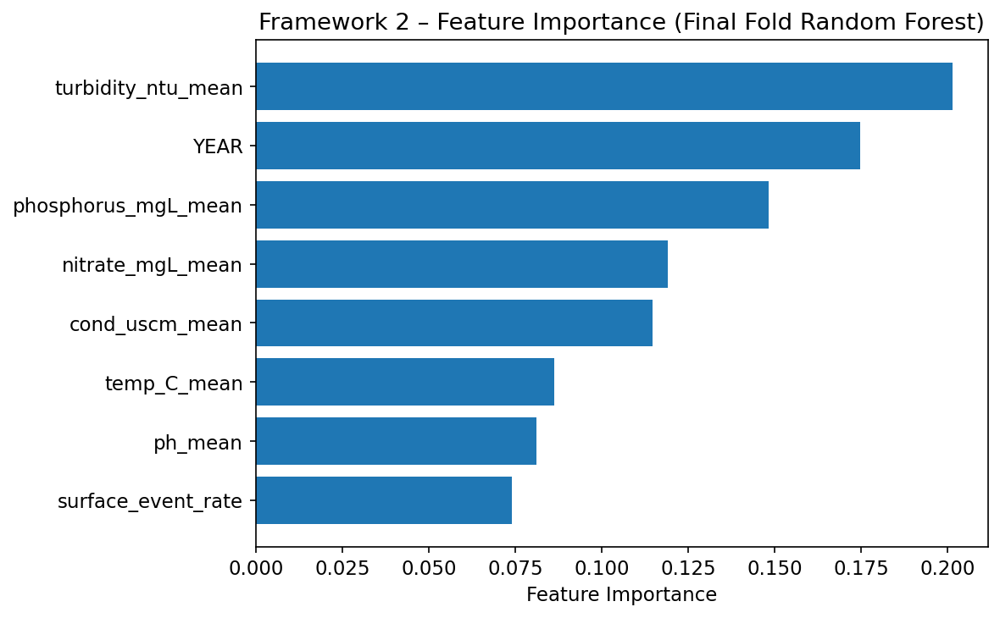

In [139]:
# --- Feature importance plot for Framework 2 yield model ---

importances = rf.feature_importances_
sorted_idx = np.argsort(importances)  # smallest → largest

plt.figure(figsize=(8, 5))
plt.barh(
    [feature_cols[i] for i in sorted_idx],
    importances[sorted_idx]
)
plt.xlabel("Feature Importance")
plt.title("Framework 2 – Feature Importance (Final Fold Random Forest)")
plt.tight_layout()
plt.show()


####Exports

In [140]:
def plot_confusion(cm, class_names, title, cmap="Blues"):
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap,
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.tight_layout()
    plt.show()


In [141]:
def plot_multiclass_confusion_and_roc(
    X,
    y,
    class_names,
    model_name="Framework 2 – Model",
    n_splits=5,
    random_state=42,
    fold_to_plot=2,
):
    X = np.asarray(X)
    y = np.asarray(y)
    n_classes = len(np.unique(y))

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    # --- 1. Second-fold model ---
    fold_idx = 0
    cm_fold = None
    fpr_fold = {}
    tpr_fold = {}
    auc_fold = {}

    for train_idx, test_idx in skf.split(X, y):
        fold_idx += 1
        if fold_idx != fold_to_plot:
            continue

        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]

        rf_fold = RandomForestClassifier(
            n_estimators=300,
            max_depth=None,
            min_samples_leaf=1,
            class_weight="balanced",
            n_jobs=-1,
            random_state=random_state,
        )
        rf_fold.fit(X_tr, y_tr)

        y_pred_fold = rf_fold.predict(X_te)
        y_proba_fold = rf_fold.predict_proba(X_te)

        cm_fold = confusion_matrix(y_te, y_pred_fold)

        # Binarize labels for per-class ROC
        y_test_bin = label_binarize(y_te, classes=range(n_classes))
        for c in range(n_classes):
            fpr_c, tpr_c, _ = roc_curve(y_test_bin[:, c], y_proba_fold[:, c])
            fpr_fold[c] = fpr_c
            tpr_fold[c] = tpr_c
            auc_fold[c] = auc(fpr_c, tpr_c)

        break

    # --- 2. Full refit model ---
    rf_full = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced",
        n_jobs=-1,
        random_state=random_state,
    )
    rf_full.fit(X, y)

    y_pred_full = rf_full.predict(X)
    y_proba_full = rf_full.predict_proba(X)

    cm_full = confusion_matrix(y, y_pred_full)

    y_full_bin = label_binarize(y, classes=range(n_classes))
    fpr_full = {}
    tpr_full = {}
    auc_full = {}

    for c in range(n_classes):
        fpr_c, tpr_c, _ = roc_curve(y_full_bin[:, c], y_proba_full[:, c])
        fpr_full[c] = fpr_c
        tpr_full[c] = tpr_c
        auc_full[c] = auc(fpr_c, tpr_c)

    # --- 3. Plot confusion matrices ---
    plot_confusion(
        cm_fold,
        class_names,
        title=f"{model_name}\nConfusion Matrix – Fold {fold_to_plot}",
    )
    plot_confusion(
        cm_full,
        class_names,
        title=f"{model_name}\nConfusion Matrix – Full Refit",
    )

    # --- 4. Plot per-class ROC curves (fold vs full) ---
    plt.figure(figsize=(7, 5))
    for c in range(n_classes):
        plt.plot(
            fpr_fold[c],
            tpr_fold[c],
            label=f"Fold {fold_to_plot}: {class_names[c]} (AUC = {auc_fold[c]:.3f})",
            linewidth=1.7,
        )
    plt.plot([0, 1], [0, 1], "k:", label="Random baseline")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{model_name}\nPer-Class ROC – Fold {fold_to_plot}")
    plt.legend(loc="lower right", fontsize=8)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(7, 5))
    for c in range(n_classes):
        plt.plot(
            fpr_full[c],
            tpr_full[c],
            label=f"Full refit: {class_names[c]} (AUC = {auc_full[c]:.3f})",
            linewidth=1.7,
        )
    plt.plot([0, 1], [0, 1], "k:", label="Random baseline")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{model_name}\nPer-Class ROC – Full Refit")
    plt.legend(loc="lower right", fontsize=8)
    plt.tight_layout()
    plt.show()

    print(f"{model_name} – Fold {fold_to_plot} per-class AUC:", auc_fold)
    print(f"{model_name} – Full refit per-class AUC:", auc_full)


In [144]:
def plot_multiclass_roc_all_folds_and_full(
    X,
    y,
    class_names,
    model_name="Framework 2 – Model",
    n_splits=5,
    random_state=42,
):
    """
    For a multiclass RF model:
    - runs StratifiedKFold CV
    - computes ROC for each class and each fold
    - fits a full model on all data
    - plots, for each class, all-fold ROC curves + full-refit ROC.
    """
    X = np.asarray(X)
    y = np.asarray(y)
    n_classes = len(np.unique(y))

    skf = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    # Store ROC curves per class per fold
    fpr_folds = {c: [] for c in range(n_classes)}
    tpr_folds = {c: [] for c in range(n_classes)}
    auc_folds = {c: [] for c in range(n_classes)}

    fold_idx = 0
    for train_idx, test_idx in skf.split(X, y):
        fold_idx += 1
        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]

        rf = RandomForestClassifier(
            n_estimators=300,
            max_depth=None,
            min_samples_leaf=1,
            class_weight="balanced",
            n_jobs=-1,
            random_state=random_state,
        )
        rf.fit(X_tr, y_tr)
        y_proba = rf.predict_proba(X_te)

        # binarize true labels for per-class ROC
        y_te_bin = label_binarize(y_te, classes=range(n_classes))
        for c in range(n_classes):
            fpr_c, tpr_c, _ = roc_curve(y_te_bin[:, c], y_proba[:, c])
            auc_c = auc(fpr_c, tpr_c)

            fpr_folds[c].append(fpr_c)
            tpr_folds[c].append(tpr_c)
            auc_folds[c].append(auc_c)

    # ---- Full refit on all data ----
    rf_full = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced",
        n_jobs=-1,
        random_state=random_state,
    )
    rf_full.fit(X, y)
    y_proba_full = rf_full.predict_proba(X)

    y_full_bin = label_binarize(y, classes=range(n_classes))
    fpr_full = {}
    tpr_full = {}
    auc_full = {}
    for c in range(n_classes):
        fpr_c, tpr_c, _ = roc_curve(y_full_bin[:, c], y_proba_full[:, c])
        fpr_full[c] = fpr_c
        tpr_full[c] = tpr_c
        auc_full[c] = auc(fpr_c, tpr_c)

    # ---- Plot per-class ROC: all folds + full model ----
    for c in range(n_classes):
        plt.figure(figsize=(7, 5))

        # all folds
        for i, (fpr_c, tpr_c, auc_c) in enumerate(
            zip(fpr_folds[c], tpr_folds[c], auc_folds[c]), start=1
        ):
            plt.plot(
                fpr_c,
                tpr_c,
                linewidth=1.5,
                label=f"Fold {i} (AUC = {auc_c:.3f})",
            )

        # full refit
        plt.plot(
            fpr_full[c],
            tpr_full[c],
            linestyle="--",
            linewidth=2.2,
            label=f"Full refit (AUC = {auc_full[c]:.3f})",
        )

        # random baseline
        plt.plot([0, 1], [0, 1], "k:", label="Random baseline")

        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(
            f"{model_name}\nROC Curves for All Folds + Full Model – {class_names[c]} class"
        )
        plt.legend(loc="lower right", fontsize=8)
        plt.tight_layout()
        plt.show()

    # quick text summary
    print(f"\n{model_name} – per-class AUC by fold:")
    for c in range(n_classes):
        auc_arr = np.array(auc_folds[c])
        print(
            f"  {class_names[c]}: "
            f"mean AUC = {auc_arr.mean():.3f} ± {auc_arr.std():.3f} "
            f"(folds: {[f'{a:.3f}' for a in auc_arr]})"
        )
    print(f"{model_name} – full-refit per-class AUC:", auc_full)

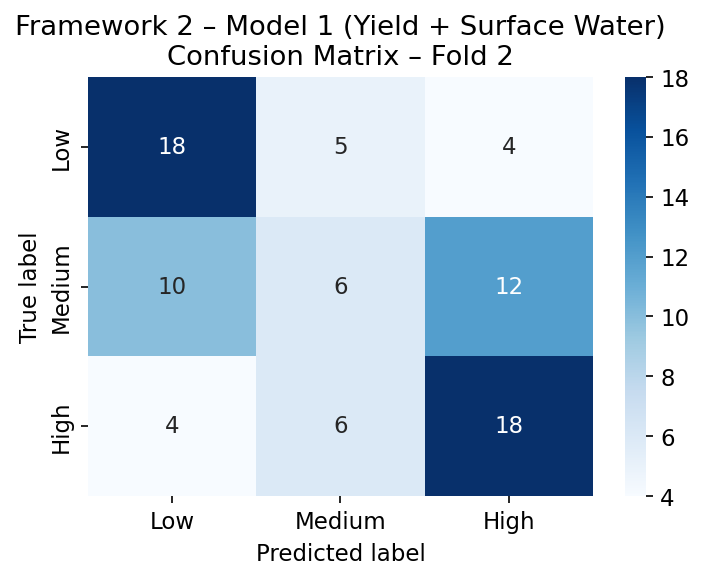

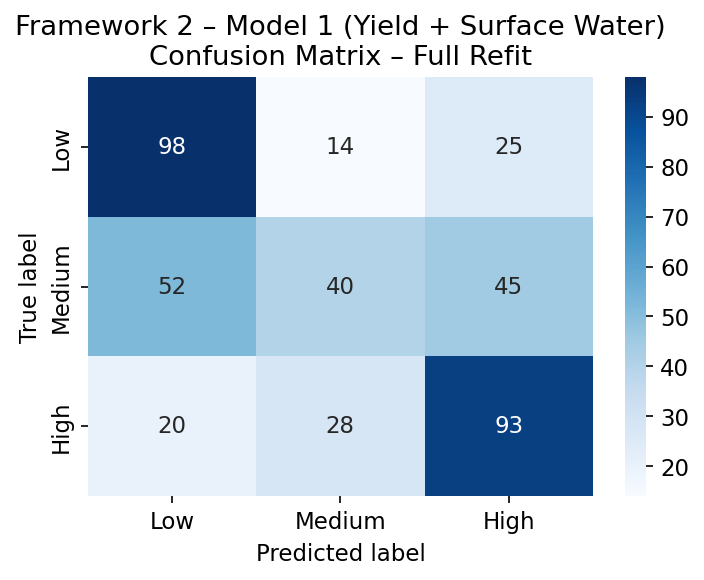

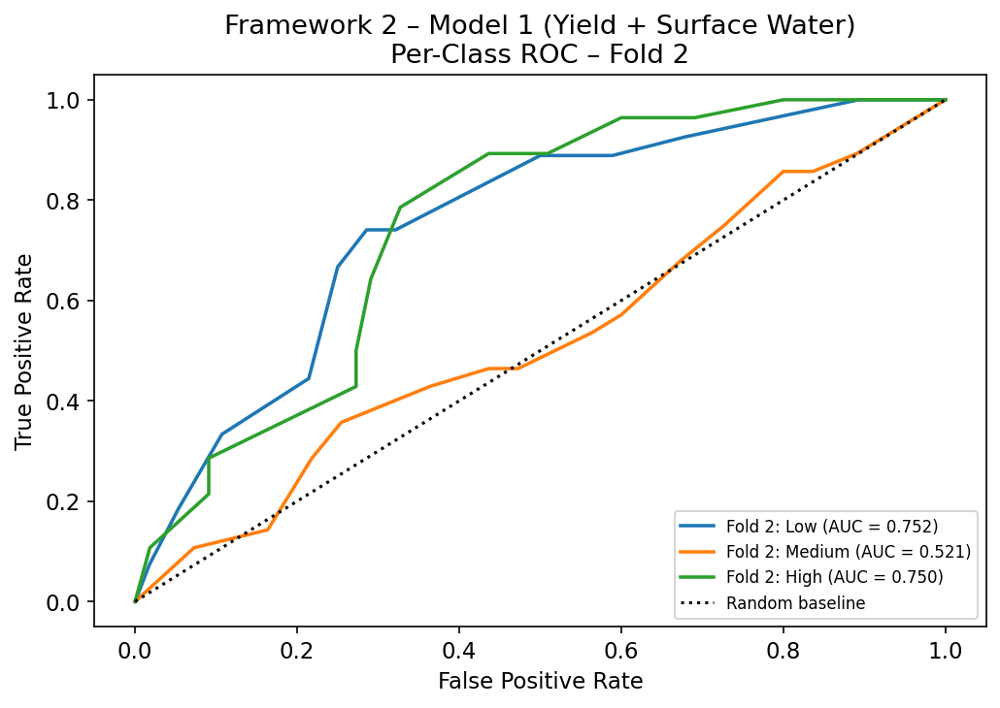

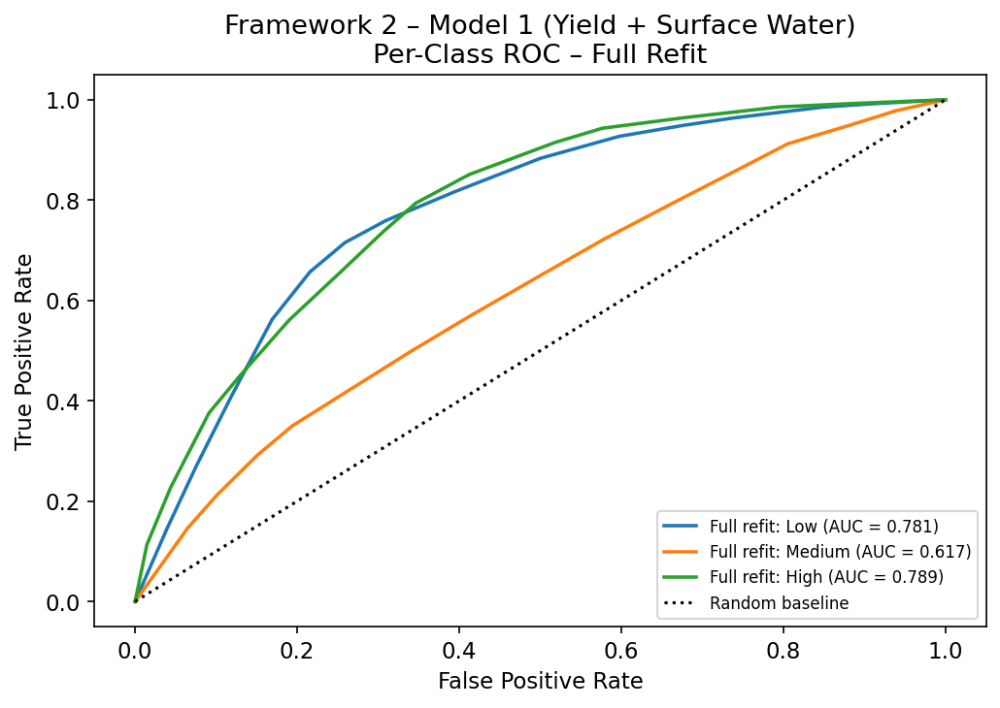

Framework 2 – Model 1 (Yield + Surface Water) – Fold 2 per-class AUC: {0: np.float64(0.7516534391534391), 1: np.float64(0.5214285714285715), 2: np.float64(0.7496753246753247)}
Framework 2 – Model 1 (Yield + Surface Water) – Full refit per-class AUC: {0: np.float64(0.7807724623221132), 1: np.float64(0.6173528330620175), 2: np.float64(0.788968266293938)}


In [142]:
# Assuming model_use, feature_cols, and y_yield already defined as in your notebook
X_yield_surface = model_use[feature_cols].values
y_yield_surface = model_use["y_yield"].astype(int).values

class_names_yield = ["Low", "Medium", "High"]

plot_multiclass_confusion_and_roc(
    X=X_yield_surface,
    y=y_yield_surface,
    class_names=class_names_yield,
    model_name="Framework 2 – Model 1 (Yield + Surface Water)",
)

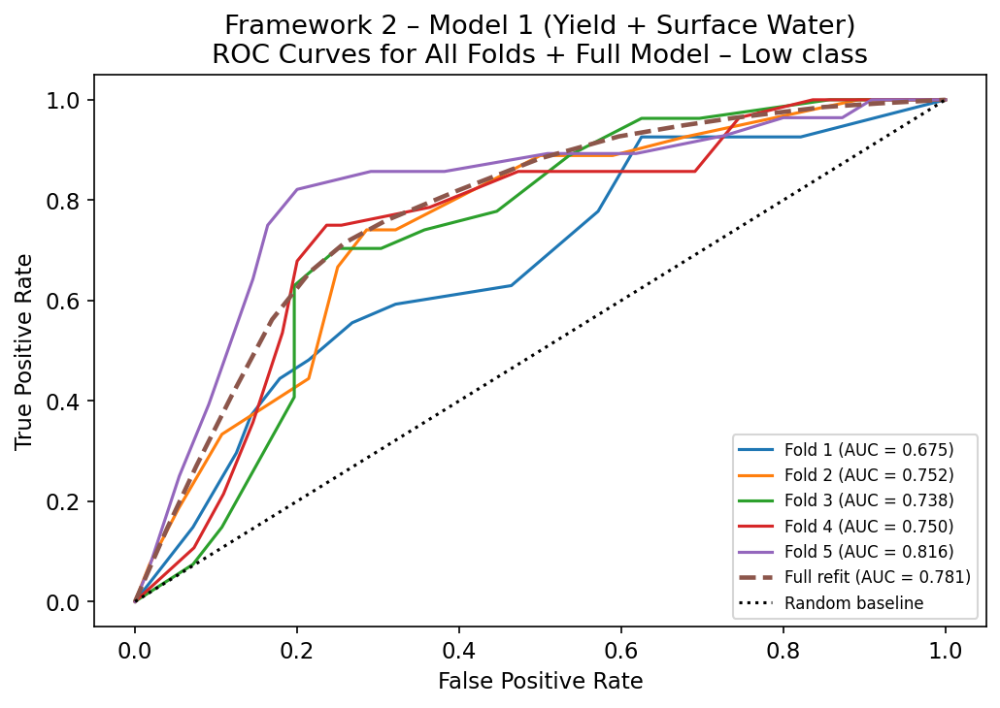

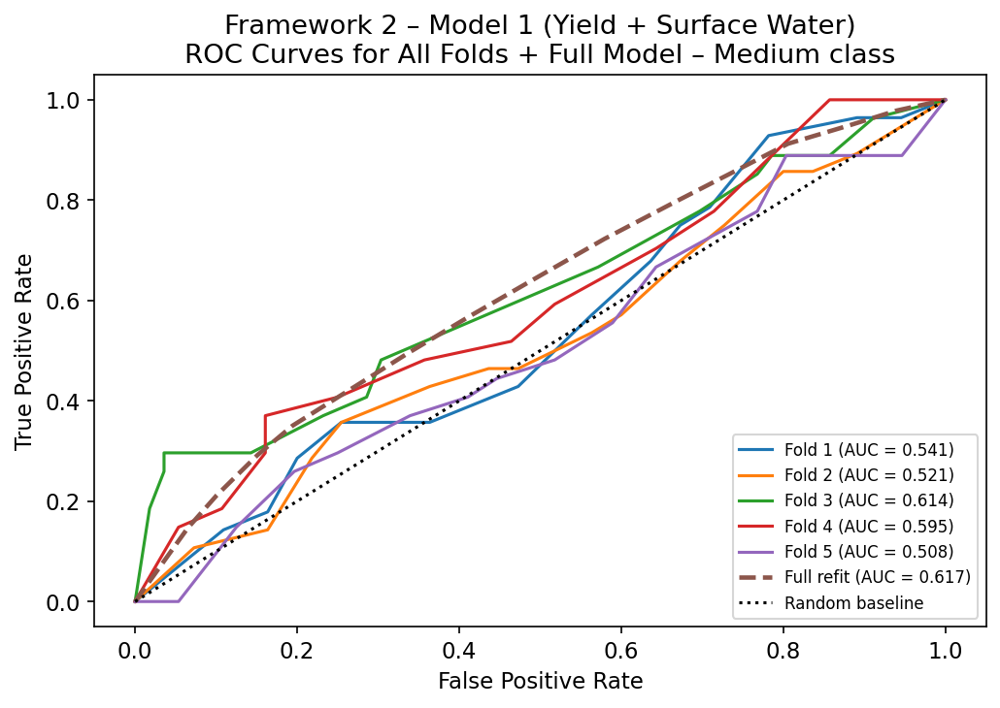

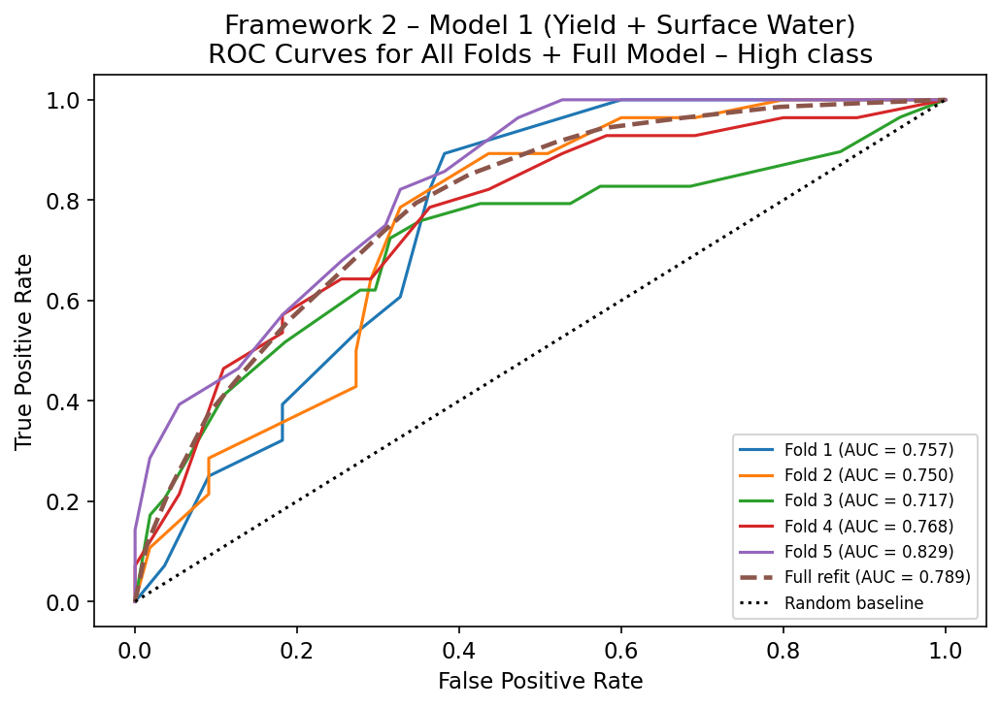


Framework 2 – Model 1 (Yield + Surface Water) – per-class AUC by fold:
  Low: mean AUC = 0.746 ± 0.045 (folds: ['0.675', '0.752', '0.738', '0.750', '0.816'])
  Medium: mean AUC = 0.556 ± 0.042 (folds: ['0.541', '0.521', '0.614', '0.595', '0.508'])
  High: mean AUC = 0.764 ± 0.037 (folds: ['0.757', '0.750', '0.717', '0.768', '0.829'])
Framework 2 – Model 1 (Yield + Surface Water) – full-refit per-class AUC: {0: np.float64(0.7807724623221132), 1: np.float64(0.6173528330620175), 2: np.float64(0.788968266293938)}


In [145]:
# Framework 2 – Model 1
X_yield_surface = model_use[feature_cols].values
y_yield_surface = model_use["y_yield"].astype(int).values
class_names_yield = ["Low", "Medium", "High"]

plot_multiclass_roc_all_folds_and_full(
    X=X_yield_surface,
    y=y_yield_surface,
    class_names=class_names_yield,
    model_name="Framework 2 – Model 1 (Yield + Surface Water)",
)

Yield panel shape (county-year, corn grain): (415, 5)
y_yield
2    141
1    137
0    137
Name: count, dtype: int64
Annual water-quality table: (114, 8)
Feature columns: ['YEAR', 'temp_C_mean', 'turbidity_ntu_mean', 'ph_mean', 'cond_uscm_mean', 'nitrate_mgL_mean', 'phosphorus_mgL_mean', 'surface_event_rate']
Modeling dataset shape: (415, 8)
Class counts (0=Low,1=Med,2=High): [137 137 141]
Fold 1: RF F1=0.465, AUC=0.658  |  Dummy F1=0.168, AUC=0.500
Fold 2: RF F1=0.486, AUC=0.674  |  Dummy F1=0.168, AUC=0.500
Fold 3: RF F1=0.540, AUC=0.690  |  Dummy F1=0.173, AUC=0.500
Fold 4: RF F1=0.516, AUC=0.704  |  Dummy F1=0.168, AUC=0.500
Fold 5: RF F1=0.554, AUC=0.718  |  Dummy F1=0.168, AUC=0.500

--- Cross-validated performance (Yield model) ---
RF    Macro F1:  0.512 ± 0.033
RF    Macro AUC: 0.689 ± 0.021
Dummy Macro F1:  0.169 ± 0.002
Dummy Macro AUC: 0.500 ± 0.000
Export dir: framework2_model1_yield_exports


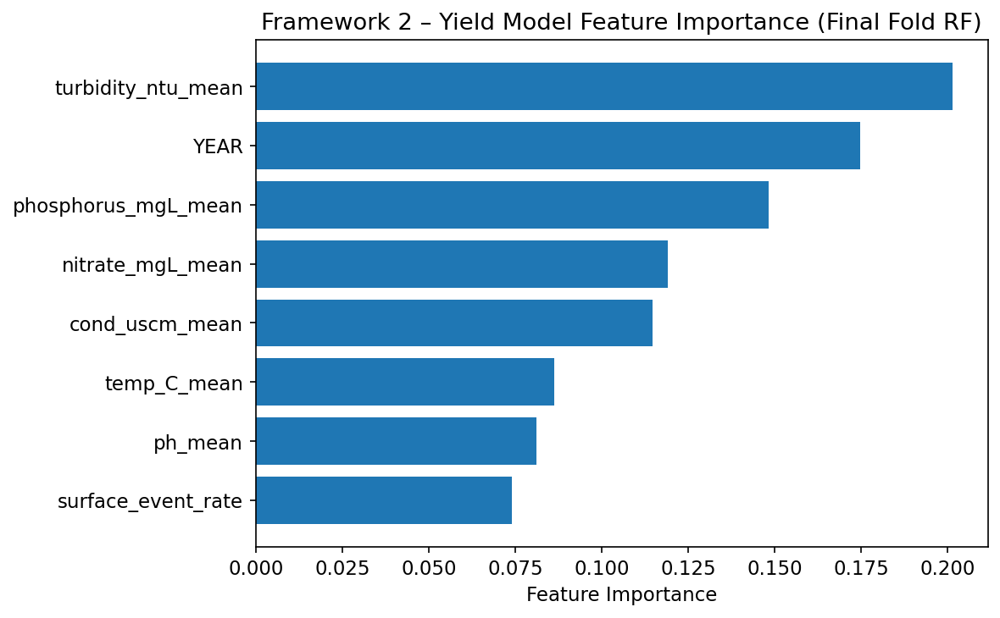

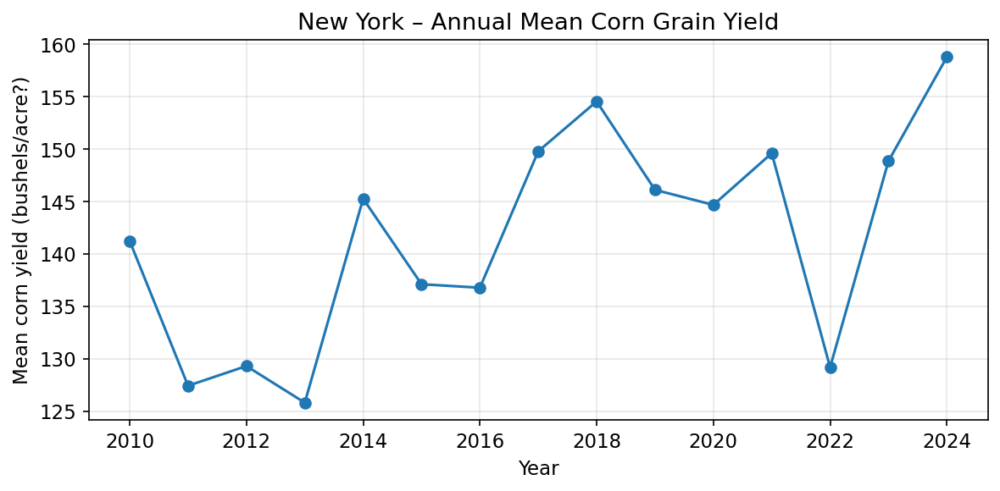

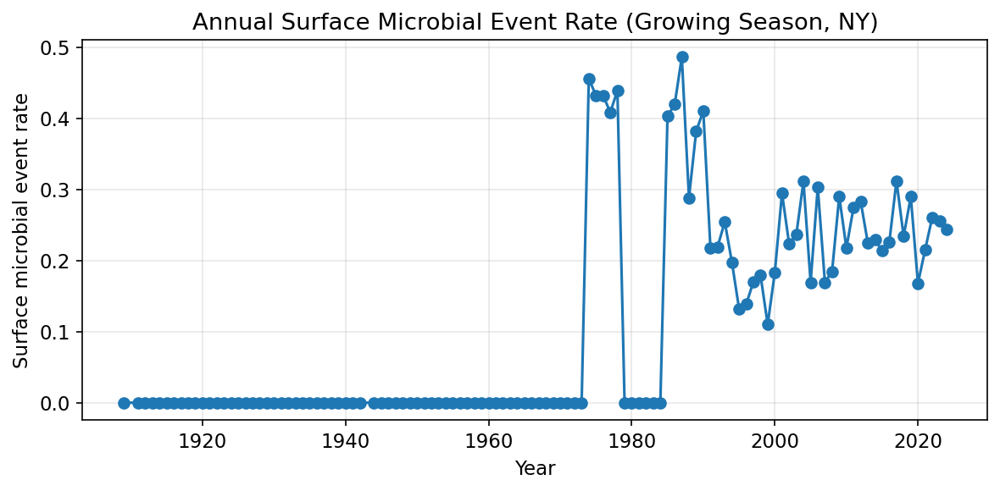

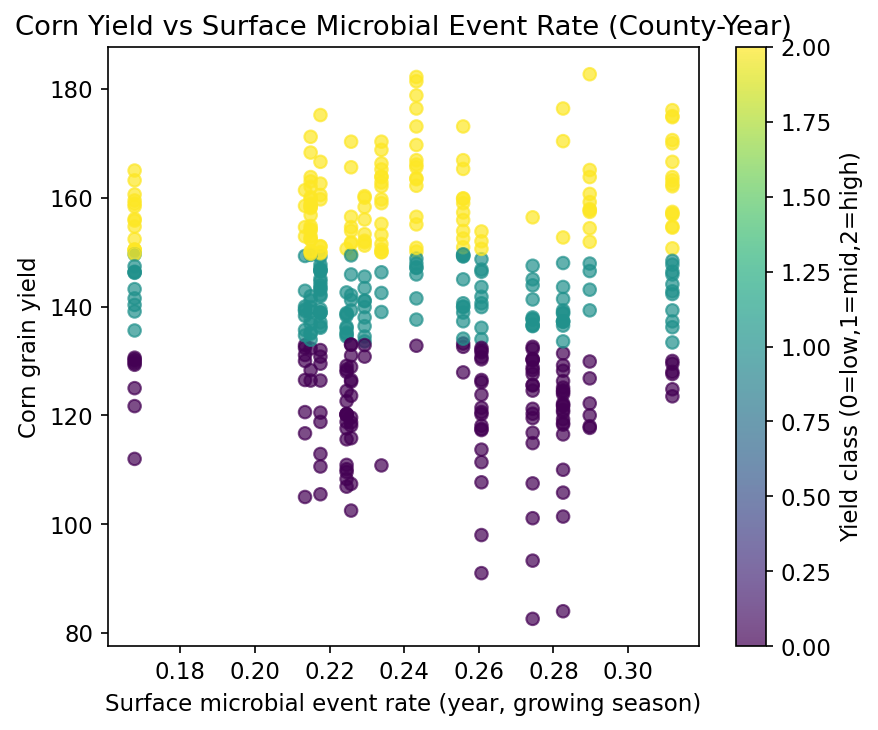

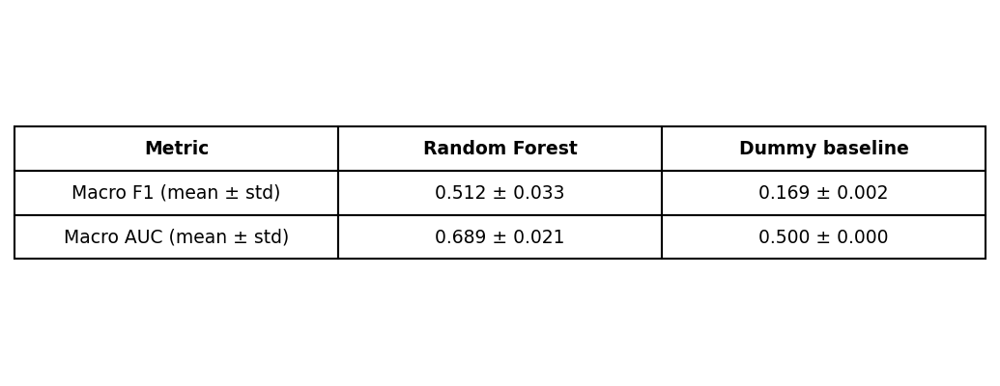

Created zip: framework2_model1_yield_bundle.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [143]:
from google.colab import files as colab_files  # avoid name clash


# ===== 2. Load USDA NASS & build corn grain yield panel =====

usda_path = DATA_ROOT / "USDA_NASS_Regional_Crop_Yield" / "USDA_Regional_Crop_Yield_Data.csv"

# Parse HTML table(s) from the saved file
usda_tables = pd.read_html(usda_path, header=0)
df_usda_raw = usda_tables[0]

df_y = df_usda_raw.copy()
df_y.columns = [c.upper() for c in df_y.columns]  # normalize

# NY + county
mask = (
    (df_y["STATE"].str.upper() == "NEW YORK") &
    (df_y["GEO LEVEL"].str.upper() == "COUNTY")
)
df_y = df_y.loc[mask].copy()

# Clean numeric VALUE
df_y["VALUE_NUM"] = (
    df_y["VALUE"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .replace({
        "(D)": np.nan, "(L)": np.nan, "(Z)": np.nan,
        "(NA)": np.nan, "": np.nan
    })
)
df_y["VALUE_NUM"] = pd.to_numeric(df_y["VALUE_NUM"], errors="coerce")
df_y = df_y.dropna(subset=["VALUE_NUM"]).copy()

# Corn only
target_commodity = "CORN"
corn = df_y[df_y["COMMODITY"] == target_commodity].copy()
corn["YEAR"] = pd.to_numeric(corn["YEAR"], errors="coerce")
corn = corn.dropna(subset=["YEAR"]).copy()
corn["YEAR"] = corn["YEAR"].astype(int)

# Only rows with YIELD in DATA ITEM
yield_rows = corn[corn["DATA ITEM"].str.contains("YIELD", case=False, na=False)].copy()

def simplify_corn_item(s):
    s = str(s).upper()
    if "GRAIN" in s and "YIELD" in s:
        return "GRAIN_YIELD"
    if "SILAGE" in s and "YIELD" in s:
        return "SILAGE_YIELD"
    return "OTHER_YIELD"

yield_rows["DATA_ITEM_SIMPLE"] = yield_rows["DATA ITEM"].apply(simplify_corn_item)

# Prefer grain yield if available
if (yield_rows["DATA_ITEM_SIMPLE"] == "GRAIN_YIELD").any():
    yield_rows = yield_rows[yield_rows["DATA_ITEM_SIMPLE"] == "GRAIN_YIELD"].copy()

# Aggregate to one yield per (YEAR, COUNTY)
yield_panel = (
    yield_rows
    .groupby(["YEAR", "COUNTY", "COMMODITY"], as_index=False)["VALUE_NUM"]
    .mean()
)

# Clean county names
yield_panel["COUNTY_NAME"] = (
    yield_panel["COUNTY"]
    .astype(str)
    .str.upper()
    .str.replace(" COUNTY", "", regex=False)
    .str.strip()
)

yield_panel = yield_panel.rename(columns={"VALUE_NUM": "YIELD"})
panel = yield_panel[["YEAR", "COUNTY_NAME", "COMMODITY", "YIELD"]].copy()
panel = panel.dropna(subset=["YIELD"]).copy()

# Tertile-based yield classes
q = panel["YIELD"].quantile([0.33, 0.66])
q_low, q_high = q.loc[0.33], q.loc[0.66]

def categorize_yield(v):
    if v < q_low:
        return 0
    elif v < q_high:
        return 1
    else:
        return 2

panel["y_yield"] = panel["YIELD"].apply(categorize_yield)

print("Yield panel shape (county-year, corn grain):", panel.shape)
print(panel["y_yield"].value_counts())


# ===== 3. Build annual surface water quality features (Framework 2 surf table) =====

surf = surface_unified_monthly.copy()  # assumes already defined
surf["year"] = surf["month_start"].dt.year
surf["month_num"] = surf["month_start"].dt.month

# Growing season only (Apr–Sep)
growing = surf[surf["month_num"].between(4, 9)].copy()

wq_feature_cols = [
    "temp_C_mean",
    "turbidity_ntu_mean",
    "ph_mean",
    "cond_uscm_mean",
    "nitrate_mgL_mean",
    "phosphorus_mgL_mean",
    "y_surface",  # event rate
]
wq_feature_cols = [c for c in wq_feature_cols if c in growing.columns]

annual_wq = (
    growing
    .groupby("year")[wq_feature_cols]
    .mean()
    .rename(columns={"y_surface": "surface_event_rate"})
    .reset_index()
)

print("Annual water-quality table:", annual_wq.shape)


# ===== 4. Modeling dataframe: join yield + WQ, build features =====

panel["YEAR"] = panel["YEAR"].astype(int)
annual_wq["year"] = annual_wq["year"].astype(int)

model_df = panel.merge(
    annual_wq,
    left_on="YEAR",
    right_on="year",
    how="left"
)

if "year" in model_df.columns:
    model_df = model_df.drop(columns=["year"])

feature_cols_wq = [c for c in annual_wq.columns if c != "year"]
feature_cols_wq = [c for c in feature_cols_wq if c in model_df.columns]
feature_cols = ["YEAR"] + feature_cols_wq

print("Feature columns:", feature_cols)

model_use = model_df.dropna(subset=["y_yield"]).copy()
model_use = model_use.dropna(subset=feature_cols, how="all").copy()

X = model_use[feature_cols].values
y = model_use["y_yield"].astype(int).values

print("Modeling dataset shape:", X.shape)
print("Class counts (0=Low,1=Med,2=High):", np.bincount(y))


# ===== 5. Model training: RF vs Dummy, 5-fold CV =====

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

f1_rf, f1_dummy = [], []
auc_rf, auc_dummy = [], []

fold = 0
for train_idx, test_idx in skf.split(X, y):
    fold += 1
    X_tr, X_te = X[train_idx], X[test_idx]
    y_tr, y_te = y[train_idx], y[test_idx]

    # Dummy baseline
    dummy = DummyClassifier(strategy="most_frequent")
    dummy.fit(X_tr, y_tr)
    y_dummy_pred = dummy.predict(X_te)
    y_dummy_proba = dummy.predict_proba(X_te)

    f1_d = f1_score(y_te, y_dummy_pred, average="macro")
    y_te_onehot = pd.get_dummies(y_te)
    auc_d = roc_auc_score(
        y_te_onehot, y_dummy_proba,
        average="macro", multi_class="ovr"
    )

    f1_dummy.append(f1_d)
    auc_dummy.append(auc_d)

    # RandomForest
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_leaf=1,
        class_weight="balanced",
        random_state=42,
        n_jobs=-1,
    )
    rf.fit(X_tr, y_tr)
    y_rf_pred = rf.predict(X_te)
    y_rf_proba = rf.predict_proba(X_te)

    f1_r = f1_score(y_te, y_rf_pred, average="macro")
    auc_r = roc_auc_score(
        y_te_onehot, y_rf_proba,
        average="macro", multi_class="ovr"
    )

    f1_rf.append(f1_r)
    auc_rf.append(auc_r)

    print(
        f"Fold {fold}: "
        f"RF F1={f1_r:.3f}, AUC={auc_r:.3f}  |  "
        f"Dummy F1={f1_d:.3f}, AUC={auc_d:.3f}"
    )

print("\n--- Cross-validated performance (Yield model) ---")
print(f"RF    Macro F1:  {np.mean(f1_rf):.3f} ± {np.std(f1_rf):.3f}")
print(f"RF    Macro AUC: {np.mean(auc_rf):.3f} ± {np.std(auc_rf):.3f}")
print(f"Dummy Macro F1:  {np.mean(f1_dummy):.3f} ± {np.std(f1_dummy):.3f}")
print(f"Dummy Macro AUC: {np.mean(auc_dummy):.3f} ± {np.std(auc_dummy):.3f}")

summary_yield = {
    "rf_macro_f1_mean": float(np.mean(f1_rf)),
    "rf_macro_f1_std":  float(np.std(f1_rf)),
    "rf_macro_auc_mean": float(np.mean(auc_rf)),
    "rf_macro_auc_std":  float(np.std(auc_rf)),
    "dummy_macro_f1_mean": float(np.mean(f1_dummy)),
    "dummy_macro_f1_std":  float(np.std(f1_dummy)),
    "dummy_macro_auc_mean": float(np.mean(auc_dummy)),
    "dummy_macro_auc_std":  float(np.std(auc_dummy)),
    "class_counts": np.bincount(y).tolist(),
    "n_samples": int(len(y)),
    "n_splits": 5,
}

# Feature importance (last RF)
importances = rf.feature_importances_
sorted_idx = np.argsort(importances)


# ===== 6. Export directory =====
EXPORT_DIR = Path("framework2_model1_yield_exports")
EXPORT_DIR.mkdir(exist_ok=True)
print("Export dir:", EXPORT_DIR)


# ===== 7. PNG plots =====

# 7.1 Feature importance
plt.figure(figsize=(8, 5))
plt.barh(
    [feature_cols[i] for i in sorted_idx],
    importances[sorted_idx]
)
plt.xlabel("Feature Importance")
plt.title("Framework 2 – Yield Model Feature Importance (Final Fold RF)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "feature_importance_yield_model.png", dpi=300)
plt.show()

# 7.2 Annual mean yield (state-level)
annual_yield = (
    panel.groupby("YEAR")["YIELD"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(8,4))
plt.plot(annual_yield["YEAR"], annual_yield["YIELD"], marker="o")
plt.xlabel("Year")
plt.ylabel("Mean corn yield (bushels/acre?)")
plt.title("New York – Annual Mean Corn Grain Yield")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(EXPORT_DIR / "annual_mean_corn_yield.png", dpi=300)
plt.show()

# 7.3 Annual surface event rate (from annual_wq)
plt.figure(figsize=(8,4))
plt.plot(annual_wq["year"], annual_wq["surface_event_rate"], marker="o")
plt.xlabel("Year")
plt.ylabel("Surface microbial event rate")
plt.title("Annual Surface Microbial Event Rate (Growing Season, NY)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(EXPORT_DIR / "annual_surface_event_rate.png", dpi=300)
plt.show()

# 7.4 Scatter: yield vs surface event rate (county-year)
scatter_df = model_use.dropna(subset=["YIELD", "surface_event_rate"]).copy()

plt.figure(figsize=(6,5))
sc = plt.scatter(
    scatter_df["surface_event_rate"],
    scatter_df["YIELD"],
    c=scatter_df["y_yield"],
    cmap="viridis",
    alpha=0.7
)
plt.xlabel("Surface microbial event rate (year, growing season)")
plt.ylabel("Corn grain yield")
plt.title("Corn Yield vs Surface Microbial Event Rate (County-Year)")
plt.colorbar(sc, label="Yield class (0=low,1=mid,2=high)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "scatter_yield_vs_surface_event_rate.png", dpi=300)
plt.show()


# ===== 8. Training results table: CSV + PNG + JSON =====

results_table = pd.DataFrame(
    {
        "Metric": [
            "Macro F1 (mean ± std)",
            "Macro AUC (mean ± std)",
        ],
        "Random Forest": [
            f"{summary_yield['rf_macro_f1_mean']:.3f} ± {summary_yield['rf_macro_f1_std']:.3f}",
            f"{summary_yield['rf_macro_auc_mean']:.3f} ± {summary_yield['rf_macro_auc_std']:.3f}",
        ],
        "Dummy baseline": [
            f"{summary_yield['dummy_macro_f1_mean']:.3f} ± {summary_yield['dummy_macro_f1_std']:.3f}",
            f"{summary_yield['dummy_macro_auc_mean']:.3f} ± {summary_yield['dummy_macro_auc_std']:.3f}",
        ],
    }
)

# CSV
results_table.to_csv(EXPORT_DIR / "model1_yield_training_results_table.csv", index=False)

# PNG pretty table
fig, ax = plt.subplots(figsize=(7, 2.8))
ax.axis("off")

table_data = [results_table.columns.tolist()] + results_table.values.tolist()
table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.6)

for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(EXPORT_DIR / "model1_yield_training_results_table.png", dpi=300, bbox_inches="tight")
plt.show()

# Raw JSON summary
with open(EXPORT_DIR / "model1_yield_training_results.json", "w") as f:
    json.dump(summary_yield, f, indent=2)


# ===== 9. Graph series JSON for re-creation =====

graphs_json = {}

graphs_json["annual_mean_corn_yield"] = {
    "year": annual_yield["YEAR"].astype(int).tolist(),
    "mean_yield": annual_yield["YIELD"].tolist(),
    "title": "New York – Annual Mean Corn Grain Yield",
    "y_label": "Mean yield",
}

graphs_json["annual_surface_event_rate"] = {
    "year": annual_wq["year"].astype(int).tolist(),
    "surface_event_rate": annual_wq["surface_event_rate"].tolist(),
    "title": "Annual Surface Microbial Event Rate (Growing Season, NY)",
    "y_label": "Surface event rate",
}

graphs_json["yield_vs_surface_event_rate"] = {
    "surface_event_rate": scatter_df["surface_event_rate"].tolist(),
    "yield": scatter_df["YIELD"].tolist(),
    "yield_class": scatter_df["y_yield"].astype(int).tolist(),
    "title": "Corn Yield vs Surface Microbial Event Rate (County-Year)",
    "x_label": "Surface microbial event rate",
    "y_label": "Corn grain yield",
}

with open(EXPORT_DIR / "framework2_model1_yield_graph_data.json", "w") as f:
    json.dump(graphs_json, f, indent=2)


# ===== 10. Zip everything & download =====

zip_path = "framework2_model1_yield_bundle.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    for root, dirs, filenames in os.walk(EXPORT_DIR):
        for fname in filenames:
            full_path = Path(root) / fname
            rel_path = full_path.relative_to(EXPORT_DIR)
            zf.write(full_path, arcname=rel_path)

print("Created zip:", zip_path)
colab_files.download(zip_path)

###Model 2

In [146]:
def build_annual_numeric_panel(df, date_col, prefix):
    """
    Generic helper: take a water-quality dataframe with a date column,
    compute annual means of all numeric columns, prefix their names,
    and return a tidy (year, features...) table.
    """
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])
    df["year"] = df[date_col].dt.year

    # Keep only numeric columns
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if "year" not in num_cols:
        num_cols = ["year"] + num_cols

    annual = (
        df[num_cols]
        .groupby("year")
        .mean()
        .reset_index()
    )

    # Prefix feature columns (but not 'year')
    new_cols = ["year"] + [f"{prefix}{c}" for c in annual.columns if c != "year"]
    annual.columns = new_cols

    return annual

In [147]:
ws_path = DATA_ROOT / "NYC_DEP_Watershed_WQ" / "Watershed_Water_Quality_Data.csv"
ws_raw = pd.read_csv(ws_path, low_memory=False)
print("Watershed WQ shape:", ws_raw.shape)
print(ws_raw.columns[:20])

# Try common date column names – adjust if needed once you see the printout
candidate_dates = ["sample_date", "SampleDate", "SAMPLE_DATE", "date", "DATE"]
date_col = None
for c in candidate_dates:
    if c in ws_raw.columns:
        date_col = c
        break

if date_col is None:
    raise ValueError("Could not find a date column in Watershed WQ; adjust candidate_dates manually.")

ws_annual = build_annual_numeric_panel(ws_raw, date_col=date_col, prefix="ws_")
print("Watershed annual panel:", ws_annual.shape)
ws_annual.head()

Watershed WQ shape: (4047, 10)
Index(['site', 'date', 'turbidity_ntu_at_12am', 'turbidity_ntu_at_4am',
       'turbidity_ntu_at_8am', 'turbidity_ntu_at_12pm', 'turbidity_ntu_at_4pm',
       'turbidity_ntu_at_8pm', 'average_24hrturbidity_ntu',
       'coliform_fecal_fc_100ml'],
      dtype='object')
Watershed annual panel: (11, 8)


,year,ws_turbidity_ntu_at_12am,ws_turbidity_ntu_at_4am,ws_turbidity_ntu_at_8am,ws_turbidity_ntu_at_12pm,ws_turbidity_ntu_at_4pm,ws_turbidity_ntu_at_8pm,ws_average_24hrturbidity_ntu
0,2015,0.759363,0.761070,0.769815,0.750000,0.752602,0.765056,0.760406
1,2016,0.779672,0.775567,0.777708,0.769924,0.785443,0.785823,0.780000
2,2017,0.771646,0.770202,0.769066,0.775190,0.765823,0.768734,0.770859
3,2018,0.830153,0.826523,0.825127,0.822265,0.831934,0.836768,0.829949
4,2019,0.726452,0.722671,0.733162,0.725773,0.728351,0.729485,0.728686


In [148]:
pb20_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2020" / "LIPineBarrens_2020_DataRelease.xlsx"
pb21_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2021" / "LIPineBarrens_2021_DataRelease.xlsx"
pb22_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2022" / "LIPineBarrens_2022_DataRelease.xlsx"

xl20 = pd.ExcelFile(pb20_xlsx)
xl21 = pd.ExcelFile(pb21_xlsx)
xl22 = pd.ExcelFile(pb22_xlsx)

print("Pine Barrens 2020 sheet names:", xl20.sheet_names)
print("Pine Barrens 2021 sheet names:", xl21.sheet_names)
print("Pine Barrens 2022 sheet names:", xl22.sheet_names)

Pine Barrens 2020 sheet names: ['TOC', 'Site List', 'References', 'Analyte List', 'Field', 'Nutrients', 'Inorganics', 'Pesticides', 'Pesticide Field-Spike', 'Pharmaceuticals', 'GW levels', 'GW levels recorder']
Pine Barrens 2021 sheet names: ['TOC', 'Site List', 'References', 'Analyte List', 'Field', 'Nutrients', 'Inorganics', 'Pesticides', 'Pharmaceuticals', 'GW levels', 'GW levels, recorder']
Pine Barrens 2022 sheet names: ['TOC', 'Site List', 'References', 'Analyte List', 'Field', 'Nutrients', 'Inorganics', 'Pesticides', 'Pesticide Field-Spike', 'Pharmaceuticals', 'GW levels', 'GW levels, recorder']


In [149]:
pb20_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2020" / "LIPineBarrens_2020_DataRelease.xlsx"

df_raw = pd.read_excel(pb20_xlsx, sheet_name="Field", header=None)
df_raw.head(40)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,"Citation: Bayraktar, B.N., Fisher, I.J., and S...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Field data collected during the time of sample...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,USGS Station Number,USGS Station Name,Field Name,Sample Date,Air temperature,Dissolved oxygen,pH,Specific conductance,Water temperature,Turbidity,Stream Width,Velocity,Water Depth
3,NaN,NaN,NaN,NaN,degrees celsius,mg/L,standard units,uS/cm @ 25 degrees celsius,degrees celsius,FNU,ft,ft/sec,ft
4,01304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2019-11-04 00:00:00,--,9.2,6.4,72,9.9,5.4,22,1.67,--
5,01304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2020-06-02 00:00:00,21.6,6.6,6.6,90,19.6,3.6,20,0.62,0.6
6,01304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04 00:00:00,14.4,10.2,6.7,170,10.8,0.9,61,1.1,--
7,01304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2020-06-02 00:00:00,20,8.2,6.7,163,20.1,1.3,60,0.88,1
8,01304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2019-11-05 00:00:00,14.4,5.9,6,150,8.6,1,6,--,0.9
9,01304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2020-02-20 00:00:00,0,10.2,6.2,189,3.6,0.4,4,--,0.9


In [164]:
def load_pine_sheet(xlsx_path, sheet_name):
    # Skip metadata rows (0,1) and the units row (3)
    df = pd.read_excel(
        xlsx_path,
        sheet_name=sheet_name,
        skiprows=[0, 1, 3]
    )
    return df

pb20_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2020" / "LIPineBarrens_2020_DataRelease.xlsx"
pb21_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2021" / "LIPineBarrens_2021_DataRelease.xlsx"
pb22_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2022" / "LIPineBarrens_2022_DataRelease.xlsx"

# Load "Field" sheet for all years
pb20_field = load_pine_sheet(pb20_xlsx, "Field")
pb21_field = load_pine_sheet(pb21_xlsx, "Field")
pb22_field = load_pine_sheet(pb22_xlsx, "Field")

print("pb20_field shape (cleaned):", pb20_field.shape)
print("pb21_field shape (cleaned):", pb21_field.shape)
print("pb22_field shape (cleaned):", pb22_field.shape)


pb20_field.head()

pb20_field shape (cleaned): (24, 13)
pb21_field shape (cleaned): (24, 13)
pb22_field shape (cleaned): (24, 13)


,USGS Station Number,USGS Station Name,Field Name,Sample Date,Air temperature,Dissolved oxygen,pH,Specific conductance,Water temperature,Turbidity,Stream Width,Velocity,Water Depth
0,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2019-11-04,--,9.2,6.4,72,9.9,5.4,22,1.67,--
1,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2020-06-02,21.6,6.6,6.6,90,19.6,3.6,20,0.62,0.6
2,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,14.4,10.2,6.7,170,10.8,0.9,61,1.1,--
3,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2020-06-02,20,8.2,6.7,163,20.1,1.3,60,0.88,1
4,1304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2019-11-05,14.4,5.9,6.0,150,8.6,1.0,6,--,0.9


In [151]:
def build_annual_numeric_panel(df, date_col, prefix):
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df["year"] = df[date_col].dt.year

    # keep only numeric columns + year
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if "year" not in num_cols:
        num_cols = ["year"] + num_cols

    annual = (
        df[num_cols]
        .groupby("year")
        .mean()
        .reset_index()
    )

    new_cols = ["year"] + [
        f"{prefix}{c}" for c in annual.columns if c != "year"
    ]
    annual.columns = new_cols

    return annual

In [152]:
pb20_field_annual = build_annual_numeric_panel(
    pb20_field,
    date_col="Sample Date",
    prefix="pine20_field_"
)

pb21_field_annual = build_annual_numeric_panel(
    pb21_field,
    date_col="Sample Date",
    prefix="pine21_field_"
)

pb22_field_annual = build_annual_numeric_panel(
    pb22_field,
    date_col="Sample Date",
    prefix="pine22_field_"
)


pb20_field_annual, pb21_field_annual, pb22_field_annual

(   year  pine20_field_USGS Station Number  pine20_field_Dissolved oxygen  \
 0  2019                      1.304852e+06                       9.400000   
 1  2020                      1.304942e+06                       9.188235   
 
    pine20_field_pH  pine20_field_Specific conductance  \
 0         6.600000                         171.571429   
 1         6.641176                         187.000000   
 
    pine20_field_Water temperature  pine20_field_Turbidity  
 0                       10.157143                1.942857  
 1                       15.782353                1.282353  ,
    year  pine21_field_USGS Station Number
 0  2020                      1.304852e+06
 1  2021                      1.304942e+06,
    year  pine22_field_USGS Station Number  pine22_field_Air temperature  \
 0  2021                      1.304852e+06                     12.142857   
 1  2022                      1.304942e+06                     23.029412   
 
    pine22_field_Dissolved oxygen  pine22_field

In [153]:
# Load all major Pine Barrens sheets for 2020–2022

pine_sheets = ["Nutrients", "Inorganics", "Pesticides", "Pharmaceuticals", "GW levels"]

pb20_all = {}
pb21_all = {}
pb22_all = {}

for sh in pine_sheets:
    pb20_all[sh] = load_pine_sheet(pb20_xlsx, sh)
    pb21_all[sh] = load_pine_sheet(pb21_xlsx, sh)
    pb22_all[sh] = load_pine_sheet(pb22_xlsx, sh)

# Peek at the columns to confirm
for sh in pine_sheets:
    print(f"\n--- Pine 2020 {sh} columns ---")
    print(pb20_all[sh].columns.tolist()[:20])



--- Pine 2020 Nutrients columns ---
['USGS Station Number', 'USGS Station Name', 'Field Name', 'Sample Date', 'Notes', 'Ammonia (NH3 + NH4+)', 'Nitrate plus nitrite', 'Nitrite', 'Orthophosphate', 'Phosphorus', 'Phosphorus, unfiltered', 'Total nitrogen', 'Total nitrogen, unfiltered']

--- Pine 2020 Inorganics columns ---
['USGS Station Number', 'USGS Station Name', 'Field Name', 'Sample Date', 'Notes', 'Alkalinity', 'Aluminum', 'Antimony', 'Arsenic', 'Barium', 'Beryllium', 'Boron', 'Bromide', 'Cadmium', 'Calcium', 'Chloride', 'Chromium', 'Cobalt', 'Copper', 'Dissolved solids']

--- Pine 2020 Pesticides columns ---
['USGS Station Number', 'USGS Station Name', 'Field Name', 'Sample Date', 'Notes', '1H-1,2,4-Triazole', '2-(1-Hydroxyethyl)-6-methylaniline', '2,4-D', '2-[(2-Ethyl-6-methylphenyl)amino]-1-propanol', '2-Aminobenzimidazole', '2-Amino-N-isopropylbenzamide', "2-Chloro-2',6'-diethylacetanilide", '2-Chloro-4-isopropylamino-6-amino-s-triazine', '2-Chloro-6-ethylamino-4-amino-s-triaz

In [154]:
# --- Load all Pine sheets for 2020–2022 with correct skiprows ---

pine_sheets = ["Field", "Nutrients", "Inorganics", "Pesticides", "Pharmaceuticals", "GW levels"]

def load_pine_sheet(xlsx_path, sheet_name):
    # Skip metadata rows (0,1) and the units row (3)
    return pd.read_excel(
        xlsx_path,
        sheet_name=sheet_name,
        skiprows=[0, 1, 3]
    )

pb20_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2020" / "LIPineBarrens_2020_DataRelease.xlsx"
pb21_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2021" / "LIPineBarrens_2021_DataRelease.xlsx"
pb22_xlsx = DATA_ROOT / "USGS_LI_PineBarrens_2022" / "LIPineBarrens_2022_DataRelease.xlsx"

pb20 = {sh: load_pine_sheet(pb20_xlsx, sh) for sh in pine_sheets}
pb21 = {sh: load_pine_sheet(pb21_xlsx, sh) for sh in pine_sheets}
pb22 = {sh: load_pine_sheet(pb22_xlsx, sh) for sh in pine_sheets}

for sh in pine_sheets:
    print(f"\nPine 2020 {sh} head:")
    display(pb20[sh].head())



Pine 2020 Field head:


,USGS Station Number,USGS Station Name,Field Name,Sample Date,Air temperature,Dissolved oxygen,pH,Specific conductance,Water temperature,Turbidity,Stream Width,Velocity,Water Depth
0,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2019-11-04,--,9.2,6.4,72,9.9,5.4,22,1.67,--
1,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2020-06-02,21.6,6.6,6.6,90,19.6,3.6,20,0.62,0.6
2,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,14.4,10.2,6.7,170,10.8,0.9,61,1.1,--
3,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2020-06-02,20,8.2,6.7,163,20.1,1.3,60,0.88,1
4,1304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2019-11-05,14.4,5.9,6.0,150,8.6,1.0,6,--,0.9



Pine 2020 Nutrients head:


,USGS Station Number,USGS Station Name,Field Name,Sample Date,Notes,Ammonia (NH3 + NH4+),Nitrate plus nitrite,Nitrite,Orthophosphate,Phosphorus,"Phosphorus, unfiltered",Total nitrogen,"Total nitrogen, unfiltered"
0,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2019-11-04,NaN,0.04,<0.01,0.002,0.009,0.019,0.057,0.45,0.65
1,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2020-06-02,NaN,0.03,0.01,<0.001,0.037,0.068,0.118,0.71,0.9
2,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,NaN,0.02,0.21,0.003,0.01,0.017,0.034,0.44,0.43
3,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2020-06-02,NaN,0.04,0.12,0.005,0.027,0.041,0.071,0.45,0.52
4,1304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2019-11-05,NaN,0.02,0.38,0.002,<0.004,0.006,0.01,0.52,0.55



Pine 2020 Inorganics head:


,USGS Station Number,USGS Station Name,Field Name,Sample Date,Notes,Alkalinity,Aluminum,Antimony,Arsenic,Barium,...,Selenium,Silica,Silver,Sodium,Strontium,Sulfate,Thallium,Uranium,Vanadium,Zinc
0,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2019-11-04,NaN,7.4,77,0.113,0.76,10.1,...,0.06,9.58,<1.00,8.57,15.9,4.59,<0.040,<0.030,0.79,3.4
1,1304440,PECONIC RIVER NEAR CALVERTON NY,Connecticut Ave,2020-06-02,NaN,18.4,89,0.214,2.2,14.5,...,0.1,7.87,<1.00,9.13,31.8,1.91,<0.040,<0.030,1.4,3.6
2,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,NaN,19.4,8,<0.060,0.35,17.8,...,<0.05,5.14,<1.00,19.4,38,9.4,<0.040,<0.030,0.18,<2.0
3,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2020-06-02,NaN,21.1,19,0.08,0.77,20.2,...,<0.05,4.84,<1.00,16.8,33.5,8.43,<0.040,<0.030,0.46,<2.0
4,1304990,CARMANS RIVER AT MIDDLE ISLAND NY,Bartlett,2019-11-05,NaN,14.1,43,0.06,<0.10,34.5,...,0.06,9.88,<1.00,17.4,33.1,9.34,<0.040,<0.030,0.17,2.7



Pine 2020 Pesticides head:


,USGS Station Number,USGS Station Name,Field Name,Sample Date,Notes,"1H-1,2,4-Triazole",2-(1-Hydroxyethyl)-6-methylaniline,"2,4-D",2-[(2-Ethyl-6-methylphenyl)amino]-1-propanol,2-Aminobenzimidazole,...,Diflubenzuron-d4 (4-chlorophenyl-d4),Dimethachlor sulfonic acid,Diuron-d6,"Hexazinone-d6 (N,N-dimethyl-d6)",Linuron-d6 (dimethyl-d6),Malathion-d10 (diethyl-d10),Metolachlor-d6,Nicosulfuron-d6 (dimethoxy-d6),Tebuconazole-d6,Thiobencarb-d10 (diethyl-d10)
0,1304440,"PECONIC RIVER NEAR CALVERTON, NY",Connecticut Ave,2019-11-04,NaN,<200,"<1,000",<250,<5.00,<9.00,...,101.0,97.3,101.0,101.0,106.0,93.8,101,108.0,99.5,102.0
1,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,NaN,<200,"<1,000",<250,<5.00,<9.00,...,99.1,104.0,98.1,97.1,105.0,97.3,101,99.4,102.0,101.0
2,1305000,CARMANS RIVER AT YAPHANK NY,Carmans Gage,2019-11-06,NaN,<200,"<1,000",<250,<5.00,<9.00,...,101.0,113.0,95.1,101.0,98.4,93.6,100,96.5,86.5,92.6
3,1305000,CARMANS RIVER AT YAPHANK NY,Carmans Gage,2019-11-06,Replicate,<200,"<1,000",<250,<5.00,<9.00,...,102.0,107.0,91.3,94.7,94.1,90.5,95,92.6,94.9,95.5
4,405000073000023,"QA--CHURN SAMPLE SPLITTER, 8 LITER PTFE",8 Liter churn sampler,2019-08-05,Equipment Blank,<40.0,"<1,000",<62.0,<10.0,<9.00,...,108.0,103.0,100.0,99.9,99.2,84.0,100,93.5,88.1,107.0



Pine 2020 Pharmaceuticals head:


,USGS Station Number,USGS Station Name,Field Name,SamplEDate,Notes,"1,7-Dimethylxanthine",10-Hydroxy-amitriptyline,Abacavir,Acetaminophen,Acyclovir,...,Pseudoephedrine-d3,Raloxifene-d10,Ranitidine-d6,Sulfamethoxazole-(phenyl-13C6),Tamoxifen-d5,Temazepam-d5,Thiabendazole-d4,Tiotropium-d3,Trimethoprim-d9,Verapamil-d6
0,1304440,"PECONIC RIVER NEAR CALVERTON, NY",Connecticut Ave,2019-11-04,NaN,<88.0,<8.30,<2.00,<20.0,<80.0,...,90.8,35.6,E24.2,116.0,E37.6,104.0,90.4,E106,113.0,30.7
1,1304500,PECONIC RIVER AT RIVERHEAD NY,Peconic Gage,2019-11-04,NaN,<88.0,<8.30,<2.00,<20.0,<80.0,...,95.9,90.4,E150,99.5,E111,90.4,83.5,E70.2,104.0,151.0
2,1305000,CARMANS RIVER AT YAPHANK NY,Carmans Gage,2019-11-06,NaN,<88.0,<8.30,<2.00,<20.0,<80.0,...,102.0,50,E140,98.7,E52.5,95.3,90.8,E168,107.0,115.0
3,1305000,CARMANS RIVER AT YAPHANK NY,Carmans Gage,2019-11-06,Replicate,<88.0,<8.30,<2.00,<20.0,<80.0,...,100.0,73.7,E144,97.7,E160,92.3,88.3,E78.0,103.0,153.0
4,405000073000023,"QA--CHURN SAMPLE SPLITTER, 8 LITER PTFE",8 Liter churn sampler,2019-08-05,Equipment Blank,<200,<8.30,<2.00,<20.0,<22.0,...,89.5,E68.6,E11.5,92.4,E72.5,86.4,80.2,E31.3,91.8,65.2



Pine 2020 GW levels head:


,USGS Station Number,USGS Station Name,Date,Time,Groundwater level by manual measurement,Method of measurement
0,404915072531801,S 9129. 1,2019-11-29,08:17:00,14.45,V
1,404915072531801,S 9129. 1,2020-01-13,10:30:00,14.73,V
2,404915072531801,S 9129. 1,2020-02-19,11:32:00,14.48,V
3,404915072531801,S 9129. 1,2020-06-19,09:46:00,14.30,V
4,404915072531801,S 9129. 1,2020-07-17,09:09:00,14.39,V


In [155]:
def find_date_col(df):
    """
    Try to find the first column that looks like a date column.
    e.g. 'Sample Date', 'SamplEDate', 'Date', etc.
    """
    for c in df.columns:
        cl = c.lower()
        if "date" in cl:
            return c
    raise ValueError(f"No date-like column found. Columns: {df.columns.tolist()}")

# Make sure this helper is defined once
def build_annual_numeric_panel(df, date_col, prefix):
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df["year"] = df[date_col].dt.year

    # keep only numeric columns + year
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if "year" not in num_cols:
        num_cols = ["year"] + num_cols

    annual = (
        df[num_cols]
        .groupby("year")
        .mean()
        .reset_index()
    )

    new_cols = ["year"] + [
        f"{prefix}{c}" for c in annual.columns if c != "year"
    ]
    annual.columns = new_cols

    return annual


# --- Build annual panels for each sheet + year ---

def build_pine_annual_all():
    panels = []

    # Field
    panels.append(build_annual_numeric_panel(pb20["Field"], "Sample Date", "pine20_field_"))
    panels.append(build_annual_numeric_panel(pb21["Field"], "Sample Date", "pine21_field_"))
    panels.append(build_annual_numeric_panel(pb22["Field"], "Sample Date", "pine22_field_"))

    # Nutrients
    panels.append(build_annual_numeric_panel(pb20["Nutrients"], "Sample Date", "pine20_nutr_"))
    panels.append(build_annual_numeric_panel(pb21["Nutrients"], "Sample Date", "pine21_nutr_"))
    panels.append(build_annual_numeric_panel(pb22["Nutrients"], "Sample Date", "pine22_nutr_"))

    # Inorganics
    panels.append(build_annual_numeric_panel(pb20["Inorganics"], "Sample Date", "pine20_inorg_"))
    panels.append(build_annual_numeric_panel(pb21["Inorganics"], "Sample Date", "pine21_inorg_"))
    panels.append(build_annual_numeric_panel(pb22["Inorganics"], "Sample Date", "pine22_inorg_"))

    # Pesticides
    panels.append(build_annual_numeric_panel(pb20["Pesticides"], "Sample Date", "pine20_pest_"))
    panels.append(build_annual_numeric_panel(pb21["Pesticides"], "Sample Date", "pine21_pest_"))
    panels.append(build_annual_numeric_panel(pb22["Pesticides"], "Sample Date", "pine22_pest_"))

    # Pharmaceuticals – use auto-detected date column for each year
    for df, prefix in [
        (pb20["Pharmaceuticals"], "pine20_pharm_"),
        (pb21["Pharmaceuticals"], "pine21_pharm_"),
        (pb22["Pharmaceuticals"], "pine22_pharm_"),
    ]:
        date_col = find_date_col(df)
        print(f"Using date column '{date_col}' for {prefix}")
        panels.append(build_annual_numeric_panel(df, date_col, prefix))

    # Groundwater levels
    panels.append(build_annual_numeric_panel(pb20["GW levels"], "Date", "pine20_gw_"))
    panels.append(build_annual_numeric_panel(pb21["GW levels"], "Date", "pine21_gw_"))
    panels.append(build_annual_numeric_panel(pb22["GW levels"], "Date", "pine22_gw_"))

    return panels

pine_panels = build_pine_annual_all()
pine_panels


Using date column 'SamplEDate' for pine20_pharm_
Using date column 'Sample Date' for pine21_pharm_
Using date column 'Sample Date' for pine22_pharm_


[   year  pine20_field_USGS Station Number  pine20_field_Dissolved oxygen  \
 0  2019                      1.304852e+06                       9.400000   
 1  2020                      1.304942e+06                       9.188235   
 
    pine20_field_pH  pine20_field_Specific conductance  \
 0         6.600000                         171.571429   
 1         6.641176                         187.000000   
 
    pine20_field_Water temperature  pine20_field_Turbidity  
 0                       10.157143                1.942857  
 1                       15.782353                1.282353  ,
    year  pine21_field_USGS Station Number
 0  2020                      1.304852e+06
 1  2021                      1.304942e+06,
    year  pine22_field_USGS Station Number  pine22_field_Air temperature  \
 0  2021                      1.304852e+06                     12.142857   
 1  2022                      1.304942e+06                     23.029412   
 
    pine22_field_Dissolved oxygen  pine22_field

In [156]:
# Merge all panels on 'year' using outer join (years 2019–2022 etc.)
pb_env_annual = reduce(
    lambda left, right: pd.merge(left, right, on="year", how="outer"),
    pine_panels
).sort_values("year")

print(pb_env_annual.shape)
pb_env_annual.head()

(4, 197)


,year,pine20_field_USGS Station Number,pine20_field_Dissolved oxygen,pine20_field_pH,pine20_field_Specific conductance,pine20_field_Water temperature,pine20_field_Turbidity,pine21_field_USGS Station Number,pine22_field_USGS Station Number,pine22_field_Air temperature,...,pine22_pharm_Pseudoephedrine-d3,pine22_pharm_Temazepam-d5,pine22_pharm_Thiabendazole-d4,pine22_pharm_Trimethoprim-d9,pine20_gw_USGS Station Number,pine20_gw_Groundwater level by manual measurement,pine21_gw_USGS Station Number,pine21_gw_Groundwater level by manual measurement,pine22_gw_USGS Station Number,pine22_gw_Groundwater level by manual measurement
0,2019,1.304852e+06,9.400000,6.600000,171.571429,10.157143,1.942857,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,4.052803e+14,35.468333,NaN,NaN,NaN,NaN
1,2020,1.304942e+06,9.188235,6.641176,187.000000,15.782353,1.282353,1.304852e+06,NaN,NaN,...,NaN,NaN,NaN,NaN,4.052495e+14,32.649677,4.052276e+14,31.581333,NaN,NaN
2,2021,NaN,NaN,NaN,NaN,NaN,NaN,1.304942e+06,1.304852e+06,12.142857,...,98.9,101.675,95.5,102.8,NaN,NaN,4.052604e+14,32.159348,4.052312e+14,29.189000
3,2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.304942e+06,23.029412,...,65.4,113.000,94.0,80.6,NaN,NaN,NaN,NaN,4.052483e+14,29.718947


In [157]:
yield_env = panel.merge(
    pb_env_annual,
    left_on="YEAR",
    right_on="year",
    how="left"
).drop(columns=["year"])  # keep YEAR as the main year column

yield_env.head()

,YEAR,COUNTY_NAME,COMMODITY,YIELD,y_yield,pine20_field_USGS Station Number,pine20_field_Dissolved oxygen,pine20_field_pH,pine20_field_Specific conductance,pine20_field_Water temperature,...,pine22_pharm_Pseudoephedrine-d3,pine22_pharm_Temazepam-d5,pine22_pharm_Thiabendazole-d4,pine22_pharm_Trimethoprim-d9,pine20_gw_USGS Station Number,pine20_gw_Groundwater level by manual measurement,pine21_gw_USGS Station Number,pine21_gw_Groundwater level by manual measurement,pine22_gw_USGS Station Number,pine22_gw_Groundwater level by manual measurement
0,2010,ALBANY,CORN,138.8,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010,ALLEGANY,CORN,162.6,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2010,BROOME,CORN,160.5,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2010,CATTARAUGUS,CORN,146.6,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2010,CAYUGA,CORN,151.0,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [158]:
# All Pine feature columns (anything starting with 'pine')
pine_feature_cols = [c for c in yield_env.columns if c.startswith("pine")]

feature_cols_yield = pine_feature_cols

X = yield_env[feature_cols_yield]
y = yield_env["y_yield"]

# Drop rows where all Pine features are NaN
valid_idx = X.dropna(how="all").index
X = X.loc[valid_idx]
y = y.loc[valid_idx]

print("Final dataset with Pine features:", X.shape)
y.value_counts(normalize=True)


Final dataset with Pine features: (117, 196)


,proportion
y_yield,
2,0.410256
0,0.307692
1,0.282051


####Model Training

In [159]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

f1_rf, f1_dummy = [], []
auc_rf, auc_dummy = [], []

fold = 0
for train_idx, test_idx in skf.split(X, y):
    fold += 1
    X_tr, X_te = X.iloc[train_idx], X.iloc[test_idx]
    y_tr, y_te = y.iloc[train_idx], y.iloc[test_idx]

    # Dummy model
    dum = DummyClassifier(strategy="most_frequent")
    dum.fit(X_tr, y_tr)
    y_dum = dum.predict(X_te)

    f1_dummy.append(f1_score(y_te, y_dum, average="macro"))
    auc_dummy.append(roc_auc_score(y_te, dum.predict_proba(X_te), multi_class="ovr"))

    # RandomForest
    rf = RandomForestClassifier(
        n_estimators=300,
        random_state=42,
        class_weight="balanced"
    )
    rf.fit(X_tr, y_tr)
    y_pred = rf.predict(X_te)
    y_prob = rf.predict_proba(X_te)

    f1_rf.append(f1_score(y_te, y_pred, average="macro"))
    auc_rf.append(roc_auc_score(y_te, y_prob, multi_class="ovr"))

    print(
        f"Fold {fold}: RF F1={f1_rf[-1]:.3f}, AUC={auc_rf[-1]:.3f}  |  "
        f"Dummy F1={f1_dummy[-1]:.3f}, AUC={auc_dummy[-1]:.3f}"
    )

print("\n--- Cross-validated performance (Yield + Pine) ---")
print(f"RF    Macro F1:  {np.mean(f1_rf):.3f} ± {np.std(f1_rf):.3f}")
print(f"RF    Macro AUC: {np.mean(auc_rf):.3f} ± {np.std(auc_rf):.3f}")
print(f"Dummy Macro F1:  {np.mean(f1_dummy):.3f} ± {np.std(f1_dummy):.3f}")
print(f"Dummy Macro AUC: {np.mean(auc_dummy):.3f} ± {np.std(auc_dummy):.3f}")

Fold 1: RF F1=0.202, AUC=0.624  |  Dummy F1=0.196, AUC=0.500
Fold 2: RF F1=0.481, AUC=0.674  |  Dummy F1=0.196, AUC=0.500
Fold 3: RF F1=0.376, AUC=0.606  |  Dummy F1=0.202, AUC=0.500
Fold 4: RF F1=0.400, AUC=0.664  |  Dummy F1=0.188, AUC=0.500
Fold 5: RF F1=0.517, AUC=0.775  |  Dummy F1=0.188, AUC=0.500

--- Cross-validated performance (Yield + Pine) ---
RF    Macro F1:  0.395 ± 0.109
RF    Macro AUC: 0.669 ± 0.059
Dummy Macro F1:  0.194 ± 0.006
Dummy Macro AUC: 0.500 ± 0.000


####Exports

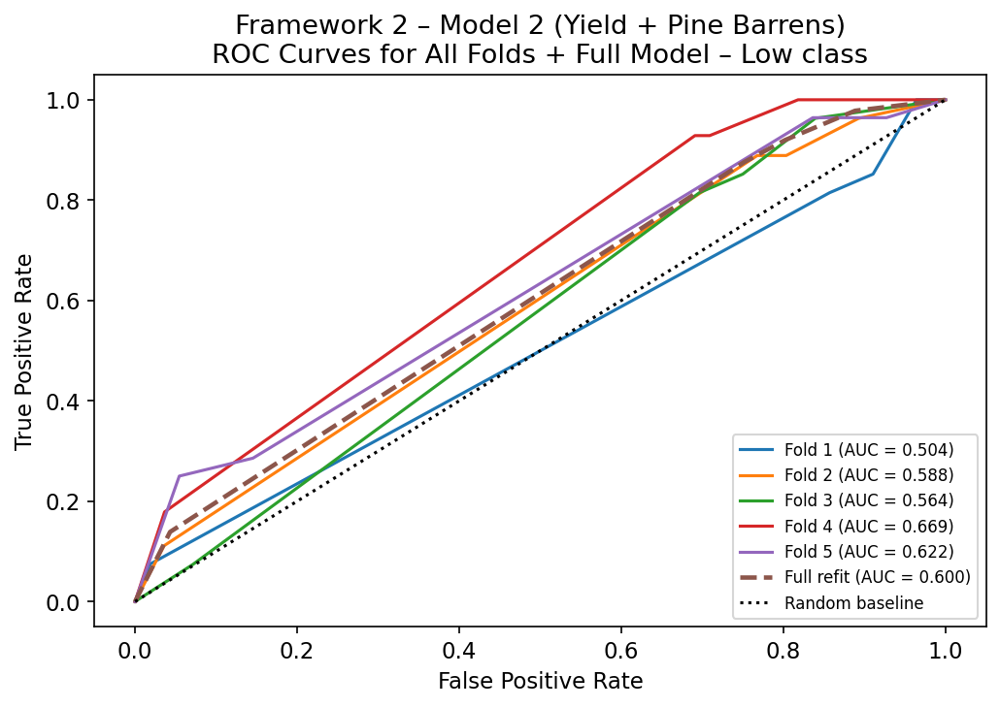

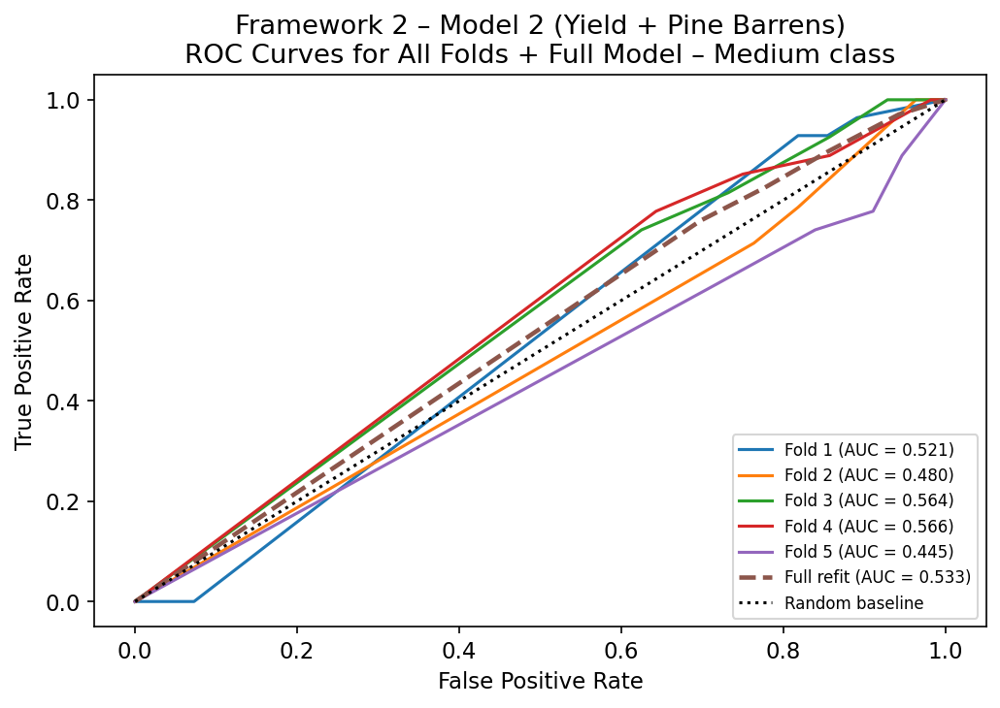

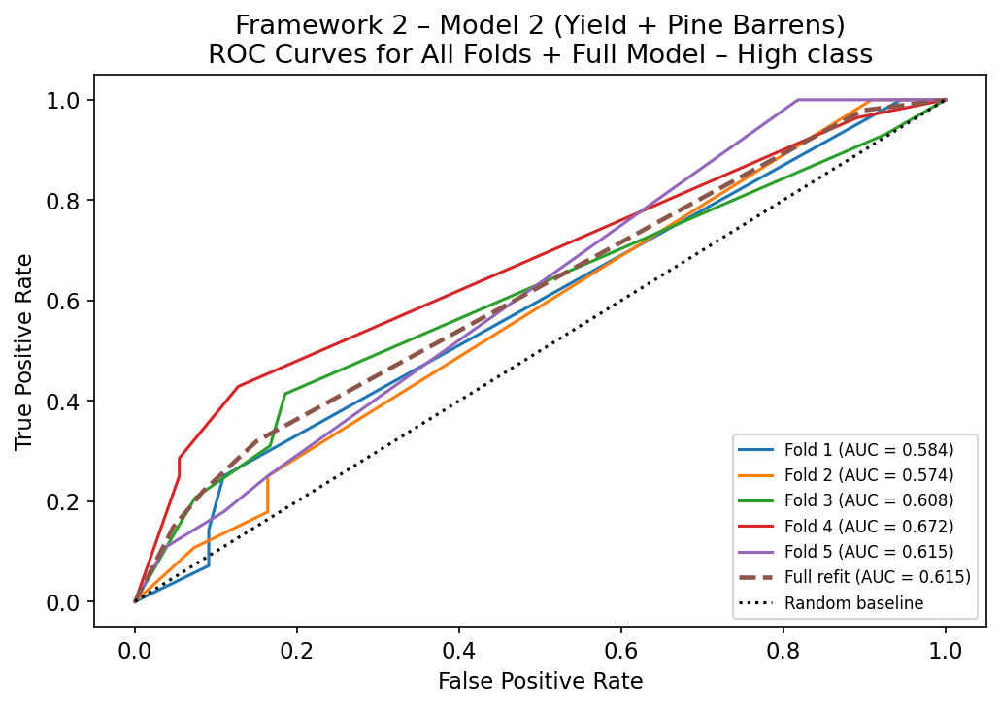


Framework 2 – Model 2 (Yield + Pine Barrens) – per-class AUC by fold:
  Low: mean AUC = 0.589 ± 0.056 (folds: ['0.504', '0.588', '0.564', '0.669', '0.622'])
  Medium: mean AUC = 0.515 ± 0.047 (folds: ['0.521', '0.480', '0.564', '0.566', '0.445'])
  High: mean AUC = 0.610 ± 0.034 (folds: ['0.584', '0.574', '0.608', '0.672', '0.615'])
Framework 2 – Model 2 (Yield + Pine Barrens) – full-refit per-class AUC: {0: np.float64(0.5999054770781915), 1: np.float64(0.5330830226329885), 2: np.float64(0.6145881865714138)}


In [160]:
# Framework 2 – Model 2
X_yield_pine = yield_env[pine_feature_cols].values
y_yield_pine = yield_env["y_yield"].astype(int).values

plot_multiclass_roc_all_folds_and_full(
    X=X_yield_pine,
    y=y_yield_pine,
    class_names=class_names_yield,
    model_name="Framework 2 – Model 2 (Yield + Pine Barrens)",
)

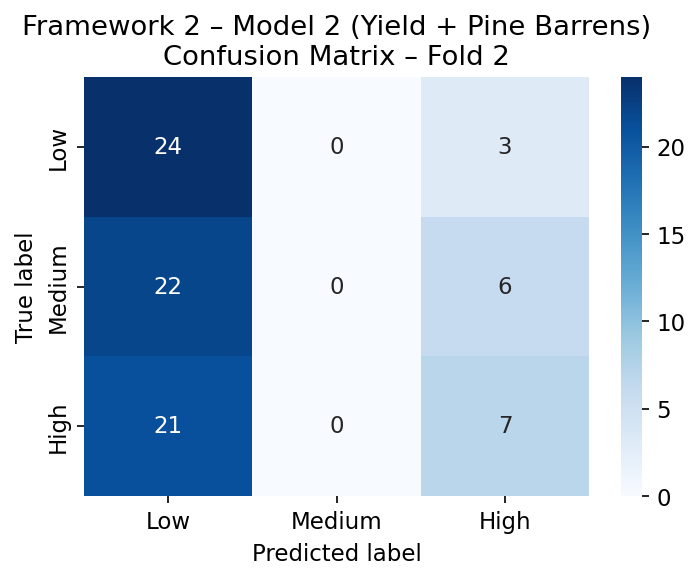

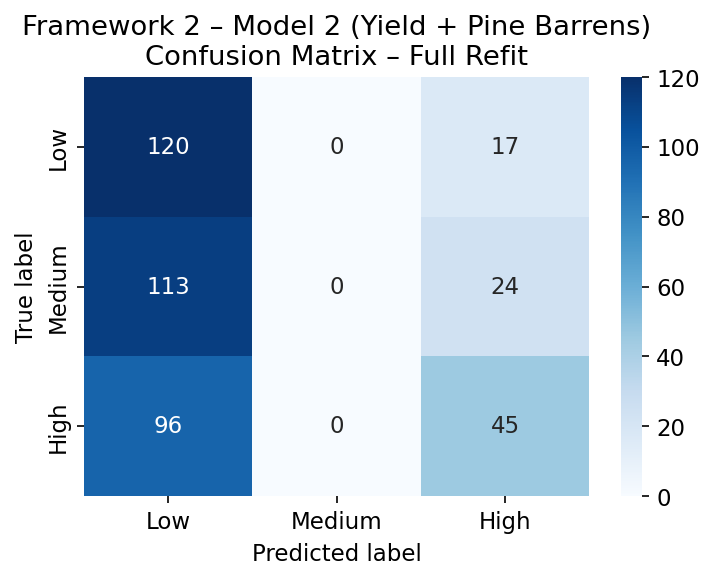

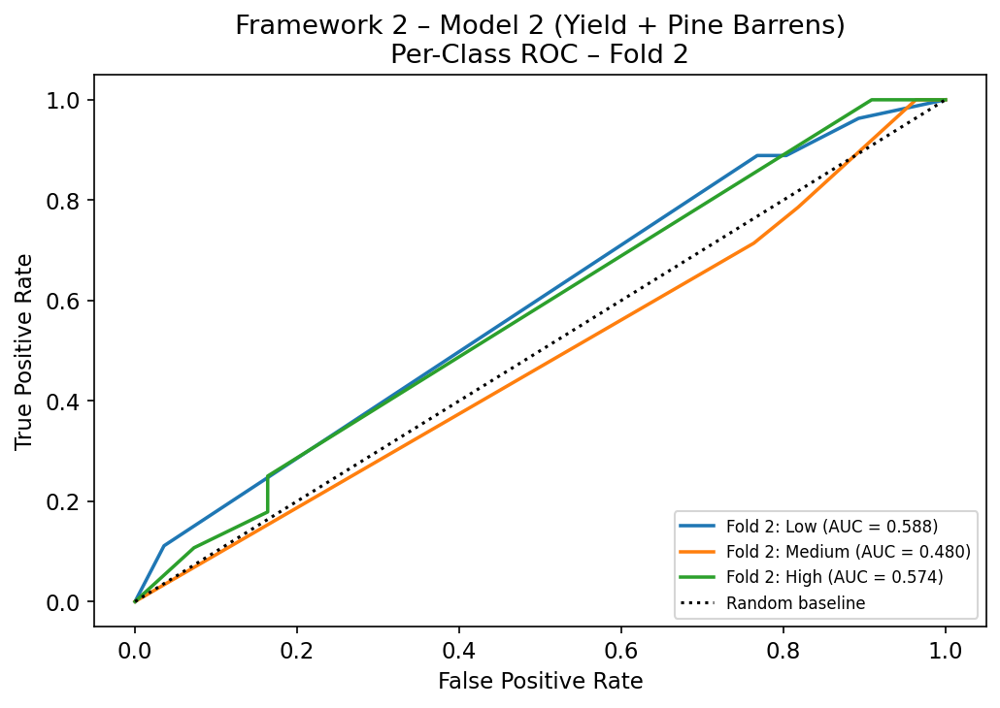

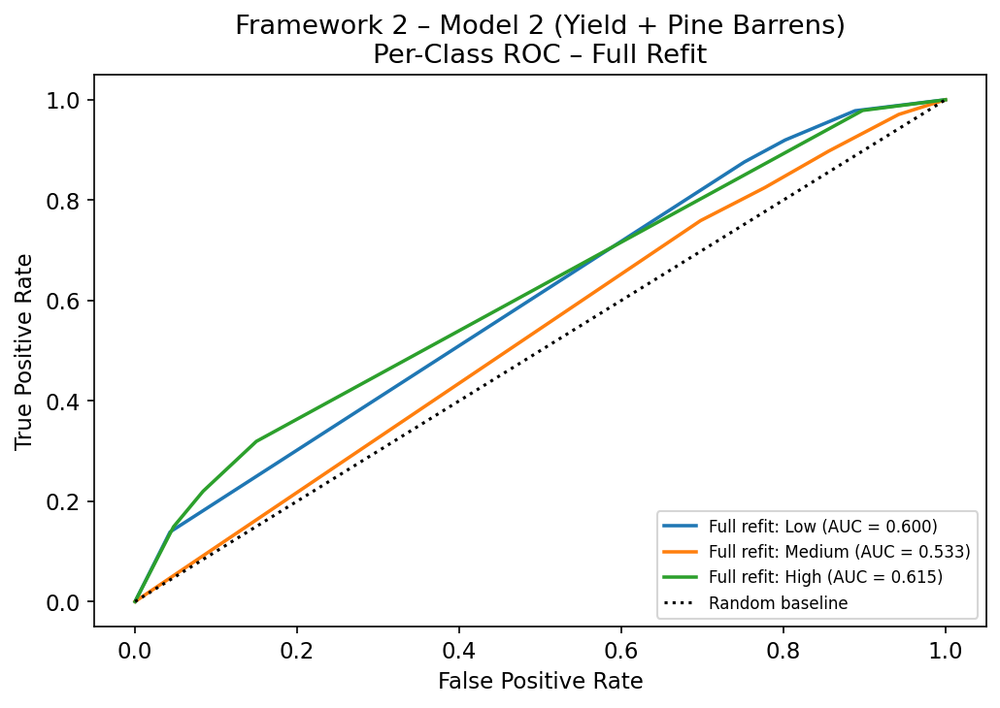

Framework 2 – Model 2 (Yield + Pine Barrens) – Fold 2 per-class AUC: {0: np.float64(0.5876322751322751), 1: np.float64(0.4798701298701299), 2: np.float64(0.5737012987012986)}
Framework 2 – Model 2 (Yield + Pine Barrens) – Full refit per-class AUC: {0: np.float64(0.5999054770781915), 1: np.float64(0.5330830226329885), 2: np.float64(0.6145881865714138)}


In [162]:
# Features and labels for Framework 2 – Model 2 (Yield + Pine Barrens)
X_yield_pine = yield_env[feature_cols_yield].values   # or pine_feature_cols
y_yield_pine = yield_env["y_yield"].astype(int).values

plot_multiclass_confusion_and_roc(
    X=X_yield_pine,
    y=y_yield_pine,
    class_names=class_names_yield,  # ["Low", "Medium", "High"]
    model_name="Framework 2 – Model 2 (Yield + Pine Barrens)",
)


Model 2 (Yield + Pine) summary: {'rf_macro_f1_mean': 0.3951048951048951, 'rf_macro_f1_std': 0.10934687240394238, 'rf_macro_auc_mean': 0.6687342923280423, 'rf_macro_auc_std': 0.05877667170299584, 'dummy_macro_f1_mean': 0.19383541295306, 'dummy_macro_f1_std': 0.005609419754404948, 'dummy_macro_auc_mean': 0.5, 'dummy_macro_auc_std': 0.0, 'class_counts': [36, 33, 48], 'n_samples': 117, 'n_splits': 5}
Export dir: framework2_model2_yield_pine_exports


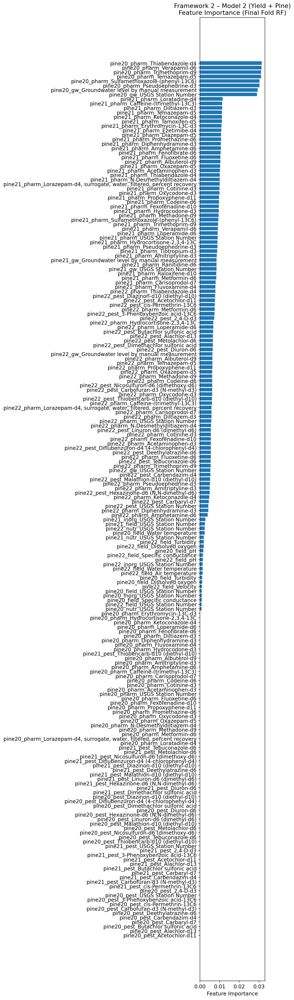

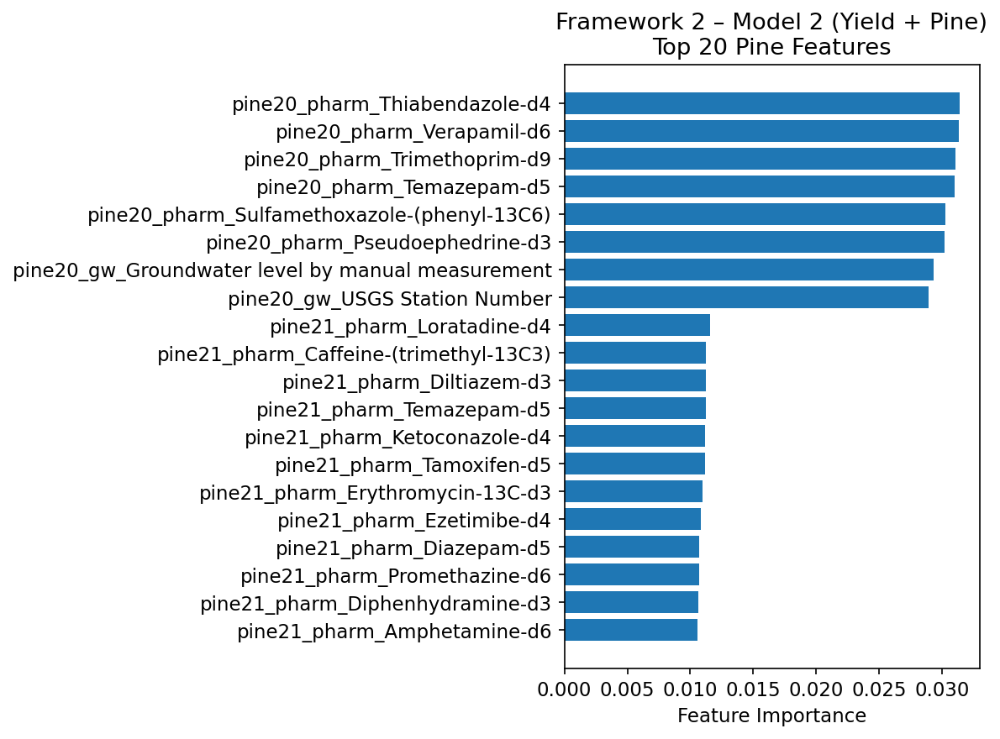

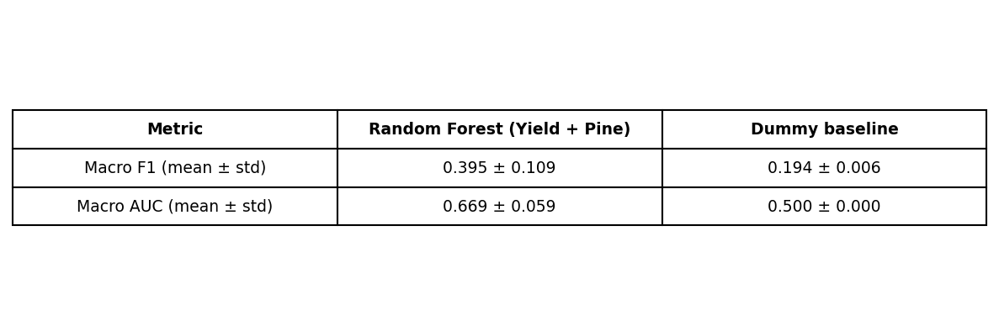

Created zip: framework2_model2_yield_pine_bundle.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [163]:
from google.colab import files as colab_files  # avoid name clash


# --- 1. Safety checks ---
try:
    _ = rf.feature_importances_
except NameError as e:
    raise RuntimeError(
        "rf (RandomForest model) is not defined. "
        "Make sure you run the Model 2 training cell first."
    )

if "feature_cols_yield" not in globals():
    raise RuntimeError(
        "feature_cols_yield is not defined. Run the Model 2 setup cell first."
    )


# --- 2. Compute summary metrics for Model 2 ---
summary_pine = {
    "rf_macro_f1_mean": float(np.mean(f1_rf)),
    "rf_macro_f1_std":  float(np.std(f1_rf)),
    "rf_macro_auc_mean": float(np.mean(auc_rf)),
    "rf_macro_auc_std":  float(np.std(auc_rf)),
    "dummy_macro_f1_mean": float(np.mean(f1_dummy)),
    "dummy_macro_f1_std":  float(np.std(f1_dummy)),
    "dummy_macro_auc_mean": float(np.mean(auc_dummy)),
    "dummy_macro_auc_std":  float(np.std(auc_dummy)),
    "class_counts": np.bincount(y).tolist(),
    "n_samples": int(len(y)),
    "n_splits": 5,
}

print("Model 2 (Yield + Pine) summary:", summary_pine)


# --- 3. Export directory ---
EXPORT_DIR = Path("framework2_model2_yield_pine_exports")
EXPORT_DIR.mkdir(exist_ok=True)
print("Export dir:", EXPORT_DIR)


# --- 4. Feature importance plots (PNG) ---

importances = rf.feature_importances_
sorted_idx = np.argsort(importances)

# 4.1 Full feature importance
plt.figure(figsize=(8, max(4, len(feature_cols_yield) * 0.15)))
plt.barh(
    [feature_cols_yield[i] for i in sorted_idx],
    importances[sorted_idx]
)
plt.xlabel("Feature Importance")
plt.title("Framework 2 – Model 2 (Yield + Pine)\nFeature Importance (Final Fold RF)")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "pine_feature_importance_all.png", dpi=300)
plt.show()

# 4.2 Top 20 features (if there are many)
top_k = min(20, len(feature_cols_yield))
top_idx = np.argsort(importances)[-top_k:]

plt.figure(figsize=(8, max(4, top_k * 0.3)))
plt.barh(
    [feature_cols_yield[i] for i in top_idx],
    importances[top_idx]
)
plt.xlabel("Feature Importance")
plt.title("Framework 2 – Model 2 (Yield + Pine)\nTop 20 Pine Features")
plt.tight_layout()
plt.savefig(EXPORT_DIR / "pine_feature_importance_top20.png", dpi=300)
plt.show()


# --- 5. Training results table: CSV + PNG ---

results_table = pd.DataFrame(
    {
        "Metric": [
            "Macro F1 (mean ± std)",
            "Macro AUC (mean ± std)",
        ],
        "Random Forest (Yield + Pine)": [
            f"{summary_pine['rf_macro_f1_mean']:.3f} ± {summary_pine['rf_macro_f1_std']:.3f}",
            f"{summary_pine['rf_macro_auc_mean']:.3f} ± {summary_pine['rf_macro_auc_std']:.3f}",
        ],
        "Dummy baseline": [
            f"{summary_pine['dummy_macro_f1_mean']:.3f} ± {summary_pine['dummy_macro_f1_std']:.3f}",
            f"{summary_pine['dummy_macro_auc_mean']:.3f} ± {summary_pine['dummy_macro_auc_std']:.3f}",
        ],
    }
)

# 5.1 CSV table
results_table.to_csv(EXPORT_DIR / "model2_yield_pine_training_results_table.csv", index=False)

# 5.2 PNG table for the paper
fig, ax = plt.subplots(figsize=(8, 2.8))
ax.axis("off")

table_data = [results_table.columns.tolist()] + results_table.values.tolist()
table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)

table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.6)

for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(EXPORT_DIR / "model2_yield_pine_training_results_table.png", dpi=300, bbox_inches="tight")
plt.show()

# 5.3 Raw JSON summary
with open(EXPORT_DIR / "model2_yield_pine_training_results.json", "w") as f:
    json.dump(summary_pine, f, indent=2)


# --- 6. Graph-series JSON (for recreating plots later) ---

graphs_json = {}

# 6.1 Full feature importance series
graphs_json["pine_feature_importance_all"] = {
    "feature": feature_cols_yield,
    "importance": importances.tolist(),
    "title": "Framework 2 – Model 2 (Yield + Pine) Feature Importance",
    "x_label": "Importance",
    "y_label": "Feature",
}

# 6.2 Top-20 subset (ordered from lowest → highest as in barh)
graphs_json["pine_feature_importance_top20"] = {
    "feature": [feature_cols_yield[i] for i in top_idx],
    "importance": importances[top_idx].tolist(),
    "title": "Framework 2 – Model 2 (Yield + Pine) Top 20 Features",
    "x_label": "Importance",
    "y_label": "Feature",
    "top_k": int(top_k),
}

with open(EXPORT_DIR / "framework2_model2_yield_pine_graph_data.json", "w") as f:
    json.dump(graphs_json, f, indent=2)


# --- 7. Zip everything and download ---

zip_path = "framework2_model2_yield_pine_bundle.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    for root, dirs, filenames in os.walk(EXPORT_DIR):
        for fname in filenames:
            full_path = Path(root) / fname
            # store paths inside zip relative to EXPORT_DIR
            rel_path = full_path.relative_to(EXPORT_DIR)
            zf.write(full_path, arcname=rel_path)

print("Created zip:", zip_path)
colab_files.download(zip_path)

##Explainability and Feature Attribution
SHAP explanations (summary + beeswarm + per-class)

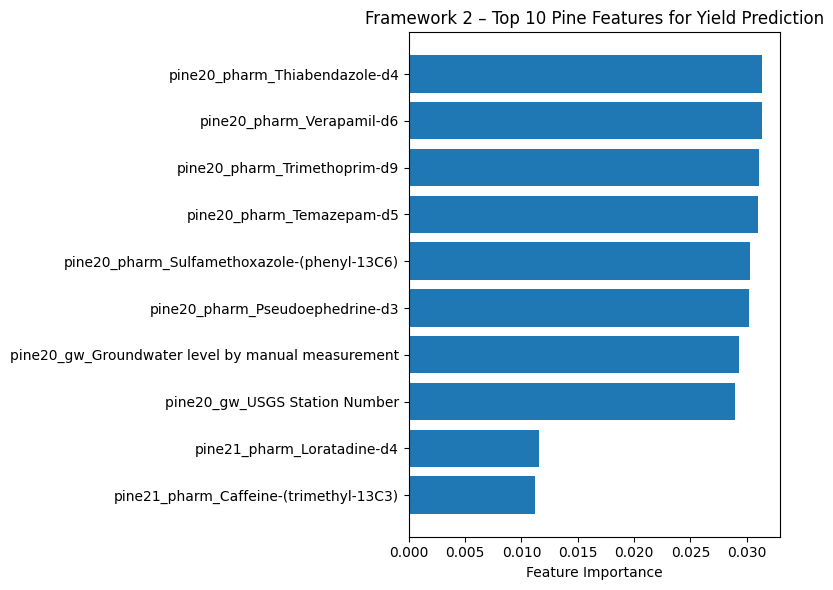

In [ ]:
importances = rf.feature_importances_
feature_names = np.array(X.columns)

top_k = 10
top_idx = np.argsort(importances)[-top_k:]

plt.figure(figsize=(8, 6))
plt.barh(feature_names[top_idx], importances[top_idx])
plt.xlabel("Feature Importance")
plt.title("Framework 2 – Top 10 Pine Features for Yield Prediction")
plt.tight_layout()
plt.show()

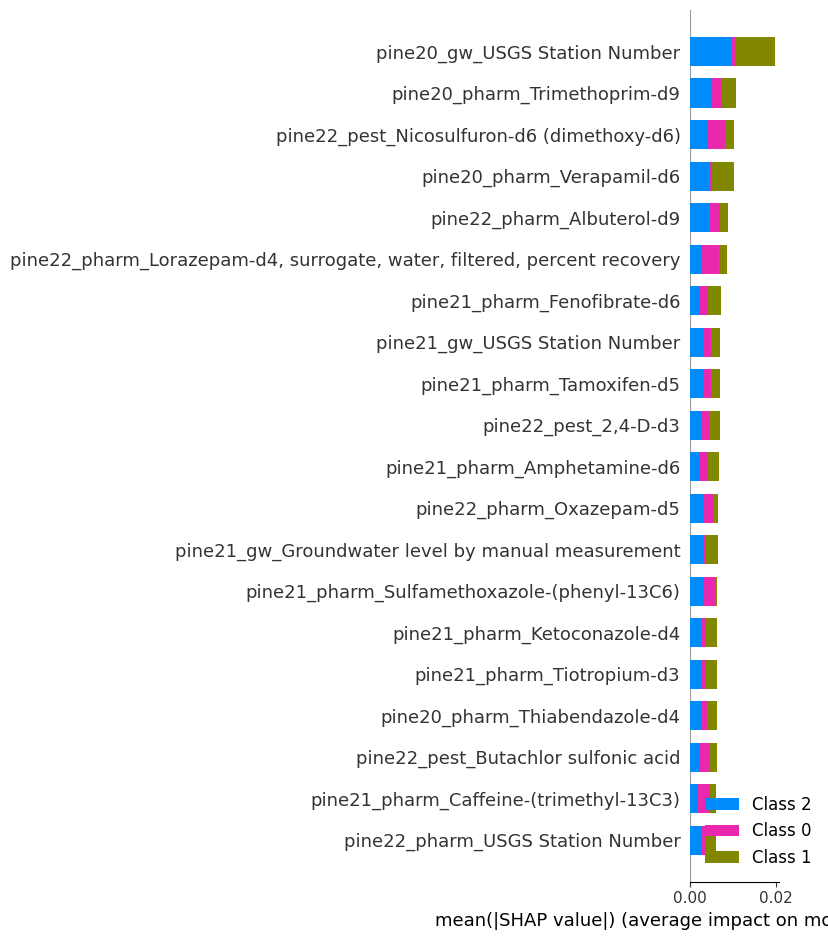

In [ ]:
!pip install shap
import shap

# Use a smaller background for speed (e.g., 50 samples)
background = X.sample(n=min(50, len(X)), random_state=42)

explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(background)

# Global importance (all classes combined)
shap.summary_plot(shap_values, background, plot_type="bar")


In [ ]:
print("X shape:", X.shape)
print("Number of features:", X.shape[1])
print("Trained RF expects:", rf.n_features_in_)

X shape: (117, 196)
Number of features: 196
Trained RF expects: 196


In [ ]:
# Use the same features RF was trained on
X_bg = X.copy()         # DataFrame, not numpy
X_bg = X_bg.reset_index(drop=True)

explainer = shap.TreeExplainer(rf)

# VERY IMPORTANT: use X_bg *here*:
shap_values = explainer.shap_values(X_bg)

# Inspect shapes
if isinstance(shap_values, list):
    for i, arr in enumerate(shap_values):
        print(f"class {i} shap_values shape:", arr.shape)
else:
    print("shap_values shape:", shap_values.shape)

print("X_bg shape:", X_bg.shape)

shap_values shape: (117, 196, 3)
X_bg shape: (117, 196)


sv_high shape: (117, 196)
X_bg shape: (117, 196)


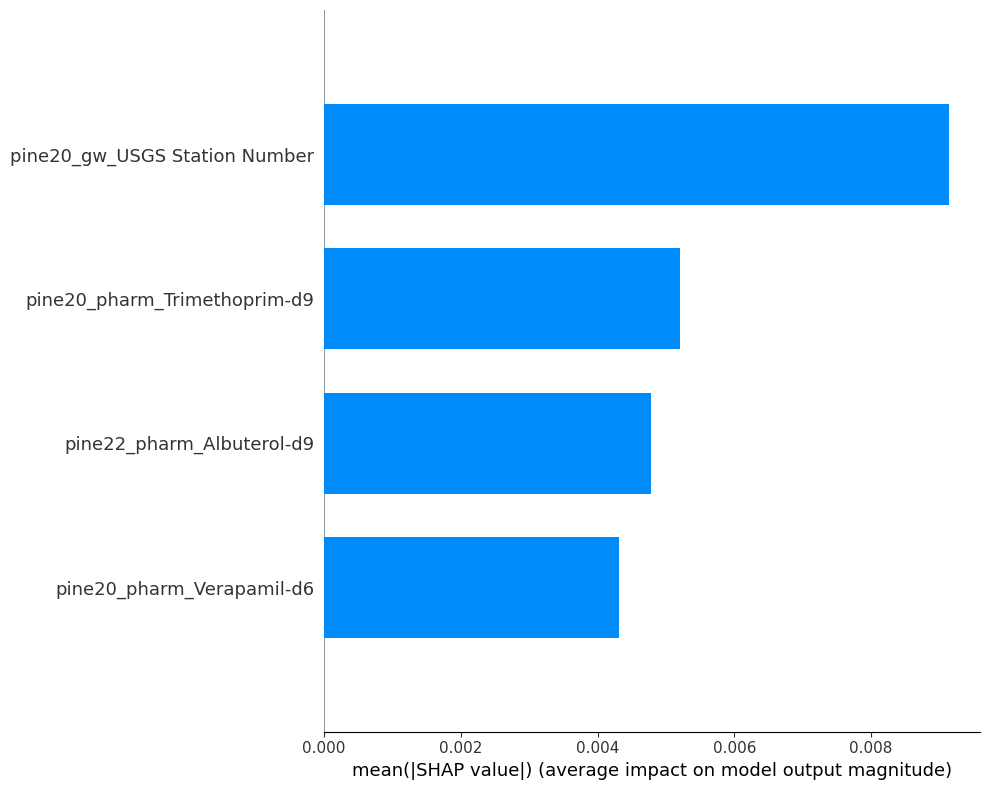

In [ ]:
# High-yield class index
high_class = 2

# Extract SHAP values for class 2
sv_high = shap_values[:, :, high_class]  # shape (n_samples, n_features)

print("sv_high shape:", sv_high.shape)
print("X_bg shape:", X_bg.shape)

shap.summary_plot(
    sv_high,
    X_bg,
    feature_names=X_bg.columns,
    plot_type="bar",
    max_display=4,            # top 20
    plot_size=(10, 8)          # wider & taller
)

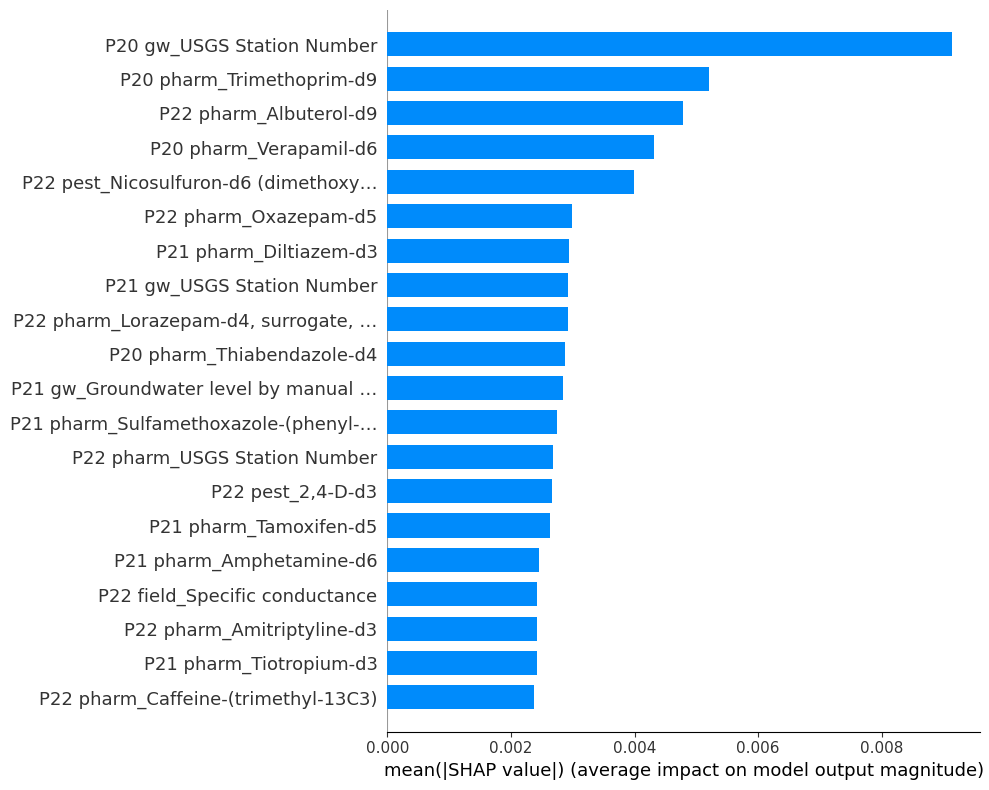

In [ ]:
orig_names = X_bg.columns.tolist()
short_names = []

for name in orig_names:
    label = name

    # strip noisy prefixes
    label = label.replace("pine20_", "P20 ")
    label = label.replace("pine21_", "P21 ")
    label = label.replace("pine22_", "P22 ")

    # optional: shorten very long chemical descriptions
    if len(label) > 35:
        label = label[:35] + "…"

    short_names.append(label)

shap.summary_plot(
    sv_high,
    X_bg,
    feature_names=short_names,
    plot_type="bar",
    max_display=20,
    plot_size=(10, 8)
)


In [ ]:
top_idx = np.argsort(np.abs(sv_high).mean(0))[::-1][:20]
for i in top_idx:
    print(f"{short_names[i]:40s}  ->  {orig_names[i]}")


P20 gw_USGS Station Number                ->  pine20_gw_USGS Station Number
P20 pharm_Trimethoprim-d9                 ->  pine20_pharm_Trimethoprim-d9
P22 pharm_Albuterol-d9                    ->  pine22_pharm_Albuterol-d9
P20 pharm_Verapamil-d6                    ->  pine20_pharm_Verapamil-d6
P22 pest_Nicosulfuron-d6 (dimethoxy…      ->  pine22_pest_Nicosulfuron-d6 (dimethoxy-d6)
P22 pharm_Oxazepam-d5                     ->  pine22_pharm_Oxazepam-d5
P21 pharm_Diltiazem-d3                    ->  pine21_pharm_Diltiazem-d3
P21 gw_USGS Station Number                ->  pine21_gw_USGS Station Number
P22 pharm_Lorazepam-d4, surrogate, …      ->  pine22_pharm_Lorazepam-d4, surrogate, water, filtered, percent recovery
P20 pharm_Thiabendazole-d4                ->  pine20_pharm_Thiabendazole-d4
P21 gw_Groundwater level by manual …      ->  pine21_gw_Groundwater level by manual measurement
P21 pharm_Sulfamethoxazole-(phenyl-…      ->  pine21_pharm_Sulfamethoxazole-(phenyl-13C6)
P22 pharm_USGS St

####Exports

In [ ]:
!pip install shap -q
from google.colab import files as colab_files

# --- 2. Correct handling of multi-class / binary SHAP values ---

if isinstance(shap_values, list):
    # Classic multi-class: list of (n_samples, n_features) arrays
    n_classes = len(shap_values)
    high_class = min(2, n_classes - 1)  # prefer class 2 if it exists
    sv_high = shap_values[high_class]   # (n_samples, n_features)
    print(f"Detected multi-class list with {n_classes} classes. Using high_class = {high_class}.")
else:
    # shap_values is a single ndarray
    if shap_values.ndim == 3:
        # shape: (n_samples, n_features, n_classes)
        n_samples, n_features, n_classes = shap_values.shape
        high_class = min(2, n_classes - 1)
        sv_high = shap_values[:, :, high_class]   # (n_samples, n_features)
        print(f"Detected multi-class array {shap_values.shape}. Using high_class = {high_class}.")
    elif shap_values.ndim == 2:
        # shape: (n_samples, n_features) – binary (class 1)
        n_samples, n_features = shap_values.shape
        n_classes = 2
        high_class = 1
        sv_high = shap_values
        print("Detected binary RF. Treating shap_values as class 1 explanation.")
    else:
        raise ValueError(f"Unexpected shap_values.ndim = {shap_values.ndim}")

print("sv_high shape (after fixing):", sv_high.shape)
print("X_bg shape:", X_bg.shape)

orig_names = list(X_bg.columns)

# --- 3. (Optional) rebuild short_names if needed ---

short_names = []
for name in orig_names:
    label = name
    label = label.replace("pine20_", "P20 ")
    label = label.replace("pine21_", "P21 ")
    label = label.replace("pine22_", "P22 ")
    if len(label) > 35:
        label = label[:35] + "…"
    short_names.append(label)

# --- 4. Top-20 SHAP features (high-yield class) + table ---

mean_abs_shap = np.abs(sv_high).mean(axis=0)   # (n_features,)
top_k = min(20, len(orig_names))
top_idx = np.argsort(mean_abs_shap)[::-1][:top_k]  # 1D array of ints

top_ranks = np.arange(1, top_k + 1)
top_short = [short_names[int(i)] for i in top_idx]
top_full  = [orig_names[int(i)] for i in top_idx]
top_vals  = mean_abs_shap[top_idx]

df_top = pd.DataFrame(
    {
        "Rank": top_ranks,
        "Display name": top_short,
        "Full feature name": top_full,
        "Mean |SHAP| (high-yield class)": top_vals,
    }
)

EXPORT_DIR = Path("framework2_model2_yield_pine_exports")
EXPORT_DIR.mkdir(exist_ok=True)

# 4.1 Save as CSV
df_top.to_csv(EXPORT_DIR / "shap_top20_high_class_features.csv", index=False)

# 4.2 Save PNG table
fig, ax = plt.subplots(figsize=(10, 0.4 * (top_k + 2)))
ax.axis("off")

table_data = [df_top.columns.tolist()] + df_top.values.tolist()
table = ax.table(
    cellText=table_data,
    loc="center",
    cellLoc="center",
)
table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.1, 1.4)

for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight="bold")

fig.tight_layout()
fig.savefig(
    EXPORT_DIR / "shap_top20_high_class_features_table.png",
    dpi=300,
    bbox_inches="tight"
)
plt.close()

print("Saved SHAP top-20 table PNG and CSV.")

# --- 5. JSON for SHAP ranking (for re-creating plots later) ---

shap_json = {
    "high_class_index": int(high_class),
    "feature_order_top20": top_full,
    "display_names_top20": top_short,
    "mean_abs_shap_top20": top_vals.tolist(),
    "all_features": orig_names,
}

with open(EXPORT_DIR / "framework2_model2_yield_pine_shap_top20.json", "w") as f:
    json.dump(shap_json, f, indent=2)

print("Saved SHAP top-20 JSON.")

# --- 6. Rebuild ZIP including these files ---

zip_path = "framework2_model2_yield_pine_bundle.zip"

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    for root, dirs, filenames in os.walk(EXPORT_DIR):
        for fname in filenames:
            full_path = Path(root) / fname
            rel_path = full_path.relative_to(EXPORT_DIR)
            zf.write(full_path, arcname=rel_path)

print("Updated zip with SHAP outputs:", zip_path)
colab_files.download(zip_path)

Detected multi-class array (117, 196, 3). Using high_class = 2.
sv_high shape (after fixing): (117, 196)
X_bg shape: (117, 196)
Saved SHAP top-20 table PNG and CSV.
Saved SHAP top-20 JSON.
Updated zip with SHAP outputs: framework2_model2_yield_pine_bundle.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##Model Export

In [ ]:
FRONTEND_DATA = Path("frontend_data")
FRONTEND_DATA.mkdir(exist_ok=True)

# NYC distribution monthly (Framework 1A)
dist_export = dist_monthly[[
    "site", "year_month",
    "residual_chlorine_mean",
    "turbidity_mean",
    "fluoride_mean",
    "y"
]].copy()

dist_export.to_json(
    FRONTEND_DATA / "dist_monthly.json",
    orient="records"
)

# Surface waters monthly (Framework 1B) – only 1970+ for consistency
surf_export = dm_1970[[
    "month_start",
    "domain",
    "temp_C_mean",
    "turbidity_ntu_mean",
    "ph_mean",
    "cond_uscm_mean",
    "nitrate_mgL_mean",
    "phosphorus_mgL_mean",
    "y_surface"
]].copy()

surf_export["month_start"] = surf_export["month_start"].dt.strftime("%Y-%m-%d")

surf_export.to_json(
    FRONTEND_DATA / "surface_monthly.json",
    orient="records"
)

# Yield panel with label (Framework 2)
yield_export = panel[[
    "YEAR",
    "COUNTY_NAME",
    "COMMODITY",
    "YIELD",
    "y_yield"
]].copy()

yield_export.to_json(
    FRONTEND_DATA / "yield_panel.json",
    orient="records"
)

In [ ]:
files.download("frontend_data/dist_monthly.json")
files.download("frontend_data/surface_monthly.json")
files.download("frontend_data/yield_panel.json")